In [42]:
%load_ext autoreload
%autoreload 2
import os
import sys
import pickle

sys.path.append(os.path.abspath("../analysis_tools/"))
from utils import * 

# pycytominer imports
from pycytominer import aggregate, annotate, normalize, feature_select
from pycytominer import feature_select

# load first few rows from parquet
import fastparquet

# for median absolute deviation
import scipy.stats as ss
from scipy.special import logit

# kernel ridge regression
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import LinearRegression
from sklearn.svm import LinearSVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import roc_curve, auc, precision_score, recall_score, roc_auc_score, confusion_matrix

# make cell crops
import skimage.io

# upset plots
from upsetplot import generate_counts, plot
from upsetplot import UpSet

# coloring legends
from matplotlib.patches import Patch
import matplotlib.lines as mlines

# venn
from matplotlib_venn import venn3, venn3_circles


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# Import other datasets/
# import splice filtered variants + AlphaMissense scores
spliceAI_filtered_variants = \
    pd.read_csv('../PTEN_iPSC_T3_pycytominer_120524/PTEN_AM_CV.csv')

# import ClinVAR data
clinvar_variants_annotated_PTENT3 = \
    pd.read_csv('../PTEN_iPSC_T3_pycytominer_120524/clinvar_result_PTENT3_annotated_conflictingresolvednewest.csv')

# import COSMIC data 
cosmic_variants_pten = \
    pd.read_csv('../PTEN_iPSC_T3_pycytominer_120524/COSMIC_PTEN_121224.tsv', sep='\t')

# import Mighell activity scan data (Yeast phosphatase assay)
activity_yeast_data = \
    pd.read_excel('./1-s2.0-S0002929718301071-mmc2.xlsx', sheet_name='Table S2', skiprows=[0])

# import Matreyek abundance scan data (VAMPseq)
abundance_HEK_data = \
    pd.read_csv('./13073_2021_984_MOESM2_ESM.tsv', sep='\t')

# Define one way to color variants, use when highlighting specific variants
variant_type_palette = \
    {'Single Missense':'grey',
     'Synonymous':'darkgreen',
     'Frameshift':'purple', 
     '3nt Deletion':'blue', 
     'Nonsense':'red', 
     'Other':'brown'}
mutation_types = ['3nt Deletion', 
                  'Single Missense', 
                  'Synonymous', 
                  'Nonsense', 
                  'Frameshift', 
                  'Other']


In [3]:
# information about pten
start_pos=112
end_pos=172
PTEN_domain_map = {}
for pos in range(start_pos, end_pos+1):
    if ((pos>=123) & (pos<=130)):
        PTEN_domain_map[pos] = "P loop"
    elif ((pos>=165) & (pos<=171)):
        PTEN_domain_map[pos] = "TI loop"
    else:
        PTEN_domain_map[pos] = "Other Phosphatase Domain"
PTEN_domain_coloring = {
    'Other Phosphatase Domain':'grey',
    'P loop':'lightcoral',
    'TI loop':'powderblue'
}
pymol_ptenview3 = \
'''set_view (\
    -0.839138746,   -0.157006517,   -0.520763457,\
     0.174852356,    0.828741431,   -0.531615376,\
     0.515042126,   -0.537154317,   -0.667978406,\
    -0.000375278,    0.000023644, -226.242431641,\
   109.331817627,  166.696105957,  124.016159058,\
    47.521118164,  404.805816650,  -20.000000000 )
'''


In [4]:
# Import Gwen's AUC values from xgboost training
roc_auc_pten_ipsc = pd.read_csv("../Gwen_ROC/PTEN_iPSC/results/train_results.csv")
roc_auc_pten_ipsc = \
    roc_auc_pten_ipsc[['aaChanges','test_roc_auc','Example Count']]\
        .rename(columns={'aaChanges':'Variant','test_roc_auc':'AUC ROC iPSC'})
roc_auc_pten_ipsc['Morphological Distinguishability iPSC'] = \
    roc_auc_pten_ipsc['AUC ROC iPSC'].map(lambda x: max(2*x-1,0)) 
roc_auc_pten_ipsc_controls = \
    pd.read_csv("../Gwen_ROC/PTEN_iPSC/results-control/train_results.csv")
roc_auc_pten_ipsc_controls = \
    roc_auc_pten_ipsc_controls[['aaChanges','test_roc_auc']].rename(columns={'aaChanges':'Variant','test_roc_auc':'AUC ROC iPSC'})

roc_auc_pten_neuron = pd.read_csv("../Gwen_ROC/PTEN_Neuron/results/train_results.csv")
roc_auc_pten_neuron = \
    roc_auc_pten_neuron[['aaChanges','test_roc_auc','Example Count']]\
        .rename(columns={'aaChanges':'Variant','test_roc_auc':'AUC ROC neuron'})
roc_auc_pten_neuron['Morphological Distinguishability neuron'] = \
    roc_auc_pten_neuron['AUC ROC neuron'].map(lambda x: max(2*x-1,0)) 
roc_auc_pten_neuron_controls = \
    pd.read_csv("../Gwen_ROC/PTEN_Neuron/results-control/train_results.csv")
roc_auc_pten_neuron_controls = \
    roc_auc_pten_neuron_controls[['aaChanges','test_roc_auc']].rename(columns={'aaChanges':'Variant','test_roc_auc':'AUC ROC neuron'})


In [19]:
# Process COSMIC data - thresholding and splice filtering
somatic_cancer_count_filter=10
cosmic_variants_pten_missense = \
    cosmic_variants_pten\
        .query('Type in ["Substitution - Nonsense", "Substitution - Missense"]')
cosmic_variants_pten_missense['Variant'] = \
    cosmic_variants_pten_missense['AA Mutation'].str.replace("p.","")
cosmic_variants_pten_missense_t3 = \
    cosmic_variants_pten_missense\
        .query('Position >= @start_pos and Position <= @end_pos')
# filter out spliceAI high variants
cosmic_variants_pten_missense_t3_splicefilt = \
    cosmic_variants_pten_missense_t3\
        .query('Variant in @spliceAI_filtered_variants["protein_variant"]')
#print(str(len(cosmic_variants_pten_missense_t3_splicefilt)) + ' variants after spliceAI filtering.')
cosmic_variants_pten_missense_t3_sum = \
    cosmic_variants_pten_missense_t3_splicefilt[['Variant','Count']]\
        .groupby('Variant')\
        .agg('sum')\
        .reset_index()\
        .rename(columns={'Count':'COSMIC Count'})
cosmic_variants_pten_missense_t3_sum['COSMIC High'] = \
    cosmic_variants_pten_missense_t3_sum['COSMIC Count']\
        .map(lambda x: 'Y' if x >= somatic_cancer_count_filter else 'N')
cosmic_variants_pten_missense_t3_sum['COSMIC Low'] = \
    cosmic_variants_pten_missense_t3_sum['COSMIC Count']\
        .map(lambda x: 'N' if x >= somatic_cancer_count_filter else 'Y')

# Process ClinVAR data - splice filtering
clinvar_variants_annotated_PTENT3['Variant'] = \
    clinvar_variants_annotated_PTENT3['Protein change'].map(lambda x: x.split(',')[0] \
                                                                if int(x.split(',')[0][1:-1]) >= start_pos and \
                                                                   int(x.split(',')[0][1:-1]) <= end_pos \
                                                                else x.split(',')[1])
#print(str(len(clinvar_variants_annotated_PTENT3)) + ' variants from ClinVAR.')
clinvar_variants_annotated_PTENT3['Disease Classes'] = \
    clinvar_variants_annotated_PTENT3['Condition(s)'].map(classify_clinvar_entry_pten)
# Now create the four columns:
categories_of_interest = ["PHTS", "Somatic Cancer", "Glioma susceptibility", "Macrocephaly/ASD"]
for cat in categories_of_interest:
    clinvar_variants_annotated_PTENT3[cat] = \
        clinvar_variants_annotated_PTENT3['Disease Classes'].apply(lambda x: "Y" if cat in x else "N")
# read spliceAI filtered variants from SF
clinvar_variants_annotated_PTENT3_splicefilt = \
    clinvar_variants_annotated_PTENT3\
        .query('Variant in @spliceAI_filtered_variants["protein_variant"]')


In [6]:
# Load Abbye's combined variant curations
pten_probands_AM = pd.read_csv('./PTEN_probands_AM_051325.csv')
pten_probands_AM['ASD/DD'] = \
    pten_probands_AM.apply(lambda row: 'Yes' if (row['Autism']=='Yes' or row['DD/ID']=='Yes') else 'No', axis=1)
pten_probands_AM['PHTS'] = \
    pten_probands_AM.apply(lambda row: 'Yes' if (row['PHTS']=='Yes' or row['CS']=='Yes' or row['BRRS']=='Yes') else 'No', axis=1)

# 1) Three‐letter ⇒ one‐letter map
aa_map = {
    'Ala':'A','Arg':'R','Asn':'N','Asp':'D','Cys':'C',
    'Glu':'E','Gln':'Q','Gly':'G','His':'H','Ile':'I',
    'Leu':'L','Lys':'K','Met':'M','Phe':'F','Pro':'P',
    'Ser':'S','Thr':'T','Trp':'W','Tyr':'Y','Val':'V'
}

# assume your DataFrame is named pten_probands_AM
df = pten_probands_AM[['Variant','PHTS', 'ASD/DD']].copy()

# 2) extract the AA change like Arg130Gln → R130Q
pattern = r'([A-Za-z]{3})(\d+)([A-Za-z]{3})'
df['Variant_short'] = (
    df['Variant']
      .str.extract(pattern)
      .apply(lambda x: f"{aa_map[x[0]]}{x[1]}{aa_map[x[2]]}", axis=1)
)

# 3) select and binarize the phenotypes
phenos = ['PHTS','ASD/DD']
# map Yes→1, everything else→0
df_bin = (
    df[['Variant_short'] + phenos]
      .replace({'Yes': 1, 'No': 0, 'Unknown': 0})
)
# 4) group and average to get fractions
pten_variantbyphenotype_AM = \
(
    df_bin
      .groupby('Variant_short', as_index=False)
      .mean()
      .rename(columns={'Variant_short':'Variant'})
)

# 5) remove splicing variants
pten_variantbyphenotype_AM_splicefilt = \
    pten_variantbyphenotype_AM\
        .query('Variant in @spliceAI_filtered_variants["protein_variant"]')


In [7]:
# Load gnomad dataset
gnomad_PTEN_df = \
    pd.read_csv('./gnomAD_v4.1.0_ENSG00000171862_2025_05_14_08_18_37.csv')
gnomad_PTEN_df = \
    gnomad_PTEN_df[['Protein Consequence','VEP Annotation','ClinVar Germline Classification','Allele Count','Allele Frequency']]

# Remove path/LP
gnomad_PTEN_filt_df = \
    gnomad_PTEN_df[~(gnomad_PTEN_df['ClinVar Germline Classification'].str.contains("Likely path|Path", na=False))]

# Remove deletions
gnomad_PTEN_filt_df = \
    gnomad_PTEN_filt_df[~gnomad_PTEN_filt_df['Protein Consequence'].str.contains("del")]

# Convert variant format
def to_short(hgvs):
    """
    Convert e.g. "p.Tyr88Phe" → "Y88F".
    Returns None if it doesn’t match the expected pattern.
    """
    m = re.match(r'^p\.([A-Za-z]{3})(\d+)([A-Za-z]{3})$', hgvs)
    if not m:
        return None
    start_3, pos, end_3 = m.groups()
    return f"{aa_map[start_3]}{pos}{aa_map[end_3]}"
gnomad_PTEN_filt_df['Variant'] = \
    gnomad_PTEN_filt_df['Protein Consequence'].apply(to_short)

# Remove splicing variants
gnomad_PTEN_filt_df = \
    gnomad_PTEN_filt_df\
        .query('Variant in @spliceAI_filtered_variants["protein_variant"]')
gnomad_PTEN_filt_df = gnomad_PTEN_filt_df[['Variant','Allele Frequency']]


In [8]:
# EVE variants
pten_variants_EVE = \
    pd.read_csv('./PTEN_HUMAN.csv')
pten_variants_EVE = pten_variants_EVE[['wt_aa','position','mt_aa','EVE_scores_ASM','uncertainty_ASM']]
pten_variants_EVE = pten_variants_EVE.dropna(axis=0)
pten_variants_EVE['Variant'] = \
    pten_variants_EVE.apply(lambda row: row['wt_aa']+str(row['position']) + row['mt_aa'], axis=1)
pten_variants_EVE = pten_variants_EVE[['Variant','EVE_scores_ASM','uncertainty_ASM']]


In [9]:
# REVEL variants
pten_variants_REVEL = \
    pd.read_csv('./REVEL_PTEN.csv')
pten_variants_REVEL = \
    pten_variants_REVEL[pten_variants_REVEL['tag'].isin(['CCDS'])]

# 2. Load the GTF for GRCh38 (replace with your GTF filename)
gtf = pd.read_csv(
    '../LMNA_PBv2b_T3_pycytominer_pipelinev3_123024/Homo_sapiens.GRCh38.104.gtf.gz',
    sep='\t',
    comment='#',
    header=None,
    names=['chrom','source','feature','start','end','score','strand','frame','attribute']
)

# 3. Filter to the CDS exons of the MANE Select transcript
transcript_id = 'ENST00000371953'
mask = (
    (gtf['feature'] == 'CDS') &
    (gtf['attribute'].str.contains(f'transcript_id "{transcript_id}"')) &
    (gtf['chrom'].isin([10,'10','chr10']))
)
cds = gtf[mask].copy()

# 4. Order exons in transcript order
strand = cds['strand'].iat[0]
cds = cds.sort_values('start', ascending=(strand == '+'))
intervals = cds[['start','end']].values.tolist()

# 5. Map a genomic position to its 1‑based protein residue number
def genomic_to_residue(pos):
    cds_pos = 0
    for start, end in intervals:
        if pos < start:
            continue
        if pos > end:
            cds_pos += (end - start + 1)
            continue
        # pos is within this exon
        cds_pos += (pos - start + 1)
        return ((cds_pos - 1) // 3) + 1
    return None

# 6. Apply to get the residue number, dropping rows where it is NaN
pten_variants_REVEL['aa_pos'] = pd.to_numeric(pten_variants_REVEL['grch38_pos'].apply(genomic_to_residue), errors='coerce')
pten_variants_REVEL = pten_variants_REVEL.dropna(subset=['aa_pos']).copy()

# 7. Build the variant label
pten_variants_REVEL['Variant'] = pten_variants_REVEL['aaref'] + pten_variants_REVEL['aa_pos'].astype(int).astype(str) + pten_variants_REVEL['aaalt']
pten_variants_REVEL = pten_variants_REVEL[['Variant','REVEL']]


In [10]:
## Read merged profiles
df_profiles_merged = pd.read_csv('./consensus_features/PTENT3.merged.consensusprofiles.withimpact.053025.csv')
df_profiles_merged.drop(columns='Unnamed: 0', inplace=True)
df_profiles_merged['Variant_Class'] = \
    pd.Categorical(df_profiles_merged['Variant_Class'], categories=mutation_types)


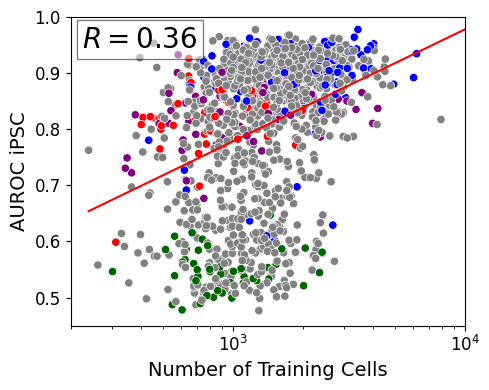

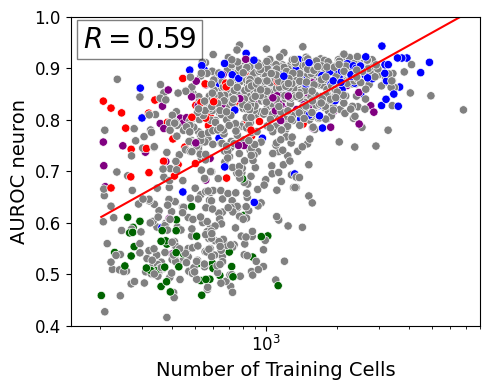

In [12]:
# Plot AUROC score vs number of example cells
graph_auc_examples(
    df_profiles_merged.merge(roc_auc_pten_ipsc, on='Variant', how='inner'),
    graph_column  = "AUC ROC iPSC",
    y_label = 'AUROC iPSC',
    img_save_path = "./consensus_plots/PTENT3.iPSC.auc_roc.trainingexamples.061225.pdf",
    log_axis = True,
    xlim = (200,10000),
    ylim = (0.45,1),
    rx = 0.03,
    ry = 0.9,
)
graph_auc_examples(
    df_profiles_merged.merge(roc_auc_pten_neuron, on='Variant', how='inner'),
    graph_column  = "AUC ROC neuron",
    y_label = 'AUROC neuron',
    img_save_path = "./consensus_plots/PTENT3.neuron.auc_roc.trainingexamples.061225.pdf",
    log_axis = True,
    xlim = (150,8000),
    ylim = (0.4,1),
    rx = 0.03,
    ry = 0.9,
)

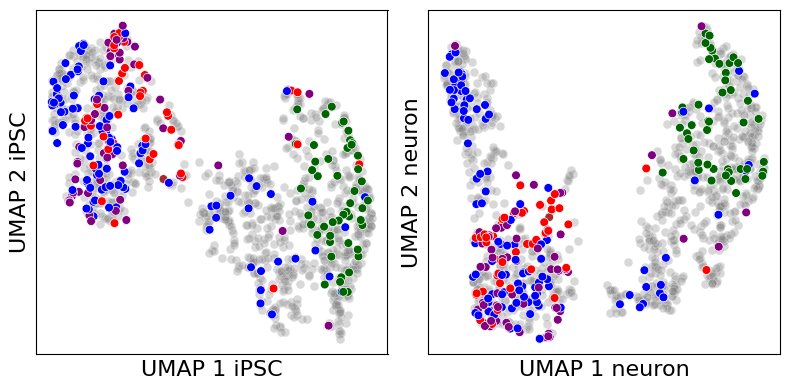

In [17]:
# Create a palette excluding 'Single Missense' for the hue-mapping plot
#other_palette = {k: v for k, v in variant_type_palette.items() if k != 'Single Missense'}

# Create subplots with 2 columns.
fig, axs = plt.subplots(figsize=(8, 4), ncols=2)

######################
# Plot for iPSC (left panel)
######################
# Split iPSC data: grey points vs other classes.
subset_grey_iPSC = df_profiles_merged[df_profiles_merged['Variant_Class'] == 'Single Missense']
subset_color_iPSC = df_profiles_merged[df_profiles_merged['Variant_Class'] != 'Single Missense']

# Plot grey points in the background
sns.scatterplot(
    data=subset_grey_iPSC, 
    x='UMAP1 iPSC', 
    y='UMAP2 iPSC', 
    color='grey', 
    alpha=0.3,
    s=40, 
    ax=axs[0]
)

# Plot the remaining variant types on top.
sns.scatterplot(
    data=subset_color_iPSC, 
    x='UMAP1 iPSC', 
    y='UMAP2 iPSC', 
    hue='Variant_Class',
    palette=variant_type_palette,
    s=40,
    ax=axs[0],
    legend=False  # No legend on this panel.
)

# Remove ticks and set axis labels.
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[0].set_xlabel('UMAP 1 iPSC', fontsize=16)
axs[0].set_ylabel('UMAP 2 iPSC', fontsize=16)

######################
# Plot for neuron (right panel)
######################
# Split neuron data: grey points vs other classes.
subset_grey_neuron = df_profiles_merged[df_profiles_merged['Variant_Class'] == 'Single Missense']
subset_color_neuron = df_profiles_merged[df_profiles_merged['Variant_Class'] != 'Single Missense']

# Plot grey points in the background with alpha=0.3.
sns.scatterplot(
    data=subset_grey_neuron, 
    x='UMAP1 neuron', 
    y='UMAP2 neuron', 
    color='grey', 
    s=40, 
    alpha=0.3,
    ax=axs[1],
    legend=False
)

# Plot the remaining variant types on top.
sns.scatterplot(
    data=subset_color_neuron, 
    x='UMAP1 neuron', 
    y='UMAP2 neuron', 
    hue='Variant_Class',
    palette=variant_type_palette,
    s=40,
    ax=axs[1],
    legend=False  # We will add a custom legend.
)

# Remove ticks and set axis labels.
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_xlabel('UMAP 1 neuron', fontsize=16)
axs[1].set_ylabel('UMAP 2 neuron', fontsize=16)

# Create custom legend handles that include Single Missense with a lower alpha.
# handles = []
# handles.append(mlines.Line2D([], [], color='grey', marker='o', linestyle='',
#                              markersize=6, alpha=0.3, label='Single\nMissense'))
# # Add the other classes
# for key in ['Synonymous', 'Frameshift', '3nt Deletion', 'Nonsense', 'Other']:
#     handles.append(mlines.Line2D([], [], color=variant_type_palette[key], marker='o', linestyle='',
#                                  markersize=6, label=key))

# # Add the legend to the neuron axis.
# axs[1].legend(handles=handles, loc='best', markerscale=2,
#               title='Variant Type', title_fontsize=12, fontsize=10)

plt.tight_layout()
fig.savefig('./consensus_plots/PTENT3.allumaps.UMAP.041225.pdf', dpi=600)
plt.show()


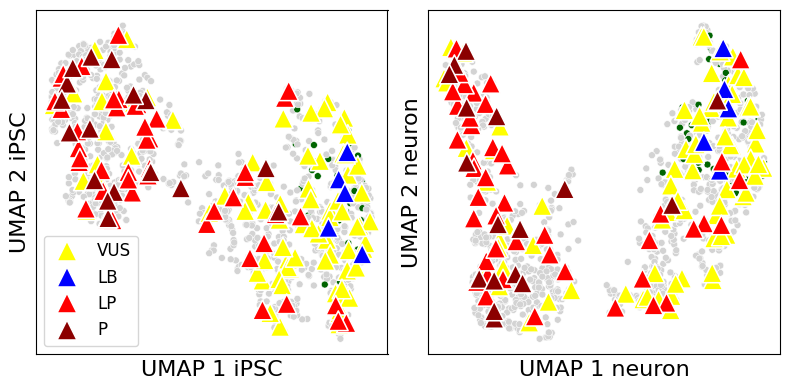

In [20]:
# Plot against clinvar designation
variants_assayed_umap_toplot = \
    df_profiles_merged.copy()
variants_assayed_umap_toplot = pd.merge(variants_assayed_umap_toplot, 
                                        clinvar_variants_annotated_PTENT3_splicefilt\
                                            [['Variant','Clinvar label']],
                                        on='Variant', 
                                        how='left')
variant_anno = \
    variants_assayed_umap_toplot\
        .query('Variant_Class == "Single Missense"')\
        .query('~`Clinvar label`.isna()')
variant_anno['zorder'] = \
    variant_anno['Clinvar label'].map({'VUS':0,'LB':1,'LP':2,'P':3})
variant_anno.sort_values(by='zorder', inplace=True)
variant_anno.rename(columns={'Clinvar label':'ClinVar'}, inplace=True)

# Plot
fig,axs=plt.subplots(figsize=(8,4),ncols=2)
sns.scatterplot(data=variants_assayed_umap_toplot, 
                x='UMAP1 iPSC',
                y='UMAP2 iPSC', 
                hue='Variant_Class', 
                color='lightgrey',
                alpha=1,
                palette={'Synonymous':'darkgreen',
                         'Single Missense':'lightgrey',
                         'Frameshift':'lightgrey', 
                         '3nt Deletion':'lightgrey', 
                         'Nonsense':'lightgrey', 
                         'Other':'lightgrey'},
                s=25,
                ax=axs[0],
                legend=False
               )

sns.scatterplot(data=variant_anno,
                x='UMAP1 iPSC',
                y='UMAP2 iPSC', 
                hue='ClinVar', 
                palette={'VUS':'yellow',
                         'LB':'blue',
                         'LP':'red',
                         'P':'darkred'},
                s=200,
                marker="^",
                ax=axs[0],
                legend=True
               )
axs[0].set_xticks([])
axs[0].set_yticks([])

sns.scatterplot(data=variants_assayed_umap_toplot, 
                x='UMAP1 neuron',
                y='UMAP2 neuron', 
                hue='Variant_Class', 
                #color='lightgrey',
                alpha=1,
                palette={'Synonymous':'darkgreen',
                         'Single Missense':'lightgrey',
                         'Frameshift':'lightgrey', 
                         '3nt Deletion':'lightgrey', 
                         'Nonsense':'lightgrey', 
                         'Other':'lightgrey'},
                s=25,
                ax=axs[1],
                legend=False
               )

sns.scatterplot(data=variant_anno,
                x='UMAP1 neuron',
                y='UMAP2 neuron', 
                hue='ClinVar', 
                palette={'VUS':'yellow',
                         'LB':'blue',
                         'LP':'red',
                         'P':'darkred'},
                s=200,
                marker="^",
                ax=axs[1],
                legend=False
               )
axs[1].set_xticks([])
axs[1].set_yticks([])


axs[0].legend(title='',loc='lower left',title_fontsize=14,fontsize=12)

axs[0].set_xlabel('UMAP 1 iPSC', fontsize=16)
axs[0].set_ylabel('UMAP 2 iPSC', fontsize=16)
axs[1].set_xlabel('UMAP 1 neuron', fontsize=16)
axs[1].set_ylabel('UMAP 2 neuron', fontsize=16)

plt.tight_layout()
plt.show()

fig.savefig('./consensus_plots/PTENT3.UMAP.clinvarvariants.011625.pdf', dpi=600)


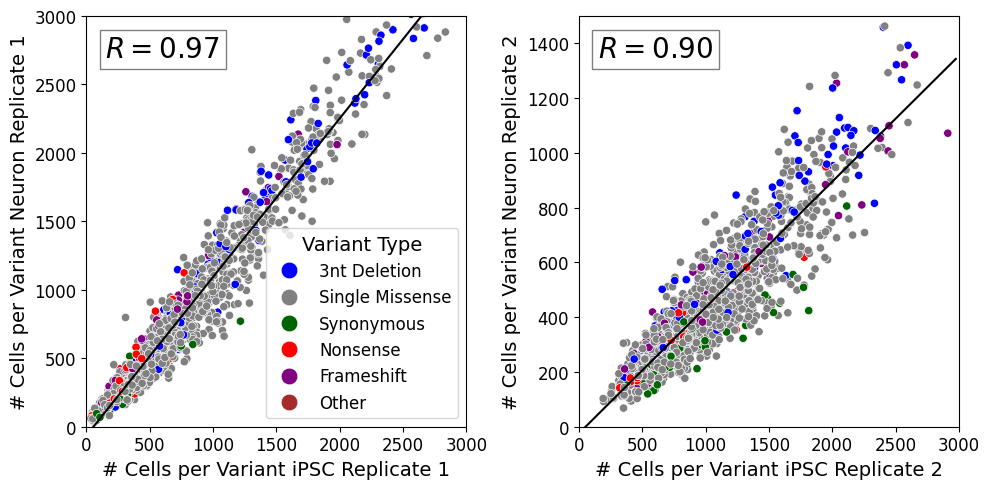

In [21]:
# Plot correlation between NCells for replicates
# Compute correlation plot 
# Compute linear regression parameters

# remove outlier
outlier_val=3000
r1_ncells_iPSC_filt = df_profiles_merged\
    .query('NCells_iPSC_R1 <= @outlier_val & NCells_neuron_R1 <= @outlier_val')\
    ['NCells_iPSC_R1']
r1_ncells_neuron_filt = df_profiles_merged\
    .query('NCells_iPSC_R1 <= @outlier_val & NCells_neuron_R1 <= @outlier_val')\
    ['NCells_neuron_R1']
r2_ncells_iPSC_filt = df_profiles_merged\
    .query('NCells_iPSC_R2 <= @outlier_val & NCells_neuron_R2 <= @outlier_val')\
    ['NCells_iPSC_R2']
r2_ncells_neuron_filt = df_profiles_merged\
    .query('NCells_iPSC_R2 <= @outlier_val & NCells_neuron_R2 <= @outlier_val')\
    ['NCells_neuron_R2']

fig,axs=plt.subplots(figsize=(10,5),ncols=2)

# line for R1
slope, intercept, r_value, p_value, std_err = ss.linregress(r1_ncells_iPSC_filt, r1_ncells_neuron_filt)
r_squared = r_value**2

# Prepare line values for the best-fit line
line_x = np.linspace(r1_ncells_iPSC_filt.min(), r1_ncells_neuron_filt.max(), 100)
line_y = slope * line_x + intercept

# Plot R1
sns.scatterplot(data=df_profiles_merged,
                x='NCells_iPSC_R1', 
                y='NCells_neuron_R1', 
                hue='Variant_Class',
                palette=variant_type_palette,
                ax=axs[0],
                legend=True
               )
axs[0].plot(line_x, line_y, color='black', label='_nolegend_')

# Add labels
axs[0].set_xlabel('# Cells per Variant iPSC Replicate 1', fontsize=14)
axs[0].set_ylabel('# Cells per Variant Neuron Replicate 1', fontsize=14)
axs[0].tick_params(labelsize=12)

# Display R^2 on the plot
axs[0].text(
    0.05, 0.9, 
    f'$R = {r_value:.2f}$', 
    transform=axs[0].transAxes, 
    fontsize=20, 
    bbox=dict(facecolor='white', alpha=0.5)
)

# Show legend and plot
#ax.legend(loc='upper left', bbox_to_anchor=(0.6,0.5))
axs[0].set_xlim(0,outlier_val)
axs[0].set_ylim(0,outlier_val)

# line for R2
slope, intercept, r_value, p_value, std_err = ss.linregress(r2_ncells_iPSC_filt, r2_ncells_neuron_filt)
r_squared = r_value**2

# Prepare line values for the best-fit line
line_x = np.linspace(r1_ncells_iPSC_filt.min(), r1_ncells_neuron_filt.max(), 100)
line_y = slope * line_x + intercept

# Plot R1
sns.scatterplot(data=df_profiles_merged,
                x='NCells_iPSC_R2', 
                y='NCells_neuron_R2', 
                hue='Variant_Class',
                palette=variant_type_palette,
                ax=axs[1],
                legend=False
               )
axs[1].plot(line_x, line_y, color='black', label='_nolegend_')

# Add labels
axs[1].set_xlabel('# Cells per Variant iPSC Replicate 2', fontsize=14)
axs[1].set_ylabel('# Cells per Variant Neuron Replicate 2', fontsize=14)
axs[1].tick_params(labelsize=12)

# Display R^2 on the plot
axs[1].text(
    0.05, 0.9, 
    f'$R = {r_value:.2f}$', 
    transform=axs[1].transAxes, 
    fontsize=20, 
    bbox=dict(facecolor='white', alpha=0.5)
)

# Show legend and plot
axs[1].set_xlim(0,outlier_val)
axs[1].set_ylim(0,1500)
axs[0].legend(loc='lower right', markerscale=2, title='Variant Type', title_fontsize=14, fontsize=12)
fig.tight_layout()

fig.savefig('./consensus_plots/PTENT3.iPSvsneuron.ncellspervariant.correlationbetweencelltypes.011525.pdf', dpi=600)
plt.show()


In [25]:
# import variant medians merged
variant_medians_merged = \
    pd.read_csv('./consensus_features/PTEN.merged.featuremedians.011525.csv')
variant_medians_merged\
    .drop(columns='Unnamed: 0', inplace=True)
variant_medians_merged['Variant_Class'] = \
    pd.Categorical(variant_medians_merged['Variant_Class'], 
                   categories=mutation_types,
                   ordered=True)


In [22]:
# import variant medians EMD
variant_EMD_merged = \
    pd.read_csv('./consensus_features/PTEN.merged.featureEMD.051825.csv')
variant_EMD_merged\
    .drop(columns='Unnamed: 0', inplace=True)
variant_EMD_merged['Variant_Class'] = \
    pd.Categorical(variant_EMD_merged['Variant_Class'], 
                   categories=mutation_types,
                   ordered=True)


In [26]:
# Set umap coords
umap_coords = \
    df_profiles_merged[[
                        'Variant',
                        'UMAP1 iPSC','UMAP2 iPSC',
                        'UMAP1 neuron','UMAP2 neuron'
                      ]]

# Highlight biochemical controls
biochemical_controls = ['C124S','Y138L','G129E']
neuron_localization_controls = ['E157G', 'H123Q']
other_neuron_controls = ['E150G','T167N']
intensity_controls = ['I135R']
total_controls = biochemical_controls + neuron_localization_controls + intensity_controls
umap_coords['Highlight'] = \
    umap_coords['Variant'].map(lambda x: True if x in total_controls else False)
umap_coords['HighlightClass'] = \
    umap_coords['Variant'].map(lambda x: 'Biochemical' if x in biochemical_controls \
                                                else 'Neuron Localization' if x in neuron_localization_controls \
                                                else 'Intensity' if x in intensity_controls \
                                                else np.nan)


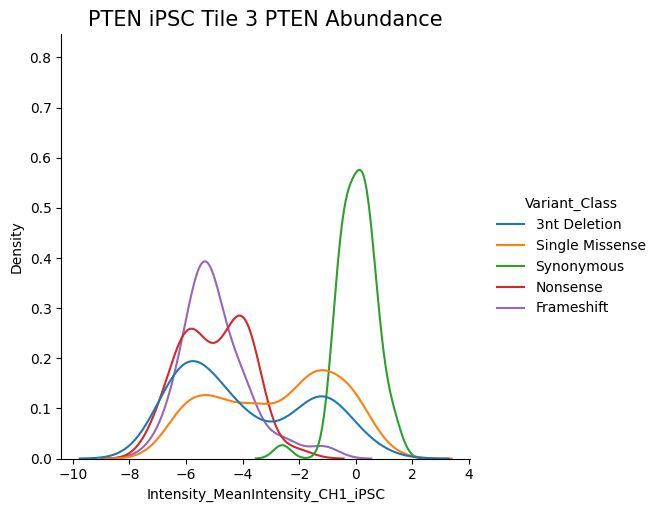

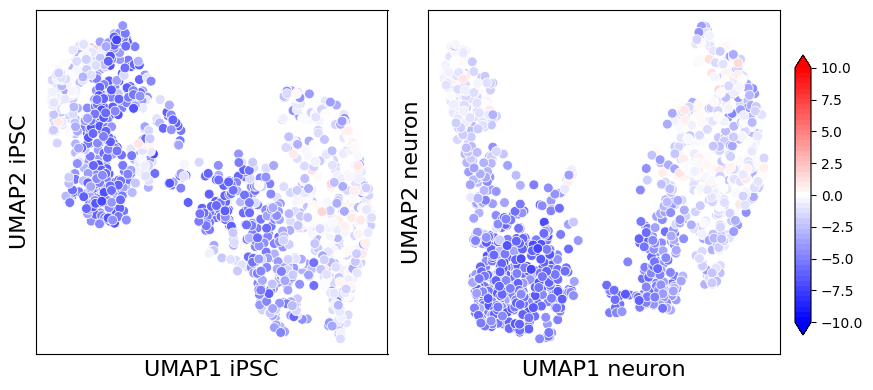

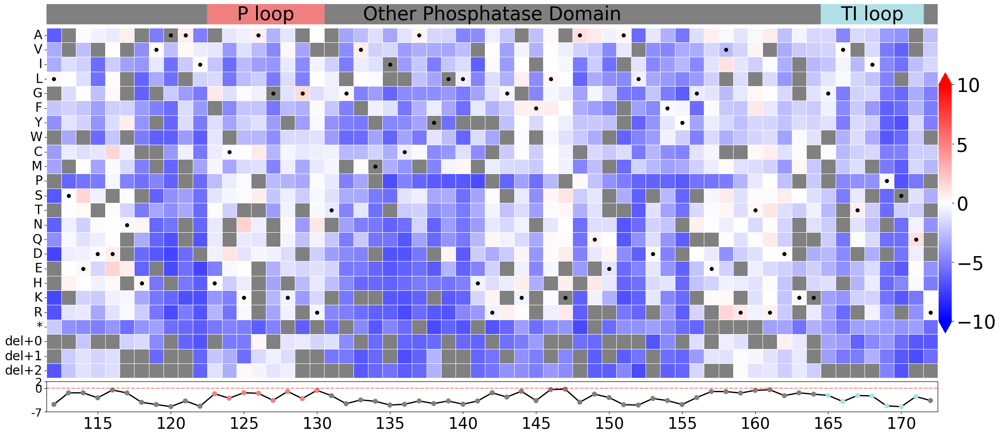

 PyMOL(TM) 3.1.6.1 - Incentive Product
 Copyright (C) Schrodinger, LLC
 
 This Executable Build integrates and extends Open-Source PyMOL.
 Detected 128 CPU cores.  Enabled multithreaded rendering.
 CmdLoad: "" loaded as "1d5r_PTENT3.iPSC.vampseq".
PyMOL>set_view (    -0.839138746,   -0.157006517,   -0.520763457,     0.174852356,    0.828741431,   -0.531615376,     0.515042126,   -0.537154317,   -0.667978406,    -0.000375278,    0.000023644, -226.242431641,   109.331817627,  166.696105957,  124.016159058,    47.521118164,  404.805816650,  -20.000000000 )
 Scene: view updated.
PyMOL>select resi 112-172
 Selector: selection "sele" defined with 476 atoms.
PyMOL>remove solvent
 Remove: eliminated 382 atoms in model "1d5r_PTENT3.iPSC.vampseq".
PyMOL>color grey, not sele
 Executive: Colored 2110 atoms.
PyMOL>spectrum b, blue_white_red, sele, minimum=-10, maximum=10
 Spectrum: range (-10.00000 to 10.00000).
PyMOL>show sticks, sele; show surface, sele; set transparency=0.5; color green, resi 13

In [27]:
# Look at specific features
# VAMPseq 
feature_to_heatmap = 'Intensity_MeanIntensity_CH1_iPSC'
feature_scores,pymol_command = \
    plot_feature(variant_medians_merged,
                 umap_coords,
                 feature_to_heatmap,
                 "PTEN iPSC Tile 3 PTEN Abundance",
                 "PTENT3.iPSC.vampseq",
                 dis_path='./consensus_plots/distributions/',
                 heatmap_path='./consensus_plots/heatmap/',
                 umap_path='./consensus_plots/umap/',
                 pdb_path='./consensus_plots/pdb/',
                 highlight_variants=False,
                 pdb_plot=True,
                 save_plots=True,
                 show_plots=True,
                 threentdels=True,
                 syn_zscore=False,
                 domain_map=PTEN_domain_map,
                 domain_colors=PTEN_domain_coloring,
                 extra_pymol="show sticks, sele; show surface, sele; set transparency=0.5; color green, resi 1352\n",
                 umap1_col=['UMAP1 iPSC','UMAP1 neuron'],
                 umap2_col=['UMAP2 iPSC','UMAP2 neuron'],
                 pymol_view=pymol_ptenview3,
                 image_size=(4000,3000)
                )
!{pymol_command}


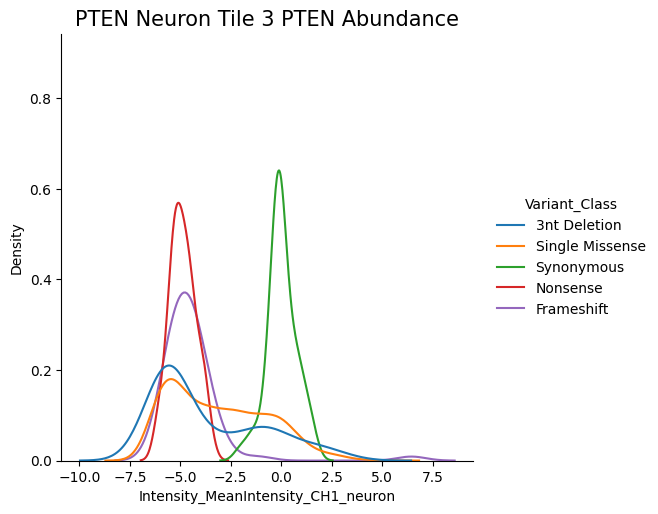

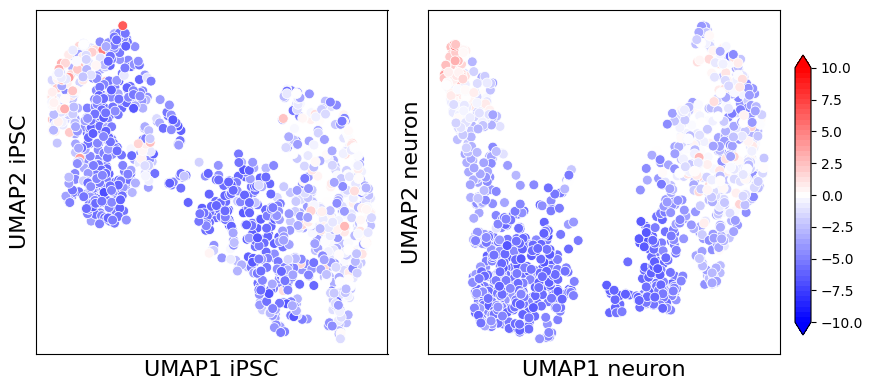

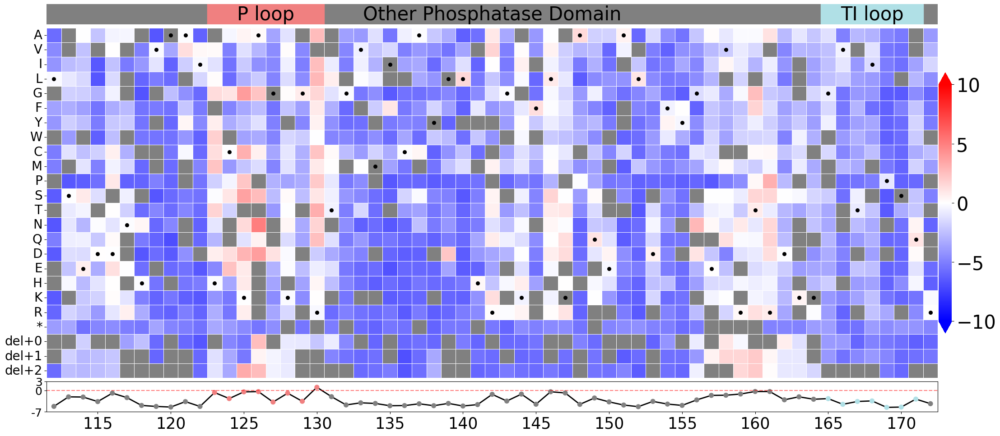

 PyMOL(TM) 3.1.6.1 - Incentive Product
 Copyright (C) Schrodinger, LLC
 
 This Executable Build integrates and extends Open-Source PyMOL.
 Detected 128 CPU cores.  Enabled multithreaded rendering.
 CmdLoad: "" loaded as "1d5r_PTENT3.neuron.vampseq".
PyMOL>set_view (    -0.839138746,   -0.157006517,   -0.520763457,     0.174852356,    0.828741431,   -0.531615376,     0.515042126,   -0.537154317,   -0.667978406,    -0.000375278,    0.000023644, -226.242431641,   109.331817627,  166.696105957,  124.016159058,    47.521118164,  404.805816650,  -20.000000000 )
 Scene: view updated.
PyMOL>select resi 112-172
 Selector: selection "sele" defined with 476 atoms.
PyMOL>remove solvent
 Remove: eliminated 382 atoms in model "1d5r_PTENT3.neuron.vampseq".
PyMOL>color grey, not sele
 Executive: Colored 2110 atoms.
PyMOL>spectrum b, blue_white_red, sele, minimum=-10, maximum=10
 Spectrum: range (-10.00000 to 10.00000).
PyMOL>show sticks, sele; show surface, sele; set transparency=0.5; color green, res

In [28]:
# Look at specific features
# VAMPseq 
feature_to_heatmap = 'Intensity_MeanIntensity_CH1_neuron'
feature_scores,pymol_command = \
    plot_feature(variant_medians_merged,
                 umap_coords,
                 feature_to_heatmap,
                 "PTEN Neuron Tile 3 PTEN Abundance",
                 "PTENT3.neuron.vampseq",
                 dis_path='./consensus_plots/distributions/',
                 heatmap_path='./consensus_plots/heatmap/',
                 umap_path='./consensus_plots/umap/',
                 pdb_path='./consensus_plots/pdb/',
                 highlight_variants=False,
                 pdb_plot=True,
                 save_plots=True,
                 show_plots=True,
                 threentdels=True,
                 syn_zscore=False,
                 domain_map=PTEN_domain_map,
                 domain_colors=PTEN_domain_coloring,
                 extra_pymol="show sticks, sele; show surface, sele; set transparency=0.5; color green, resi 1352\n",
                 umap1_col=['UMAP1 iPSC','UMAP1 neuron'],
                 umap2_col=['UMAP2 iPSC','UMAP2 neuron'],
                 pymol_view=pymol_ptenview3,
                 image_size=(4000,3000)
                )
!{pymol_command}


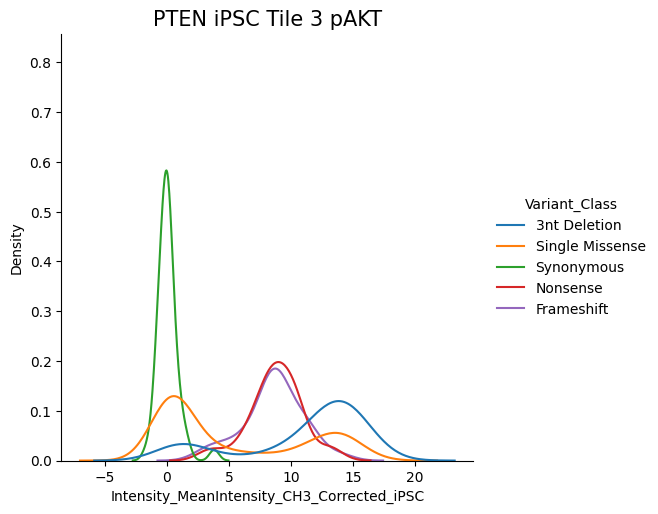

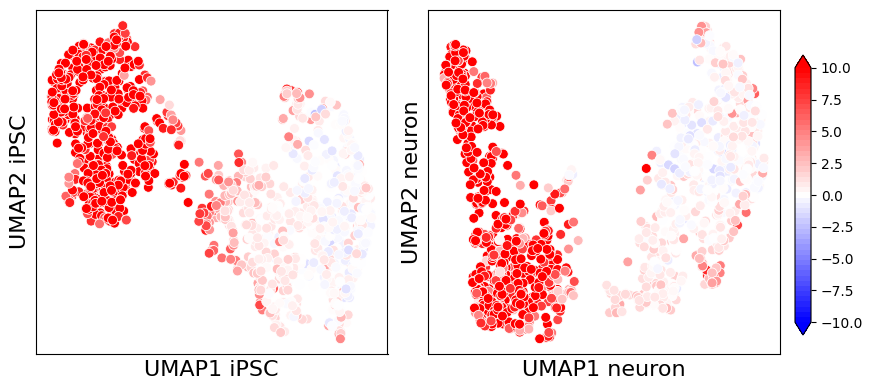

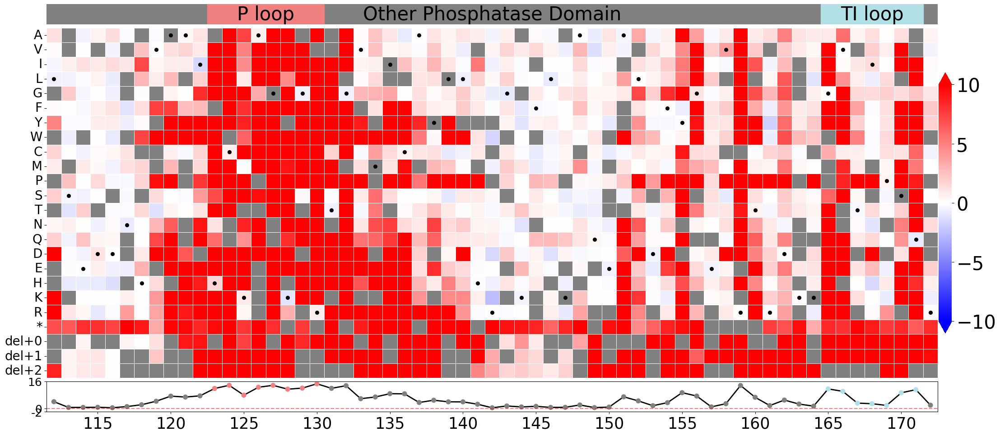

 PyMOL(TM) 3.1.6.1 - Incentive Product
 Copyright (C) Schrodinger, LLC
 
 This Executable Build integrates and extends Open-Source PyMOL.
 Detected 128 CPU cores.  Enabled multithreaded rendering.
 CmdLoad: "" loaded as "1d5r_PTENT3.iPSC.activity".
PyMOL>set_view (    -0.839138746,   -0.157006517,   -0.520763457,     0.174852356,    0.828741431,   -0.531615376,     0.515042126,   -0.537154317,   -0.667978406,    -0.000375278,    0.000023644, -226.242431641,   109.331817627,  166.696105957,  124.016159058,    47.521118164,  404.805816650,  -20.000000000 )
 Scene: view updated.
PyMOL>select resi 112-172
 Selector: selection "sele" defined with 476 atoms.
PyMOL>remove solvent
 Remove: eliminated 382 atoms in model "1d5r_PTENT3.iPSC.activity".
PyMOL>color grey, not sele
 Executive: Colored 2110 atoms.
PyMOL>spectrum b, blue_white_red, sele, minimum=-10, maximum=10
 Spectrum: range (-10.00000 to 10.00000).
PyMOL>show sticks, sele; show surface, sele; set transparency=0.5; color green, resi 

In [29]:
# Look at specific features
# Activity 
feature_to_heatmap = 'Intensity_MeanIntensity_CH3_Corrected_iPSC'
feature_scores,pymol_command = \
    plot_feature(variant_medians_merged,
                 umap_coords,
                 feature_to_heatmap,
                 "PTEN iPSC Tile 3 pAKT",
                 "PTENT3.iPSC.activity",
                 dis_path='./consensus_plots/distributions/',
                 heatmap_path='./consensus_plots/heatmap/',
                 umap_path='./consensus_plots/umap/',
                 pdb_path='./consensus_plots/pdb/',
                 highlight_variants=False,
                 pdb_plot=True,
                 save_plots=True,
                 show_plots=True,
                 threentdels=True,
                 syn_zscore=False,
                 domain_map=PTEN_domain_map,
                 domain_colors=PTEN_domain_coloring,
                 extra_pymol="show sticks, sele; show surface, sele; set transparency=0.5; color green, resi 1352\n",
                 umap1_col=['UMAP1 iPSC','UMAP1 neuron'],
                 umap2_col=['UMAP2 iPSC','UMAP2 neuron'],
                 pymol_view=pymol_ptenview3,
                 image_size=(4000,3000)
                )
!{pymol_command}


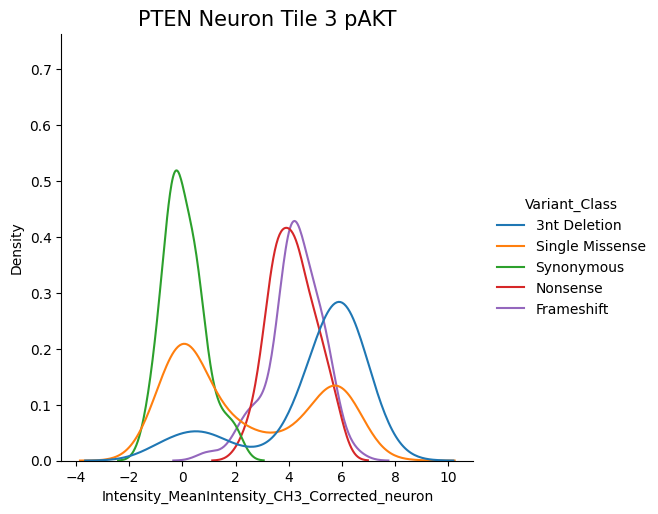

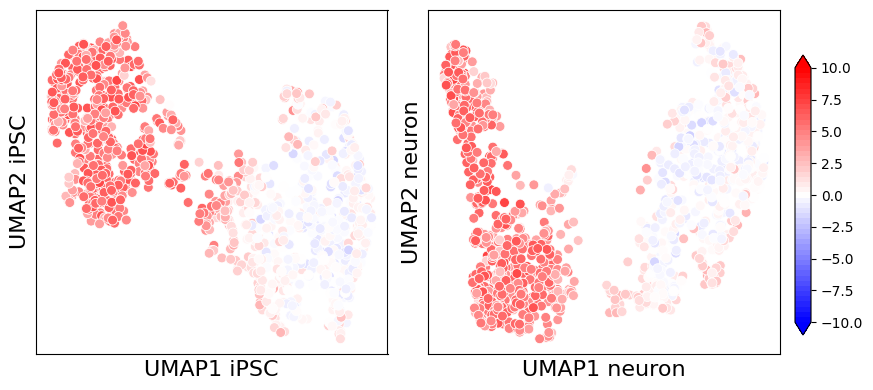

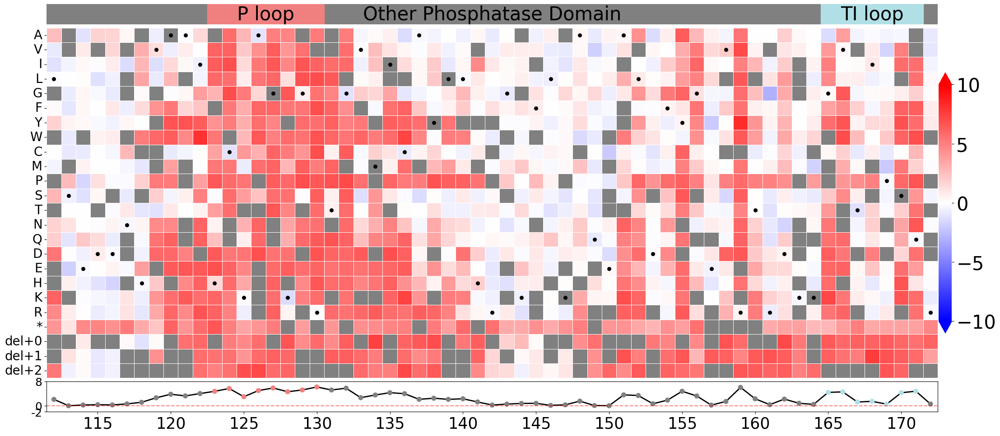

 PyMOL(TM) 3.1.6.1 - Incentive Product
 Copyright (C) Schrodinger, LLC
 
 This Executable Build integrates and extends Open-Source PyMOL.
 Detected 128 CPU cores.  Enabled multithreaded rendering.
 CmdLoad: "" loaded as "1d5r_PTENT3.neuron.activity".
PyMOL>set_view (    -0.839138746,   -0.157006517,   -0.520763457,     0.174852356,    0.828741431,   -0.531615376,     0.515042126,   -0.537154317,   -0.667978406,    -0.000375278,    0.000023644, -226.242431641,   109.331817627,  166.696105957,  124.016159058,    47.521118164,  404.805816650,  -20.000000000 )
 Scene: view updated.
PyMOL>select resi 112-172
 Selector: selection "sele" defined with 476 atoms.
PyMOL>remove solvent
 Remove: eliminated 382 atoms in model "1d5r_PTENT3.neuron.activity".
PyMOL>color grey, not sele
 Executive: Colored 2110 atoms.
PyMOL>spectrum b, blue_white_red, sele, minimum=-10, maximum=10
 Spectrum: range (-10.00000 to 10.00000).
PyMOL>show sticks, sele; show surface, sele; set transparency=0.5; color green, r

In [30]:
# Look at specific features
# Activity 
feature_to_heatmap = 'Intensity_MeanIntensity_CH3_Corrected_neuron'
feature_scores,pymol_command = \
    plot_feature(variant_medians_merged,
                 umap_coords,
                 feature_to_heatmap,
                 "PTEN Neuron Tile 3 pAKT",
                 "PTENT3.neuron.activity",
                 dis_path='./consensus_plots/distributions/',
                 heatmap_path='./consensus_plots/heatmap/',
                 umap_path='./consensus_plots/umap/',
                 pdb_path='./consensus_plots/pdb/',
                 highlight_variants=False,
                 pdb_plot=True,
                 save_plots=True,
                 show_plots=True,
                 threentdels=True,
                 syn_zscore=False,
                 domain_map=PTEN_domain_map,
                 domain_colors=PTEN_domain_coloring,
                 extra_pymol="show sticks, sele; show surface, sele; set transparency=0.5; color green, resi 1352\n",
                 umap1_col=['UMAP1 iPSC','UMAP1 neuron'],
                 umap2_col=['UMAP2 iPSC','UMAP2 neuron'],
                 pymol_view=pymol_ptenview3,
                 image_size=(4000,3000)
                )
!{pymol_command}


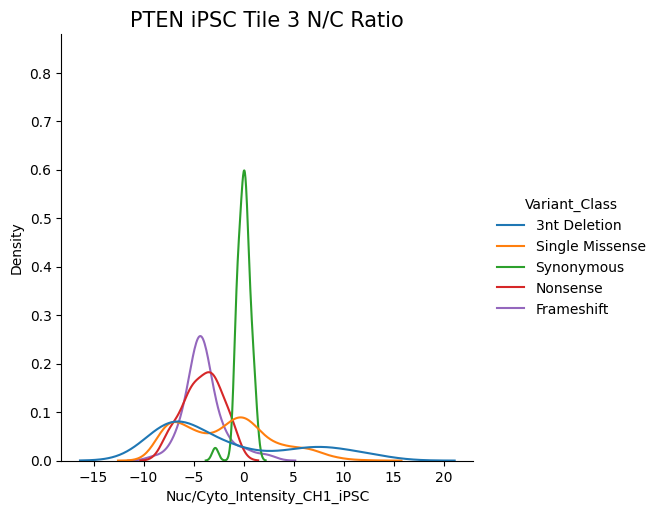

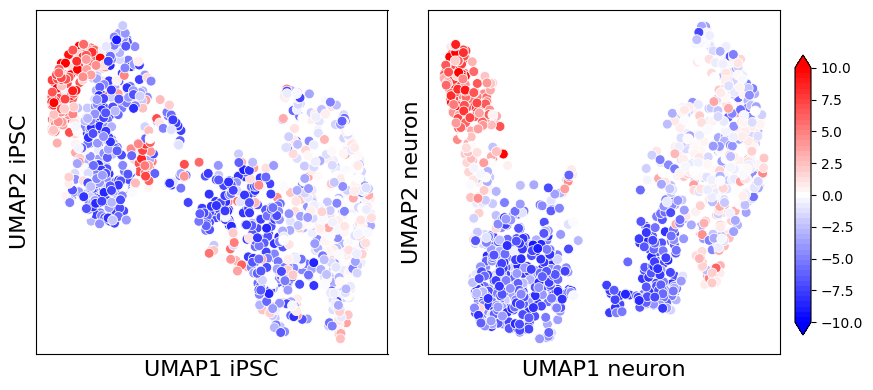

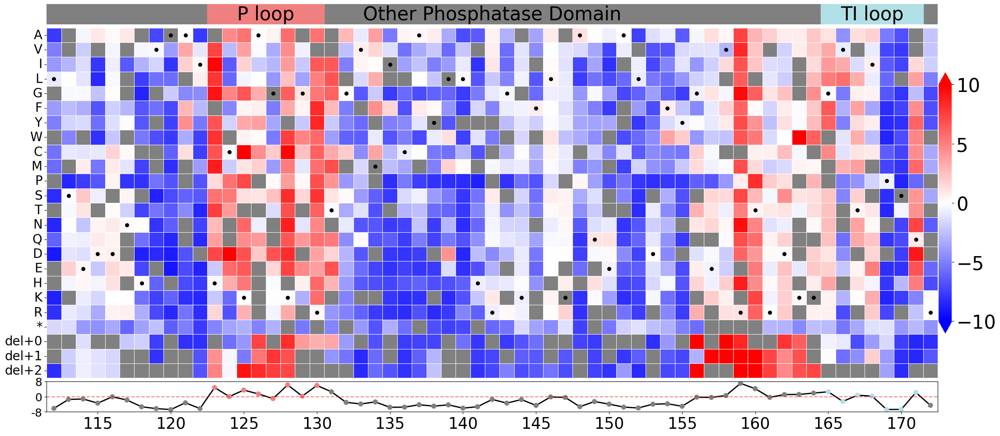

 PyMOL(TM) 3.1.6.1 - Incentive Product
 Copyright (C) Schrodinger, LLC
 
 This Executable Build integrates and extends Open-Source PyMOL.
 Detected 128 CPU cores.  Enabled multithreaded rendering.
 CmdLoad: "" loaded as "1d5r_PTENT3.iPSC.PTENnuctocyto".
PyMOL>set_view (    -0.839138746,   -0.157006517,   -0.520763457,     0.174852356,    0.828741431,   -0.531615376,     0.515042126,   -0.537154317,   -0.667978406,    -0.000375278,    0.000023644, -226.242431641,   109.331817627,  166.696105957,  124.016159058,    47.521118164,  404.805816650,  -20.000000000 )
 Scene: view updated.
PyMOL>select resi 112-172
 Selector: selection "sele" defined with 476 atoms.
PyMOL>remove solvent
 Remove: eliminated 382 atoms in model "1d5r_PTENT3.iPSC.PTENnuctocyto".
PyMOL>color grey, not sele
 Executive: Colored 2110 atoms.
PyMOL>spectrum b, blue_white_red, sele, minimum=-10, maximum=10
 Spectrum: range (-10.00000 to 10.00000).
PyMOL>show sticks, sele; show surface, sele; set transparency=0.5; color gr

In [31]:
# Look at specific features
# N/C Ratio 
feature_to_heatmap = 'Nuc/Cyto_Intensity_CH1_iPSC'
feature_scores,pymol_command = \
    plot_feature(variant_medians_merged,
                 umap_coords,
                 feature_to_heatmap,
                 "PTEN iPSC Tile 3 N/C Ratio",
                 "PTENT3.iPSC.PTENnuctocyto",
                 dis_path='./consensus_plots/distributions/',
                 heatmap_path='./consensus_plots/heatmap/',
                 umap_path='./consensus_plots/umap/',
                 pdb_path='./consensus_plots/pdb/',
                 highlight_variants=False,
                 pdb_plot=True,
                 save_plots=True,
                 show_plots=True,
                 threentdels=True,
                 syn_zscore=False,
                 domain_map=PTEN_domain_map,
                 domain_colors=PTEN_domain_coloring,
                 extra_pymol="show sticks, sele; show surface, sele; set transparency=0.5; color green, resi 1352\n",
                 umap1_col=['UMAP1 iPSC','UMAP1 neuron'],
                 umap2_col=['UMAP2 iPSC','UMAP2 neuron'],
                 vmin=-10,
                 vmax=10,
                 pymol_view=pymol_ptenview3,
                 image_size=(4000,3000)
                )
!{pymol_command}


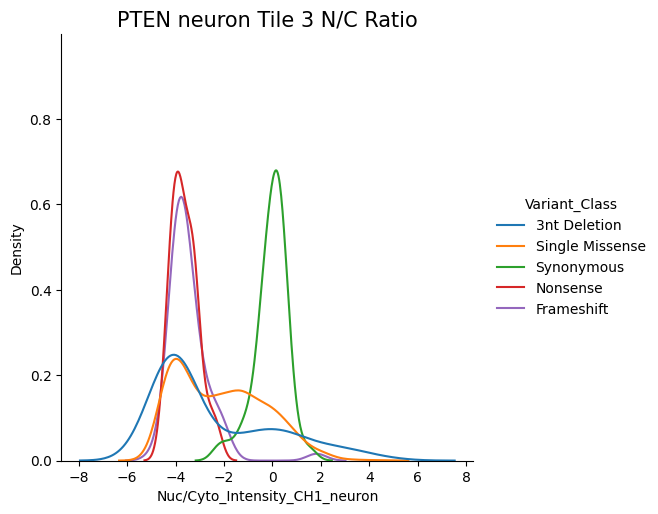

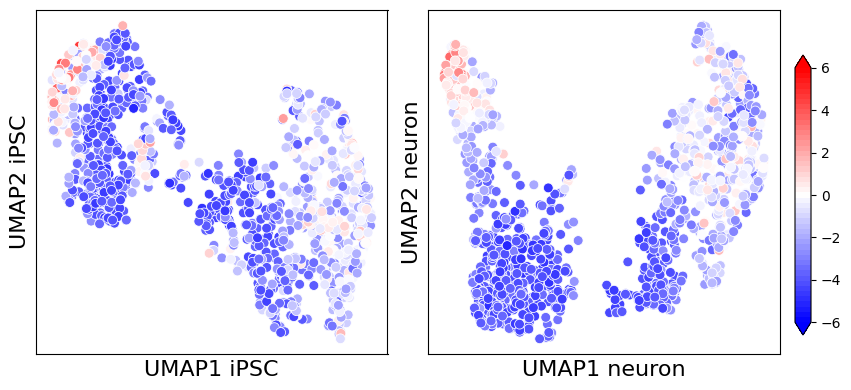

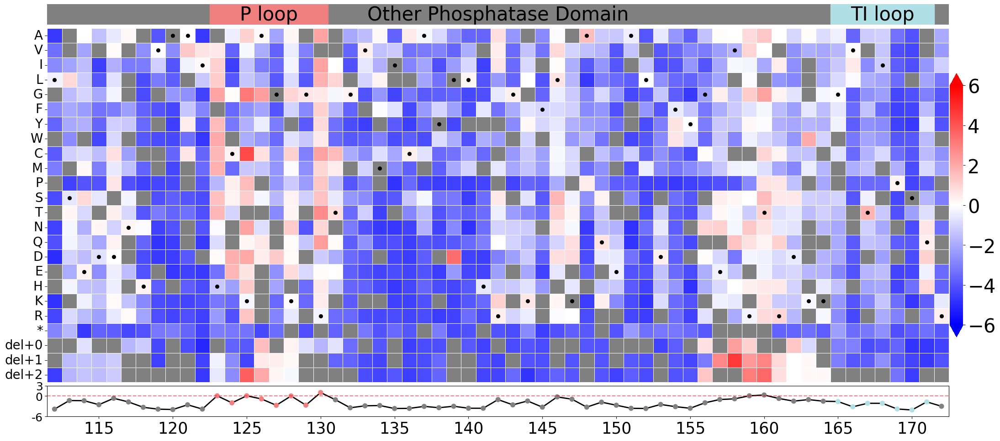

 PyMOL(TM) 3.1.6.1 - Incentive Product
 Copyright (C) Schrodinger, LLC
 
 This Executable Build integrates and extends Open-Source PyMOL.
 Detected 128 CPU cores.  Enabled multithreaded rendering.
 CmdLoad: "" loaded as "1d5r_PTENT3.neuron.PTENnuctocyto".
PyMOL>set_view (    -0.839138746,   -0.157006517,   -0.520763457,     0.174852356,    0.828741431,   -0.531615376,     0.515042126,   -0.537154317,   -0.667978406,    -0.000375278,    0.000023644, -226.242431641,   109.331817627,  166.696105957,  124.016159058,    47.521118164,  404.805816650,  -20.000000000 )
 Scene: view updated.
PyMOL>select resi 112-172
 Selector: selection "sele" defined with 476 atoms.
PyMOL>remove solvent
 Remove: eliminated 382 atoms in model "1d5r_PTENT3.neuron.PTENnuctocyto".
PyMOL>color grey, not sele
 Executive: Colored 2110 atoms.
PyMOL>spectrum b, blue_white_red, sele, minimum=-6, maximum=6
 Spectrum: range (-6.00000 to  6.00000).
PyMOL>show sticks, sele; show surface, sele; set transparency=0.5; color g

In [32]:
# Look at specific features
# N/C Ratio 
feature_to_heatmap = 'Nuc/Cyto_Intensity_CH1_neuron'
feature_scores,pymol_command = \
    plot_feature(variant_medians_merged,
                 umap_coords,
                 feature_to_heatmap,
                 "PTEN neuron Tile 3 N/C Ratio",
                 "PTENT3.neuron.PTENnuctocyto",
                 dis_path='./consensus_plots/distributions/',
                 heatmap_path='./consensus_plots/heatmap/',
                 umap_path='./consensus_plots/umap/',
                 pdb_path='./consensus_plots/pdb/',
                 highlight_variants=False,
                 pdb_plot=True,
                 save_plots=True,
                 show_plots=True,
                 threentdels=True,
                 syn_zscore=False,
                 domain_map=PTEN_domain_map,
                 domain_colors=PTEN_domain_coloring,
                 extra_pymol="show sticks, sele; show surface, sele; set transparency=0.5; color green, resi 1352\n",
                 umap1_col=['UMAP1 iPSC','UMAP1 neuron'],
                 umap2_col=['UMAP2 iPSC','UMAP2 neuron'],
                 vmin=-6,
                 vmax=6,
                 pymol_view=pymol_ptenview3,
                 image_size=(4000,3000)
                )
!{pymol_command}


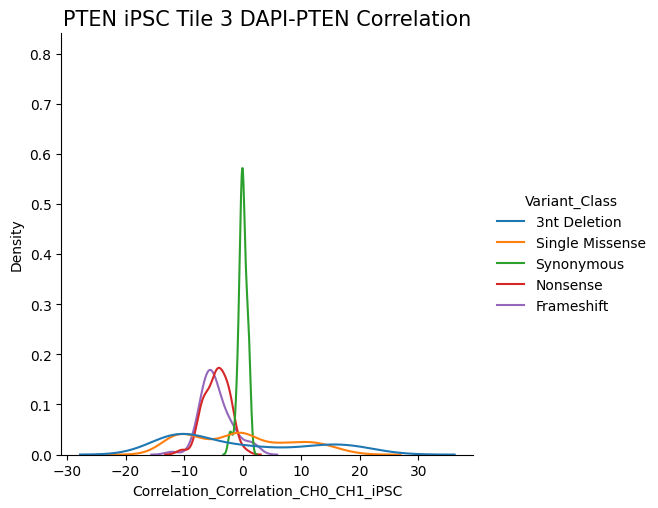

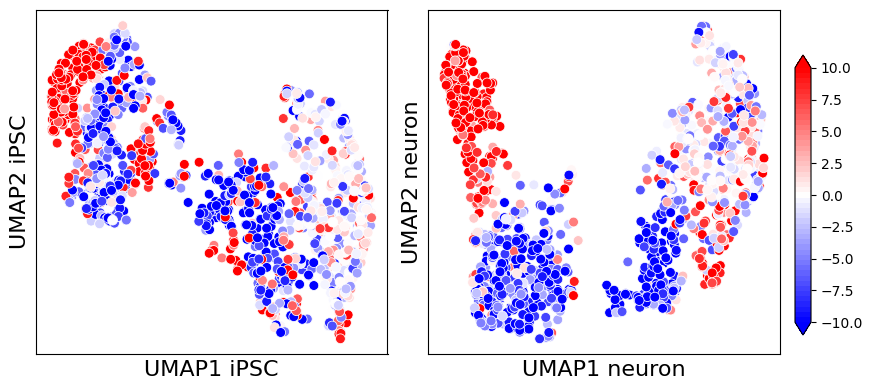

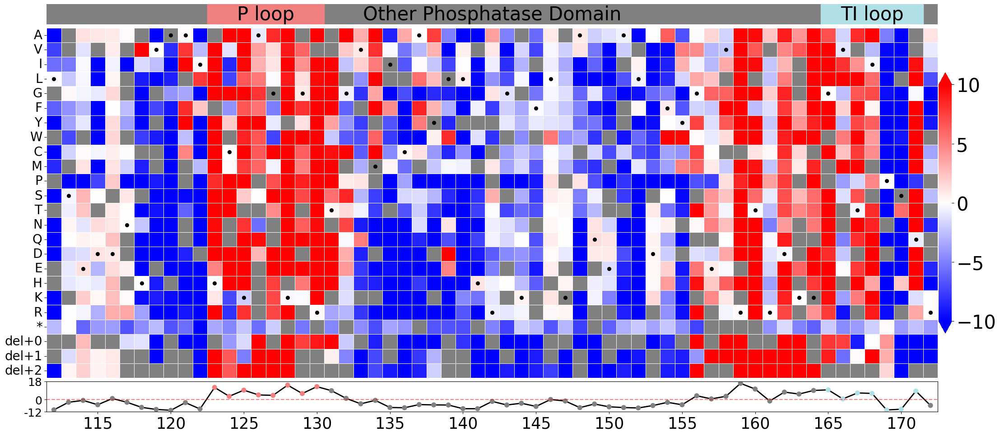

 PyMOL(TM) 3.1.6.1 - Incentive Product
 Copyright (C) Schrodinger, LLC
 
 This Executable Build integrates and extends Open-Source PyMOL.
 Detected 128 CPU cores.  Enabled multithreaded rendering.
 CmdLoad: "" loaded as "1d5r_PTENT3.iPSC.DAPIPTENcorrelation".
PyMOL>set_view (    -0.839138746,   -0.157006517,   -0.520763457,     0.174852356,    0.828741431,   -0.531615376,     0.515042126,   -0.537154317,   -0.667978406,    -0.000375278,    0.000023644, -226.242431641,   109.331817627,  166.696105957,  124.016159058,    47.521118164,  404.805816650,  -20.000000000 )
 Scene: view updated.
PyMOL>select resi 112-172
 Selector: selection "sele" defined with 476 atoms.
PyMOL>remove solvent
 Remove: eliminated 382 atoms in model "1d5r_PTENT3.iPSC.DAPIPTENcorrelation".
PyMOL>color grey, not sele
 Executive: Colored 2110 atoms.
PyMOL>spectrum b, blue_white_red, sele, minimum=-10, maximum=10
 Spectrum: range (-10.00000 to 10.00000).
PyMOL>show sticks, sele; show surface, sele; set transparency=0

In [33]:
# Look at specific features
# DAPI-PTEN
feature_to_heatmap = 'Correlation_Correlation_CH0_CH1_iPSC'
feature_scores,pymol_command = \
    plot_feature(variant_medians_merged,
                 umap_coords,
                 feature_to_heatmap,
                 "PTEN iPSC Tile 3 DAPI-PTEN Correlation",
                 "PTENT3.iPSC.DAPIPTENcorrelation",
                 dis_path='./consensus_plots/distributions/',
                 heatmap_path='./consensus_plots/heatmap/',
                 umap_path='./consensus_plots/umap/',
                 pdb_path='./consensus_plots/pdb/',
                 highlight_variants=False,
                 pdb_plot=True,
                 save_plots=True,
                 show_plots=True,
                 threentdels=True,
                 syn_zscore=False,
                 domain_map=PTEN_domain_map,
                 domain_colors=PTEN_domain_coloring,
                 extra_pymol="show sticks, sele; show surface, sele; set transparency=0.5; color green, resi 1352\n",
                 umap1_col=['UMAP1 iPSC','UMAP1 neuron'],
                 umap2_col=['UMAP2 iPSC','UMAP2 neuron'],
                 vmin=-10,
                 vmax=10,
                 pymol_view=pymol_ptenview3,
                 image_size=(4000,3000)
                )
!{pymol_command}


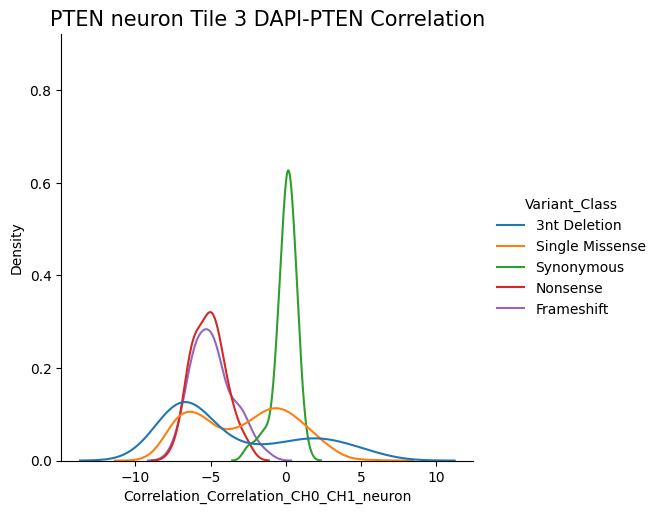

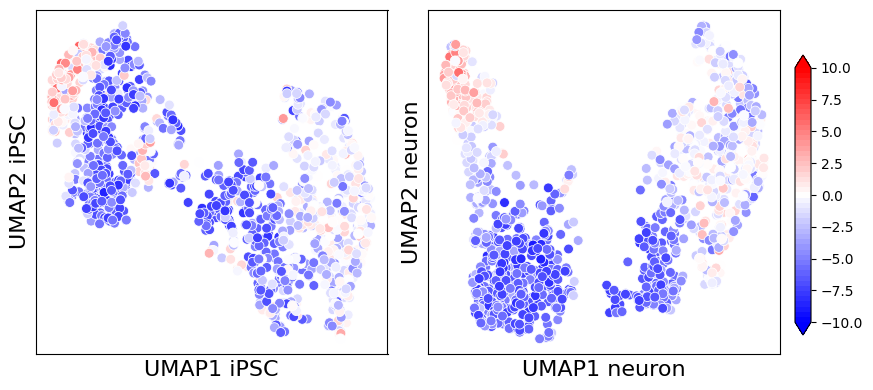

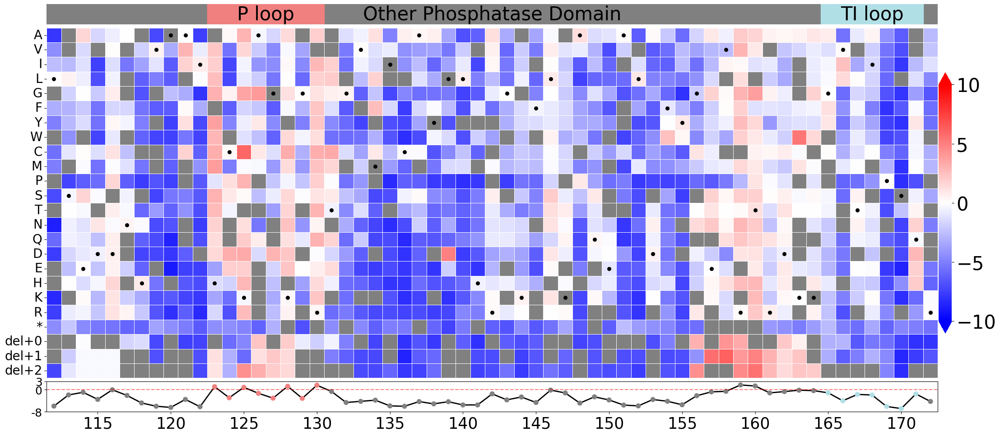

 PyMOL(TM) 3.1.6.1 - Incentive Product
 Copyright (C) Schrodinger, LLC
 
 This Executable Build integrates and extends Open-Source PyMOL.
 Detected 128 CPU cores.  Enabled multithreaded rendering.
 CmdLoad: "" loaded as "1d5r_PTENT3.neuron.DAPIPTENcorrelation".
PyMOL>set_view (    -0.839138746,   -0.157006517,   -0.520763457,     0.174852356,    0.828741431,   -0.531615376,     0.515042126,   -0.537154317,   -0.667978406,    -0.000375278,    0.000023644, -226.242431641,   109.331817627,  166.696105957,  124.016159058,    47.521118164,  404.805816650,  -20.000000000 )
 Scene: view updated.
PyMOL>select resi 112-172
 Selector: selection "sele" defined with 476 atoms.
PyMOL>remove solvent
 Remove: eliminated 382 atoms in model "1d5r_PTENT3.neuron.DAPIPTENcorrelation".
PyMOL>color grey, not sele
 Executive: Colored 2110 atoms.
PyMOL>spectrum b, blue_white_red, sele, minimum=-10, maximum=10
 Spectrum: range (-10.00000 to 10.00000).
PyMOL>show sticks, sele; show surface, sele; set transparen

In [34]:
# Look at specific features
# DAPI-PTEN
feature_to_heatmap = 'Correlation_Correlation_CH0_CH1_neuron'
feature_scores,pymol_command = \
    plot_feature(variant_medians_merged,
                 umap_coords,
                 feature_to_heatmap,
                 "PTEN neuron Tile 3 DAPI-PTEN Correlation",
                 "PTENT3.neuron.DAPIPTENcorrelation",
                 dis_path='./consensus_plots/distributions/',
                 heatmap_path='./consensus_plots/heatmap/',
                 umap_path='./consensus_plots/umap/',
                 pdb_path='./consensus_plots/pdb/',
                 highlight_variants=False,
                 pdb_plot=True,
                 save_plots=True,
                 show_plots=True,
                 threentdels=True,
                 syn_zscore=False,
                 domain_map=PTEN_domain_map,
                 domain_colors=PTEN_domain_coloring,
                 extra_pymol="show sticks, sele; show surface, sele; set transparency=0.5; color green, resi 1352\n",
                 umap1_col=['UMAP1 iPSC','UMAP1 neuron'],
                 umap2_col=['UMAP2 iPSC','UMAP2 neuron'],
                 vmin=-10,
                 vmax=10,
                 pymol_view=pymol_ptenview3,
                 image_size=(4000,3000)
                )
!{pymol_command}


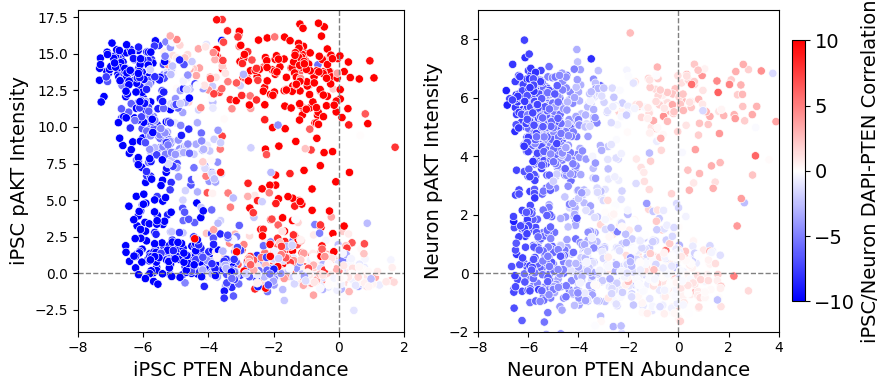

In [36]:
# Plot iPSC and Neuron Act vs Abu colored by Correlation
fig,axs = plt.subplots(figsize=(9,4), ncols=2)
norm = mcolors.Normalize(vmin=-10, vmax=10)
sm = plt.cm.ScalarMappable(norm=norm, cmap="bwr")
sm.set_array([])

# iPSC
sns.scatterplot(
    data=variant_medians_merged,
    x="Intensity_MeanIntensity_CH1_iPSC",
    y="Intensity_MeanIntensity_CH3_Corrected_iPSC",
    hue="Correlation_Correlation_CH0_CH1_iPSC",
    palette='bwr',
    hue_norm=norm,
    ax=axs[0],
    legend=False
)
# Add dashed lines at x=0 and y=0
axs[0].axhline(y=0, color='grey', linestyle='--', linewidth=1)
axs[0].axvline(x=0, color='grey', linestyle='--', linewidth=1)
axs[0].tick_params(axis='both',labelsize=10)
axs[0].set_xlabel("iPSC PTEN Abundance", fontsize=14)
axs[0].set_ylabel("iPSC pAKT Intensity", fontsize=14)
axs[0].set_xlim(-8,2)
axs[0].set_ylim(-4,18)

# neuron
sns.scatterplot(
    data=variant_medians_merged,
    x="Intensity_MeanIntensity_CH1_neuron",
    y="Intensity_MeanIntensity_CH3_Corrected_neuron",
    hue="Correlation_Correlation_CH0_CH1_neuron",
    palette='bwr',
    hue_norm=norm,
    ax=axs[1],
    legend=False
)
# Add dashed lines at x=0 and y=0
axs[1].axhline(y=0, color='grey', linestyle='--', linewidth=1)
axs[1].axvline(x=0, color='grey', linestyle='--', linewidth=1)
axs[1].tick_params(axis='both',labelsize=10)
axs[1].set_xlabel("Neuron PTEN Abundance", fontsize=14)
axs[1].set_ylabel("Neuron pAKT Intensity", fontsize=14)
axs[1].set_xlim(-8,4)
axs[1].set_ylim(-2,9)


# Set colorbar
cbar = plt.colorbar(sm, 
                    ax=axs[-1], 
                    fraction=0.04, 
                    pad=0.04, 
                    orientation='vertical'
                   )
cbar.ax.tick_params(labelsize=14)
cbar.set_label("iPSC/Neuron DAPI-PTEN Correlation", fontsize=14)
plt.tight_layout()
plt.savefig('consensus_plots/abundancevsactivity.coloredbycorrelation.iPSCneuron.061025.pdf')
plt.show()


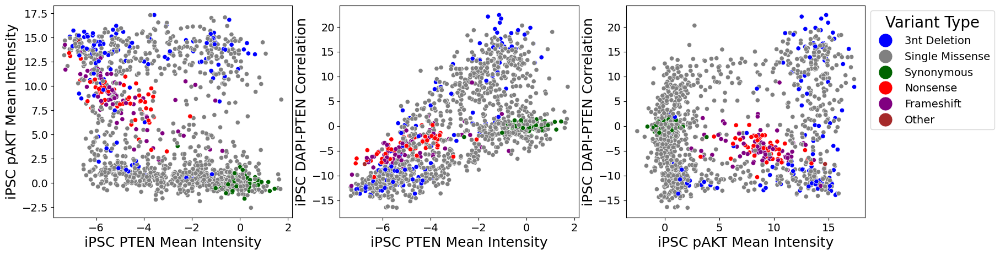

In [37]:
# Plot the three major features against each other for iPS and neurons
feature_list_toplot = \
    ['Intensity_MeanIntensity_CH1_iPSC', 
     'Intensity_MeanIntensity_CH3_Corrected_iPSC',
     'Correlation_Correlation_CH0_CH1_iPSC']

axis_lims_features = \
    {
        'Intensity_MeanIntensity_CH1_iPSC':(-8,2),
        'Intensity_MeanIntensity_CH3_Corrected_iPSC':(-2,17),
        'Correlation_Correlation_CH0_CH1_iPSC':(-16,22)
    }

feature_rename = \
    {
        'Intensity_MeanIntensity_CH1_iPSC':'iPSC PTEN Mean Intensity',
        'Intensity_MeanIntensity_CH3_Corrected_iPSC':'iPSC pAKT Mean Intensity',
        'Correlation_Correlation_CH0_CH1_iPSC':'iPSC DAPI-PTEN Correlation'
    }

feature_pairs_toplot = list(itertools.combinations(feature_list_toplot, 2))
fig,axs = plt.subplots(figsize=(5*len(feature_pairs_toplot)+4,5),ncols=len(feature_pairs_toplot))
for i,pair in enumerate(feature_pairs_toplot):
    sns.scatterplot(
        data=variant_medians_merged,
        x=pair[0],
        y=pair[1],
        hue='Variant_Class',
        palette=variant_type_palette,
        ax=axs[i],
        legend=(i==(len(feature_pairs_toplot)-1))
    )
    axs[i].set_xlabel(feature_rename[pair[0]], fontsize=18)
    axs[i].set_ylabel(feature_rename[pair[1]], fontsize=18)
    axs[i].tick_params(axis='both',labelsize=14)
plt.legend(loc='upper left',
           title='Variant Type',
           markerscale=3,
           bbox_to_anchor=(1,1),
           fontsize=14,
           title_fontsize=20)
plt.show()
fig.savefig('./consensus_plots/PTENT3.iPSC.abundanceVSactivityVSDAPIPTENcorrelation.011725.pdf',
            bbox_inches='tight')


In [38]:
# What are these _mislocalization-only_ positions? Plot on the structure
# Get counts of variants
z_thresh = 2.5
nuclearmislocalizedonly_variants = \
    variant_medians_merged[variant_medians_merged['Intensity_MeanIntensity_CH3_Corrected_iPSC'] <= 2.5]
nuclearmislocalizedonly_variants = \
    nuclearmislocalizedonly_variants[nuclearmislocalizedonly_variants['Correlation_Correlation_CH0_CH1_iPSC'] >= 2.5]
nuclearmislocalizedonly_variants['position'] = \
    nuclearmislocalizedonly_variants['Variant'].map(lambda x: int(x[1:-1]))
nuclearmislocalizedonly_counts = nuclearmislocalizedonly_variants['position'].value_counts().reset_index()
nuclearmislocalizedonly_counts.columns = ['position','count']

# Run pymol command
pymol_cmd = plot_structure_spheres(
    counts_df     = nuclearmislocalizedonly_counts,
    output_suffix = 'misloc_counts',
    start_pos     = pten_start_pos,
    end_pos       = pten_end_pos,
    pymol_exec    = "$HOME/pymol/pymol -c",
    dpi           = 1000,
    base_radius   = 0.3,
    scale_factor  = 0.1,
    pymol_view=pymol_ptenview3,
    image_size=(4000,3000)
)

!{pymol_cmd}


1d5r
 PyMOL(TM) 3.1.6.1 - Incentive Product
 Copyright (C) Schrodinger, LLC
 
 This Executable Build integrates and extends Open-Source PyMOL.
 Detected 128 CPU cores.  Enabled multithreaded rendering.
HEADER    HYDROLASE                               11-OCT-99   1D5R
TITLE     CRYSTAL STRUCTURE OF THE PTEN TUMOR SUPPRESSOR
COMPND    MOL_ID: 1;
COMPND   2 MOLECULE: PHOSPHOINOSITIDE PHOSPHATASE PTEN;
COMPND   3 CHAIN: A;
COMPND   4 FRAGMENT: RESIDUES 7-353;
COMPND   5 EC: 3.1.3.48;
COMPND   6 ENGINEERED: YES;
COMPND   7 MUTATION: YES
 ObjectMolecule: Read secondary structure assignments.
 ObjectMolecule: Read crystal symmetry information.
 CmdLoad: "" loaded as "1d5r".
PyMOL>load /net/fowler/vol1/home/pendyala/FISSEQ/PTEN_iPSC_T3_pycytominer_120524/1d5r.pdb, 1d5r
HEADER    HYDROLASE                               11-OCT-99   1D5R
TITLE     CRYSTAL STRUCTURE OF THE PTEN TUMOR SUPPRESSOR
COMPND    MOL_ID: 1;
COMPND   2 MOLECULE: PHOSPHOINOSITIDE PHOSPHATASE PTEN;
COMPND   3 CHAIN: A;
COMPN

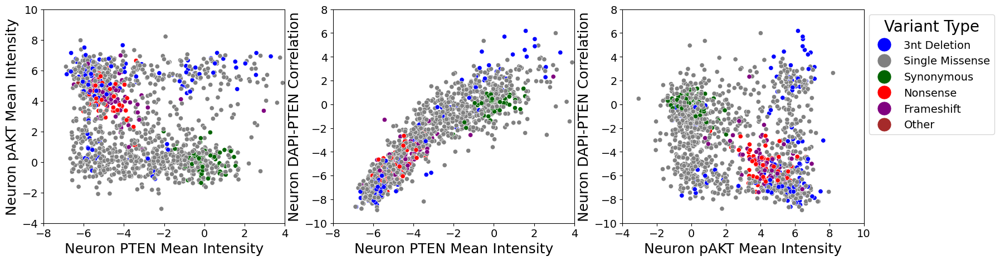

In [39]:
# Plot the three major features against each other for iPS and neurons
feature_list_toplot = \
    [
        'Intensity_MeanIntensity_CH1_neuron', 
        'Intensity_MeanIntensity_CH3_Corrected_neuron',
        'Correlation_Correlation_CH0_CH1_neuron'
    ]

axis_lims_features = \
    {
        'Intensity_MeanIntensity_CH1_neuron':(-8,4),
        'Intensity_MeanIntensity_CH3_Corrected_neuron':(-4,10),
        'Correlation_Correlation_CH0_CH1_neuron':(-10,8)
    }
feature_rename = \
    {
        'Intensity_MeanIntensity_CH1_neuron':'Neuron PTEN Mean Intensity',
        'Intensity_MeanIntensity_CH3_Corrected_neuron':'Neuron pAKT Mean Intensity',
        'Correlation_Correlation_CH0_CH1_neuron':'Neuron DAPI-PTEN Correlation'
    }

feature_pairs_toplot = list(itertools.combinations(feature_list_toplot, 2))
fig,axs = plt.subplots(figsize=(5*len(feature_pairs_toplot)+4,5),ncols=len(feature_pairs_toplot))
for i,pair in enumerate(feature_pairs_toplot):
    sns.scatterplot(
        data=variant_medians_merged,
        x=pair[0],
        y=pair[1],
        hue='Variant_Class',
        palette=variant_type_palette,
        ax=axs[i],
        legend=(i==(len(feature_pairs_toplot)-1))
    )
    axs[i].set_xlabel(feature_rename[pair[0]], fontsize=18)
    axs[i].set_ylabel(feature_rename[pair[1]], fontsize=18)
    axs[i].set_xlim(axis_lims_features[pair[0]])
    axs[i].set_ylim(axis_lims_features[pair[1]])
    axs[i].tick_params(axis='both',labelsize=14)
plt.legend(loc='upper left',
           title='Variant Type',
           markerscale=3,
           bbox_to_anchor=(1,1),
           fontsize=14,
           title_fontsize=20)
plt.show()
fig.savefig('./consensus_plots/PTENT3.neuron.abundanceVSactivityVSDAPIPTENcorrelation.011725.pdf',
            bbox_inches='tight')


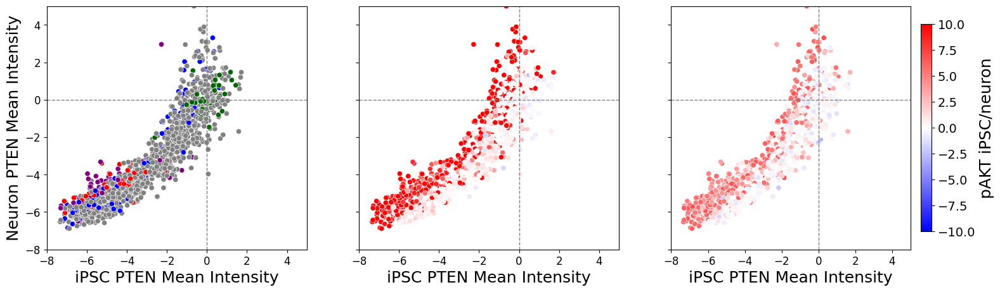

In [40]:
# Look at specific feature scatterplots against abundance and activity
abundance_iPSvsneuron = \
    plot_two_features_coloredbyactivityabundance(
        variant_medians_merged,
        "Intensity_MeanIntensity_CH1_iPSC",
        "Intensity_MeanIntensity_CH1_neuron",
        color1='Intensity_MeanIntensity_CH3_Corrected_iPSC',
        color2='Intensity_MeanIntensity_CH3_Corrected_neuron',
        cbar_label="pAKT iPSC/neuron",
        legend_display='upper left',
        label1='iPSC PTEN Mean Intensity',
        label2='Neuron PTEN Mean Intensity',
        xlim=(-8,5),
        ylim=(-8,5),
    )
abundance_iPSvsneuron.savefig('./consensus_plots/PTENT3.iPSvsneuron.abundance.011725.pdf', bbox_inches='tight')


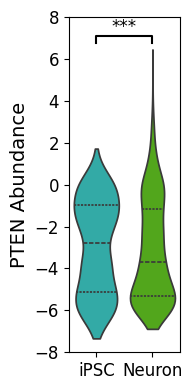

In [43]:
# 1a) Extract just the two columns of interest
cols = ["Intensity_MeanIntensity_CH1_iPSC",
        "Intensity_MeanIntensity_CH1_neuron"]
df_violin = variant_medians_merged[cols].dropna()  # drop rows with any NaNs

# 1b) Melt to “long” form so seaborn can split by cell type
df_long = df_violin.melt(var_name="CellType", value_name="Intensity")
df_long["CellType"] = df_long["CellType"].map({
    "Intensity_MeanIntensity_CH1_iPSC": "iPSC",
    "Intensity_MeanIntensity_CH1_neuron": "Neuron"
})

# 2) Run the two‐sample KS test
iPSC_vals   = df_violin["Intensity_MeanIntensity_CH1_iPSC"]
neuron_vals = df_violin["Intensity_MeanIntensity_CH1_neuron"]
ks_stat, p_val = ks_2samp(iPSC_vals, neuron_vals)

# 3) Plot violins
plt.figure(figsize=(2,4))
ax = sns.violinplot(x="CellType",
                    y="Intensity",
                    data=df_long,
                    inner="quartile",
                    scale="width",
                    palette={'iPSC': '#1fbeb8', 'Neuron': '#4dbd05'},
                    cut=0)
ax.set_xlabel("")
ax.tick_params(labelsize=12)
ax.set_ylim(-8,8)
ax.set_ylabel("PTEN Abundance", fontsize=14)

# 4) Draw bracket
# positions of the categories on the x‐axis
x1, x2 = 0, 1  
# top of the violins
y_max = df_long["Intensity"].max()
# how high above the data to draw the bracket
h = 0.05 * y_max   
# vertical position of the bracket
y = y_max + h

# the “┌───┐” shape
ax.plot([x1, x1, x2, x2],
        [y, y+h, y+h, y],
        lw=1.5, c='k')

# 5) Annotate p‐value centered above bracket
ax.text((x1 + x2) / 2, 
        y + h * 1, 
        f"***" if p_val<0.001 else "",
        ha='center', 
        va='bottom',
        fontsize=12)

plt.tight_layout()
plt.savefig('consensus_plots/PTENT3.iPSvsneuron.PTENabundance.violin.061025.pdf')
plt.show()

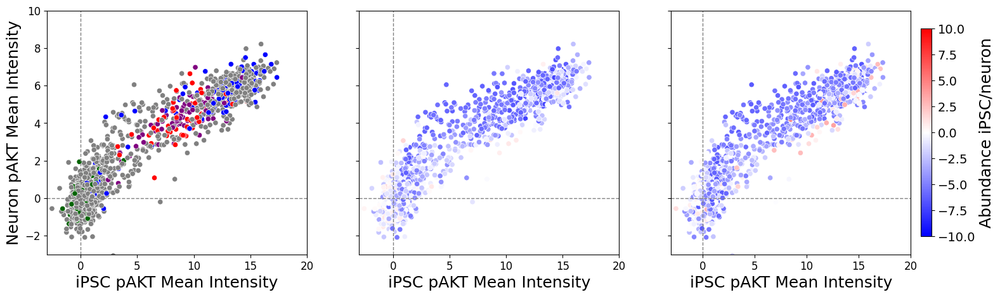

In [44]:
# Look at specific feature scatterplots against abundance and activity
pAKT_iPSvsneuron = \
    plot_two_features_coloredbyactivityabundance(
        variant_medians_merged,
        "Intensity_MeanIntensity_CH3_Corrected_iPSC",
        "Intensity_MeanIntensity_CH3_Corrected_neuron",
        color1='Intensity_MeanIntensity_CH1_iPSC',
        color2='Intensity_MeanIntensity_CH1_neuron',
        cbar_label="Abundance iPSC/neuron",
        xlim=(-3,20),
        ylim=(-3,10),
        label1='iPSC pAKT Mean Intensity',
        label2='Neuron pAKT Mean Intensity'
    )
pAKT_iPSvsneuron.savefig('./consensus_plots/PTENT3.iPSvsneuron.pAKT.011725.pdf')


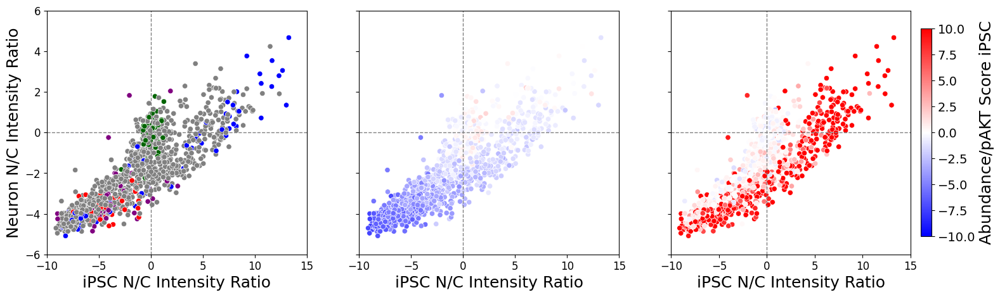

In [45]:
# Look at specific feature scatterplots against abundance and activity
nuctocyto_iPSvsneuron = \
    plot_two_features_coloredbyactivityabundance(
        variant_medians_merged,
        "Nuc/Cyto_Intensity_CH1_iPSC",
        "Nuc/Cyto_Intensity_CH1_neuron",
        color1='Intensity_MeanIntensity_CH1_iPSC',
        color2='Intensity_MeanIntensity_CH3_Corrected_iPSC',
        cbar_label="Abundance/pAKT Score iPSC",
        xlim=(-10,15),
        ylim=(-6,6),
        label1='iPSC N/C Intensity Ratio',
        label2='Neuron N/C Intensity Ratio'
    )
nuctocyto_iPSvsneuron.savefig('./consensus_plots/PTENT3.iPSvsneuron.nuctocyto.011725.pdf')


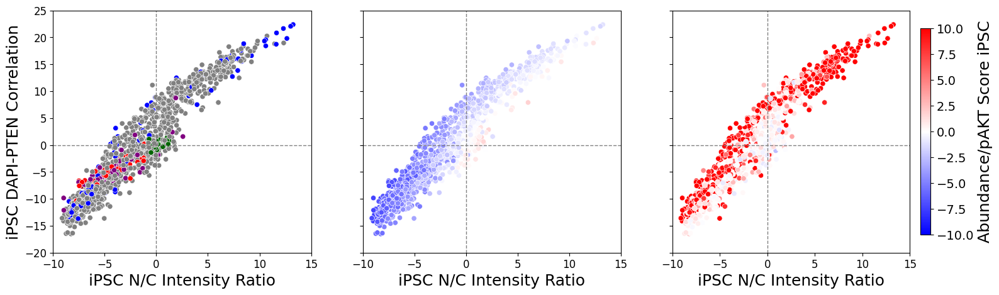

In [46]:
# Look at specific feature scatterplots against abundance and activity
nuctocyto_vs_DAPIPTENcorrelation_iPS = \
    plot_two_features_coloredbyactivityabundance(
        variant_medians_merged,
        "Nuc/Cyto_Intensity_CH1_iPSC",
        "Correlation_Correlation_CH0_CH1_iPSC",
        color1='Intensity_MeanIntensity_CH1_iPSC',
        color2='Intensity_MeanIntensity_CH3_Corrected_iPSC',
        cbar_label="Abundance/pAKT Score iPSC",
        xlim=(-10,15),
        ylim=(-20,25),
        label1='iPSC N/C Intensity Ratio',
        label2='iPSC DAPI-PTEN Correlation'
    )
nuctocyto_vs_DAPIPTENcorrelation_iPS.savefig('./consensus_plots/PTENT3.iPSC.DAPIPTENcorrelationvsnuctocyto.011725.pdf')


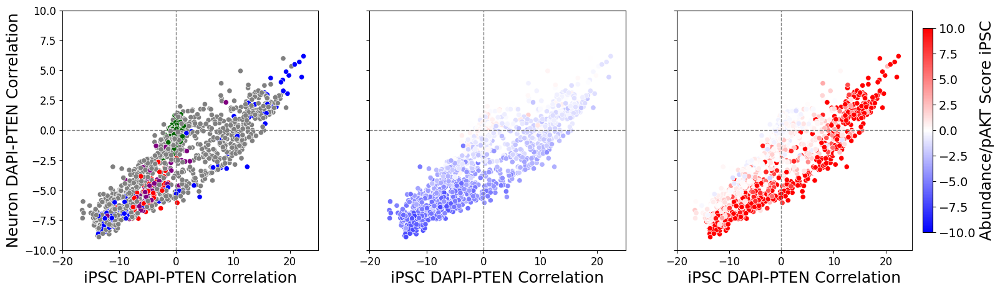

In [47]:
# Look at specific feature scatterplots against abundance and activity
DAPIPTENcorrelation_iPSvsneuron = \
    plot_two_features_coloredbyactivityabundance(
        variant_medians_merged,
        "Correlation_Correlation_CH0_CH1_iPSC",
        "Correlation_Correlation_CH0_CH1_neuron",
        color1='Intensity_MeanIntensity_CH1_iPSC',
        color2='Intensity_MeanIntensity_CH3_Corrected_iPSC',
        cbar_label="Abundance/pAKT Score iPSC",
        xlim=(-20,25),
        ylim=(-10,10),
        label1='iPSC DAPI-PTEN Correlation',
        label2='Neuron DAPI-PTEN Correlation'
    )
DAPIPTENcorrelation_iPSvsneuron.savefig('./consensus_plots/PTENT3.iPSvsneuron.DAPIPTENcorrelation.011725.pdf')


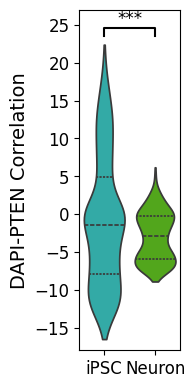

In [48]:
# 1a) Extract just the two columns of interest
cols = ["Correlation_Correlation_CH0_CH1_iPSC",
        "Correlation_Correlation_CH0_CH1_neuron"]
df_violin = variant_medians_merged[cols].dropna()  # drop rows with any NaNs

# 1b) Melt to “long” form so seaborn can split by cell type
df_long = df_violin.melt(var_name="CellType", value_name="DAPIPTENCorr")
df_long["CellType"] = df_long["CellType"].map({
    "Correlation_Correlation_CH0_CH1_iPSC": "iPSC",
    "Correlation_Correlation_CH0_CH1_neuron": "Neuron"
})

# 2) Run the two‐sample KS test
iPSC_vals   = df_violin["Correlation_Correlation_CH0_CH1_iPSC"]
neuron_vals = df_violin["Correlation_Correlation_CH0_CH1_neuron"]
ks_stat, p_val = ks_2samp(iPSC_vals, neuron_vals)

# 3) Plot violins
plt.figure(figsize=(2,4))
ax = sns.violinplot(x="CellType",
                    y="DAPIPTENCorr",
                    data=df_long,
                    inner="quartile",
                    scale="width",
                    palette={'iPSC': '#1fbeb8', 'Neuron': '#4dbd05'},
                    cut=0)
ax.set_xlabel("")
ax.tick_params(labelsize=12)
ax.set_ylim(-18,27)
ax.set_ylabel("DAPI-PTEN Correlation", fontsize=14)

# 4) Draw bracket
# positions of the categories on the x‐axis
x1, x2 = 0, 1  
# top of the violins
y_max = df_long["DAPIPTENCorr"].max()
# how high above the data to draw the bracket
h = 0.05 * y_max   
# vertical position of the bracket
y = y_max + h

# the “┌───┐” shape
ax.plot([x1, x1, x2, x2],
        [y, y+h, y+h, y],
        lw=1.5, c='k')

# 5) Annotate p‐value centered above bracket
ax.text((x1 + x2) / 2, 
        y + h * 1, 
        f"***" if p_val<0.001 else "",
        ha='center', 
        va='bottom',
        fontsize=12)

plt.tight_layout()
plt.savefig('consensus_plots/PTENT3.iPSvsneuron.DAPIPTENcorrelation.violin.061025.pdf')
plt.show()

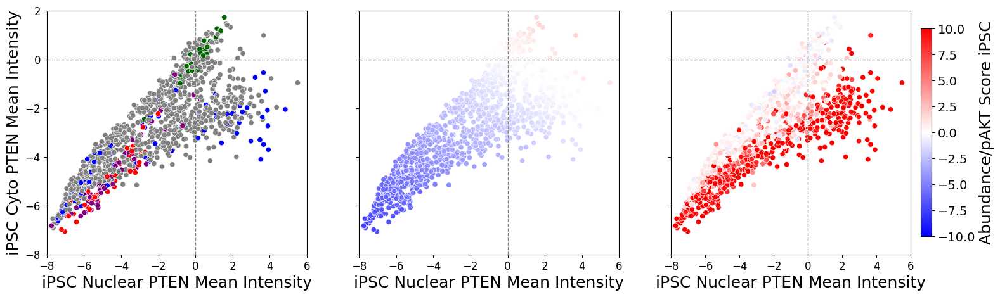

In [49]:
# Look at specific feature scatterplots
# Look at specific feature scatterplots against abundance and activity
nuclearPTENvscytoPTEN_iPSC = \
    plot_two_features_coloredbyactivityabundance(
        variant_medians_merged,
        "Mean_Nuclei_Intensity_MeanIntensity_CH1_iPSC",
        "Mean_Cytoplasm_Intensity_MeanIntensity_CH1_iPSC",
        color1='Intensity_MeanIntensity_CH1_iPSC',
        color2='Intensity_MeanIntensity_CH3_Corrected_iPSC',
        cbar_label="Abundance/pAKT Score iPSC",
        xlim=(-8,6),
        ylim=(-8,2),
        label1='iPSC Nuclear PTEN Mean Intensity',
        label2='iPSC Cyto PTEN Mean Intensity'
    )
nuclearPTENvscytoPTEN_iPSC.savefig('./consensus_plots/PTENT3.iPSC.nuclearvscytoPTEN.011725.pdf')


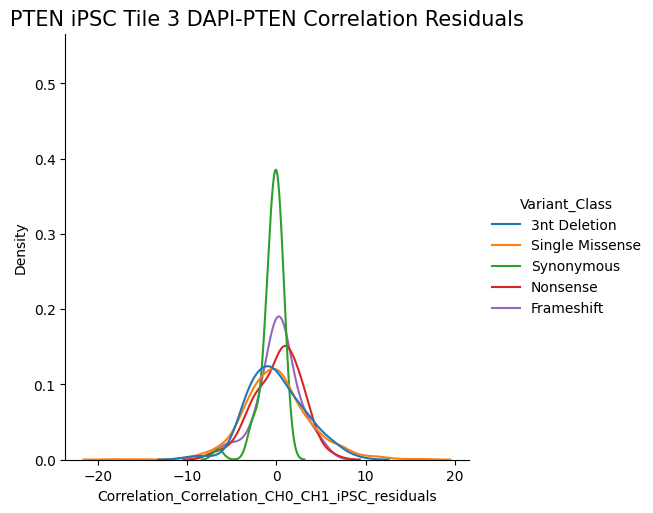

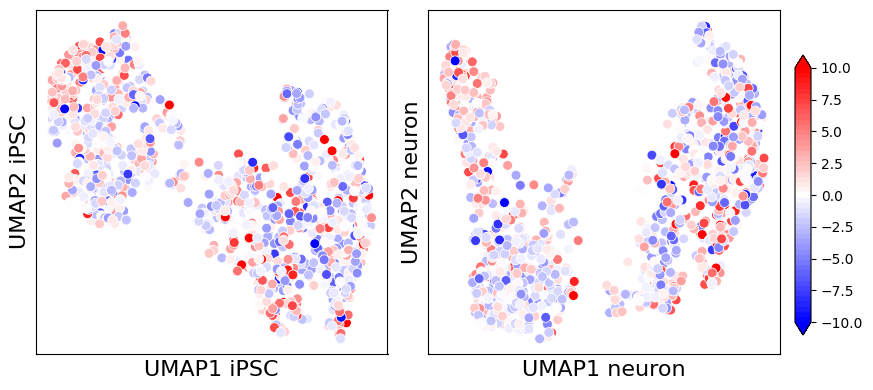

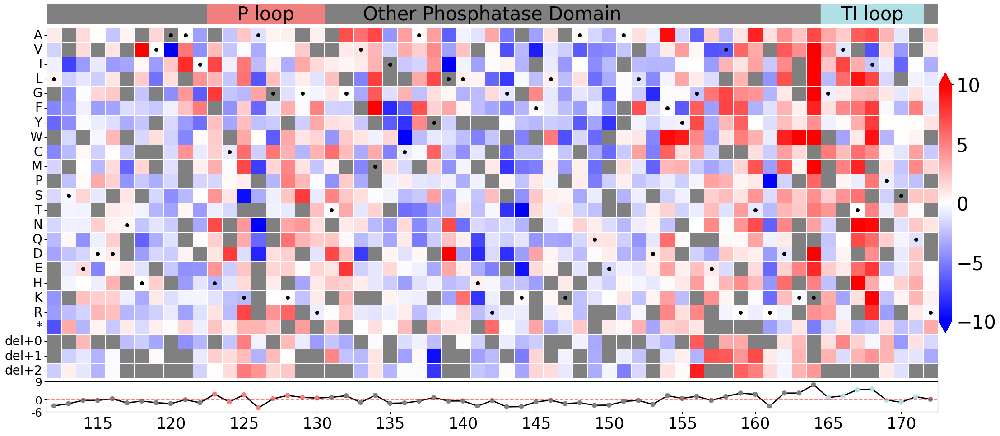

 PyMOL(TM) 3.1.6.1 - Incentive Product
 Copyright (C) Schrodinger, LLC
 
 This Executable Build integrates and extends Open-Source PyMOL.
 Detected 128 CPU cores.  Enabled multithreaded rendering.
 CmdLoad: "" loaded as "1d5r_PTENT3.iPSC.DAPIPTENcorrelationresiduals".
PyMOL>set_view (    -0.839138746,   -0.157006517,   -0.520763457,     0.174852356,    0.828741431,   -0.531615376,     0.515042126,   -0.537154317,   -0.667978406,    -0.000375278,    0.000023644, -226.242431641,   109.331817627,  166.696105957,  124.016159058,    47.521118164,  404.805816650,  -20.000000000 )
 Scene: view updated.
PyMOL>select resi 112-172
 Selector: selection "sele" defined with 476 atoms.
PyMOL>remove solvent
 Remove: eliminated 382 atoms in model "1d5r_PTENT3.iPSC.DAPIPTENcorrelationresiduals".
PyMOL>color grey, not sele
 Executive: Colored 2110 atoms.
PyMOL>spectrum b, blue_white_red, sele, minimum=-10, maximum=10
 Spectrum: range (-10.00000 to 10.00000).
PyMOL>show sticks, sele; show surface, sele; 

In [50]:
# Regression of DAPI-PTEN Correlation against activity and abundance in iPSC
y_col = "Correlation_Correlation_CH0_CH1_iPSC"
feature_cols = [
    #"Intensity_MeanIntensity_CH0_iPSC",
    "Intensity_MeanIntensity_CH1_iPSC",
    "Intensity_MeanIntensity_CH3_Corrected_iPSC"
]

y = variant_medians_merged[y_col].values
X = variant_medians_merged[feature_cols].values

# 2) Instantiate a Kernel Ridge model
#    kernel="rbf" is common; alpha, gamma are hyperparameters
krr = KernelRidge(alpha=1.0, kernel="rbf", gamma=1.0)

# 3) Fit the model: y ~ X
krr.fit(X, y)

# 4) Predict y-hat
y_pred = krr.predict(X)

# 5) Compute residuals
residuals = y - y_pred

# Plot on UMAP and heatmap
addtl_features_df = variant_medians_merged.copy()
addtl_features_df["Correlation_Correlation_CH0_CH1_iPSC_residuals"] = residuals
feature_to_heatmap = "Correlation_Correlation_CH0_CH1_iPSC_residuals"
localization_residual_scores,pymol_command = \
    plot_feature(addtl_features_df,
                 umap_coords,
                 feature_to_heatmap,
                 "PTEN iPSC Tile 3 DAPI-PTEN Correlation Residuals",
                 "PTENT3.iPSC.DAPIPTENcorrelationresiduals",
                 dis_path='./consensus_plots/distributions/',
                 heatmap_path='./consensus_plots/heatmap/',
                 umap_path='./consensus_plots/umap/',
                 pdb_path='./consensus_plots/pdb/',
                 highlight_variants=False,
                 pdb_plot=True,
                 save_plots=True,
                 show_plots=True,
                 threentdels=True,
                 syn_zscore=False,
                 domain_map=PTEN_domain_map,
                 domain_colors=PTEN_domain_coloring,
                 extra_pymol="show sticks, sele; show surface, sele; set transparency=0.5; color green, resi 1352\n",
                 umap1_col=['UMAP1 iPSC','UMAP1 neuron'],
                 umap2_col=['UMAP2 iPSC','UMAP2 neuron'],
                 vmin=-10,
                 vmax=10,
                 pymol_view=pymol_ptenview3,
                 image_size=(4000,3000)
                )
!{pymol_command}


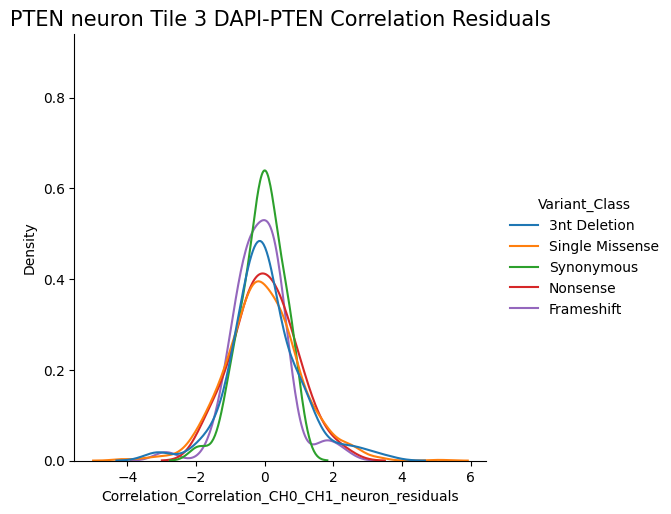

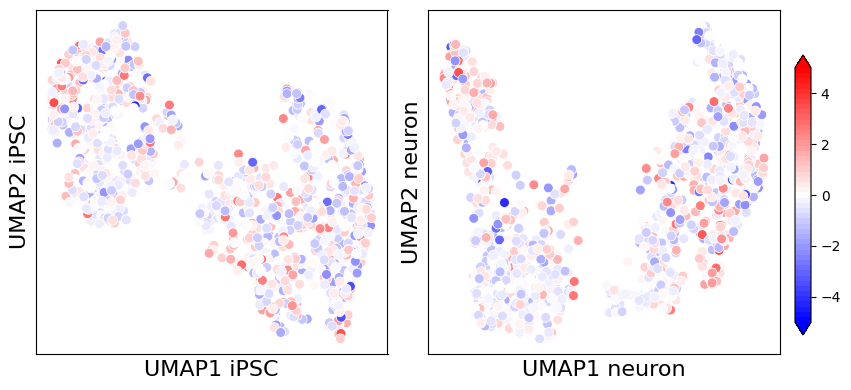

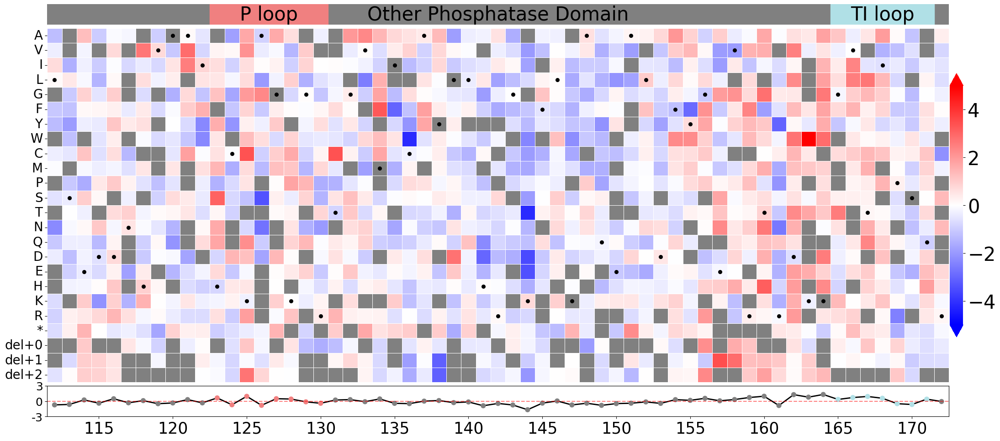

 PyMOL(TM) 3.1.6.1 - Incentive Product
 Copyright (C) Schrodinger, LLC
 
 This Executable Build integrates and extends Open-Source PyMOL.
 Detected 128 CPU cores.  Enabled multithreaded rendering.
 CmdLoad: "" loaded as "1d5r_PTENT3.neuron.DAPIPTENcorrelationresiduals".
PyMOL>set_view (    -0.839138746,   -0.157006517,   -0.520763457,     0.174852356,    0.828741431,   -0.531615376,     0.515042126,   -0.537154317,   -0.667978406,    -0.000375278,    0.000023644, -226.242431641,   109.331817627,  166.696105957,  124.016159058,    47.521118164,  404.805816650,  -20.000000000 )
 Scene: view updated.
PyMOL>select resi 112-172
 Selector: selection "sele" defined with 476 atoms.
PyMOL>remove solvent
 Remove: eliminated 382 atoms in model "1d5r_PTENT3.neuron.DAPIPTENcorrelationresiduals".
PyMOL>color grey, not sele
 Executive: Colored 2110 atoms.
PyMOL>spectrum b, blue_white_red, sele, minimum=-5, maximum=5
 Spectrum: range (-5.00000 to  5.00000).
PyMOL>show sticks, sele; show surface, sele;

In [51]:
# Regression of DAPI-PTEN Correlation against activity and abundance in iPSC
y_col = "Correlation_Correlation_CH0_CH1_neuron"
feature_cols = [
    #"Intensity_MeanIntensity_CH0_neuron",
    "Intensity_MeanIntensity_CH1_neuron",
    "Intensity_MeanIntensity_CH3_Corrected_neuron"
]

y = variant_medians_merged[y_col].values
X = variant_medians_merged[feature_cols].values

# 2) Instantiate a Kernel Ridge model
#    kernel="rbf" is common; alpha, gamma are hyperparameters
krr = KernelRidge(alpha=1.0, kernel="rbf", gamma=1.0)

# 3) Fit the model: y ~ X
krr.fit(X, y)

# 4) Predict y-hat
y_pred = krr.predict(X)

# 5) Compute residuals
residuals = y - y_pred

# Plot on UMAP and heatmap
addtl_features_df["Correlation_Correlation_CH0_CH1_neuron_residuals"] = residuals
feature_to_heatmap = "Correlation_Correlation_CH0_CH1_neuron_residuals"
localization_residual_scores,pymol_command = \
    plot_feature(addtl_features_df,
                 umap_coords,
                 feature_to_heatmap,
                 "PTEN neuron Tile 3 DAPI-PTEN Correlation Residuals",
                 "PTENT3.neuron.DAPIPTENcorrelationresiduals",
                 dis_path='./consensus_plots/distributions/',
                 heatmap_path='./consensus_plots/heatmap/',
                 umap_path='./consensus_plots/umap/',
                 pdb_path='./consensus_plots/pdb/',
                 highlight_variants=False,
                 pdb_plot=True,
                 save_plots=True,
                 show_plots=True,
                 threentdels=True,
                 syn_zscore=False,
                 domain_map=PTEN_domain_map,
                 domain_colors=PTEN_domain_coloring,
                 extra_pymol="show sticks, sele; show surface, sele; set transparency=0.5; color green, resi 1352\n",
                 umap1_col=['UMAP1 iPSC','UMAP1 neuron'],
                 umap2_col=['UMAP2 iPSC','UMAP2 neuron'],
                 vmin=-5,
                 vmax=5,
                 pymol_view=pymol_ptenview3,
                 image_size=(4000,3000)
                )
!{pymol_command}


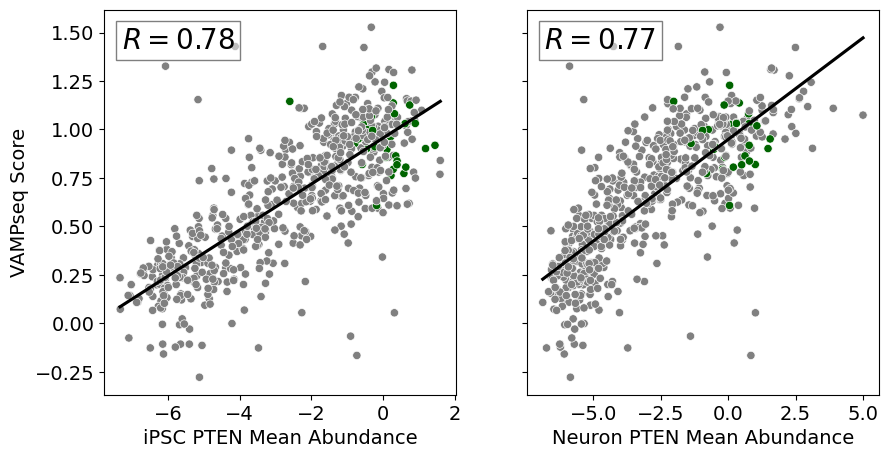

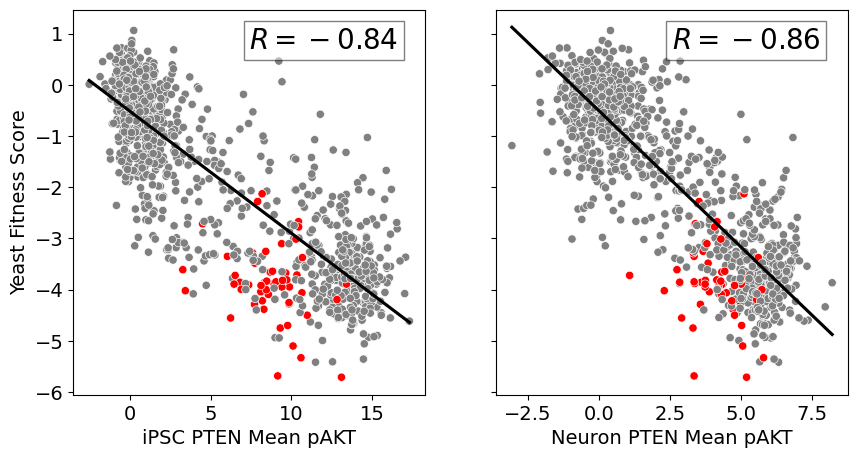

In [35]:
# Look at association between abundance/activity and scans
# abundance
mergedtoVAMPseq_toplot = \
    variant_medians_merged.copy()
mergedtoVAMPseq_toplot = \
    mergedtoVAMPseq_toplot\
        .merge(abundance_HEK_data[['variant','score_total']]\
                   .query('~score_total.isna()'),
               left_on='Variant', 
               right_on='variant',
               how='inner')

fig,axs=plt.subplots(figsize=(10,5), ncols=2, sharey=True)
# Call the scatter_with_regression function for iPSC
scatter_with_regression(
    ax=axs[0],
    data=mergedtoVAMPseq_toplot,
    x='Intensity_MeanIntensity_CH1_iPSC',
    y='score_total',
    hue='Variant_Class',
    palette=variant_type_palette,
    x_label='iPSC PTEN Mean Abundance',
    y_label='VAMPseq Score',  # only put y_label on left subplot
    legend=False  # you can set this True if you want a legend
)

# Call the scatter_with_regression function for Neuron
scatter_with_regression(
    ax=axs[1],
    data=mergedtoVAMPseq_toplot,
    x='Intensity_MeanIntensity_CH1_neuron',
    y='score_total',
    hue='Variant_Class',
    palette=variant_type_palette,
    x_label='Neuron PTEN Mean Abundance',
    y_label=None,  # sharey=True handles the scale, and label not needed
    legend=False
)
#plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/PTENT3.VAMPseqcorrelation.011825.pdf')

# activity
mergedtoactivity_toplot = \
    variant_medians_merged.copy()
mergedtoactivity_toplot = \
    mergedtoactivity_toplot\
        .merge(activity_yeast_data[['Variant (one letter)','Cum_score']]\
                   .query('~Cum_score.isna()'),
               left_on='Variant', 
               right_on='Variant (one letter)',
               how='inner')

fig,axs=plt.subplots(figsize=(10,5), ncols=2, sharey=True)
# Call the scatter_with_regression function for iPSC (activity)
scatter_with_regression(
    ax=axs[0],
    data=mergedtoactivity_toplot,
    x='Intensity_MeanIntensity_CH3_Corrected_iPSC',
    y='Cum_score',
    hue='Variant_Class',
    palette=variant_type_palette,
    x_label='iPSC PTEN Mean pAKT',
    y_label='Yeast Fitness Score',
    legend=False,
    r_xloc=0.5,
    r_yloc=0.9
)

# Call the scatter_with_regression function for Neuron (activity)
scatter_with_regression(
    ax=axs[1],
    data=mergedtoactivity_toplot,
    x='Intensity_MeanIntensity_CH3_Corrected_neuron',
    y='Cum_score',
    hue='Variant_Class',
    palette=variant_type_palette,
    x_label='Neuron PTEN Mean pAKT',
    y_label=None,
    legend=False,
    r_xloc=0.5,
    r_yloc=0.9
)

#plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/PTENT3.Yeastphosphatasecorrelation.011825.pdf')



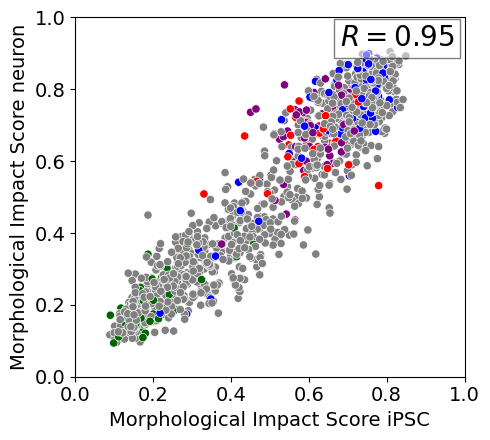

In [52]:
# Plot iPS vs neuron MIS
fig,ax=plt.subplots(figsize=(5,4.5))
scatter_with_regression(
    ax=ax,
    data=df_profiles_merged,
    x='Morphological Impact Score iPSC',
    y='Morphological Impact Score neuron',
    hue='Variant_Class',
    palette=variant_type_palette,
    x_label='Morphological Impact Score iPSC',
    y_label='Morphological Impact Score neuron',
    legend=False,
    r_xloc=0.68,
    r_yloc=0.92,
    show_line=False
)
plt.xlim(0,1)
plt.ylim(0,1)
#plt.legend(markerscale=2, bbox_to_anchor=(1,1), loc='upper left', title='Variant Type', title_fontsize=16, fontsize=12)
plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/morphological_impact.iPSCvsneuron.032825.pdf', dpi=600)


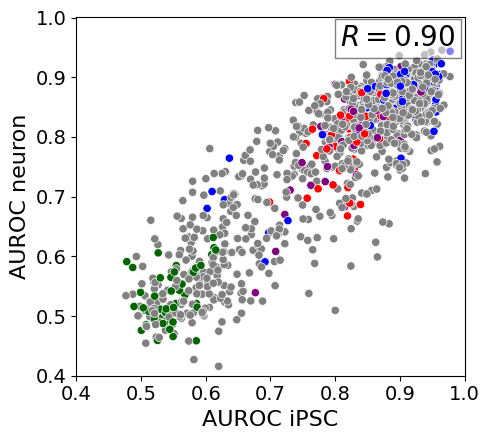

In [53]:
# Plot iPS vs neuron AUC ROC
# Add in ROC AUC scores
df_profiles_withROCAUC = \
    df_profiles_merged\
        .merge(roc_auc_pten_ipsc,   on='Variant', how='inner')\
        .merge(roc_auc_pten_neuron, on='Variant', how='inner')

fig,ax=plt.subplots(figsize=(5,4.5))
scatter_with_regression(
    ax=ax,
    data=df_profiles_withROCAUC,
    x='AUC ROC iPSC',
    y='AUC ROC neuron',
    hue='Variant_Class',
    palette=variant_type_palette,
    x_label='AUC ROC iPSC',
    y_label='AUC ROC neuron',
    legend=False,
    r_xloc=0.68,
    r_yloc=0.92,
    show_line=False
)
plt.xlim(0.4,1)
plt.ylim(0.4,1)
#plt.legend(markerscale=2, bbox_to_anchor=(1,1), loc='upper left', title='Variant Type', title_fontsize=16, fontsize=12)
plt.xlabel('AUROC iPSC', fontsize=16)
plt.ylabel('AUROC neuron', fontsize=16)
plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/auc_roc.iPSCvsneuron.032825.pdf', dpi=600)


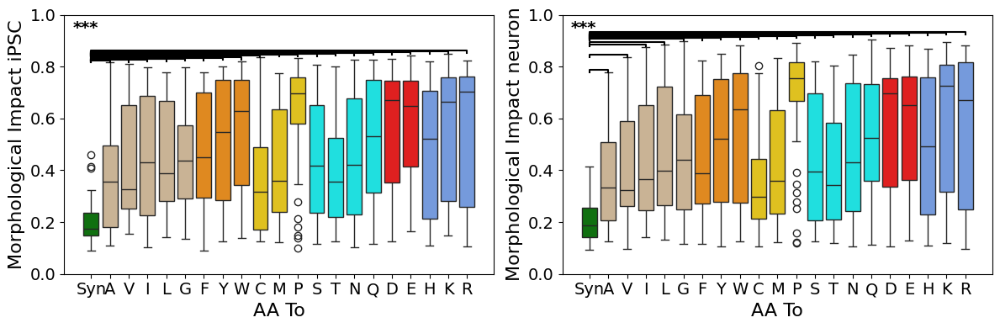

In [54]:
# Plot impact as a function of aa to
aliphatic = ["A", "V", "I", "L", "G"]
aromatic = ["F", "Y", "W"]
nonpolar = ["C", "M", "P"]
polar = ["S", "T", "N", "Q"]
acidic = ["D", "E"]
basic = ["H", "K", "R"]
aa_type = aliphatic+aromatic+nonpolar+polar+acidic+basic
palette_aato={}
palette_aato['Syn']='green'
for t in aliphatic:
    palette_aato[t]='tan'
for t in aromatic:
    palette_aato[t]='darkorange'
for t in nonpolar:
    palette_aato[t]='gold'
for t in polar:
    palette_aato[t]='cyan'
for t in acidic:
    palette_aato[t]='red'
for t in basic:
    palette_aato[t]='cornflowerblue'

df_toplot = df_profiles_merged.query('Variant_Class in ["Synonymous","Single Missense"]').copy()
df_toplot['AA To'] = \
    df_toplot\
        .apply(lambda row: 'Syn' if row['Variant_Class']=='Synonymous' else row['Variant'][-1],axis=1)
fig, axs = plt.subplots(figsize=(12,4),ncols=2)
boxplot_with_significance(
    df=df_toplot,
    x_col='AA To',
    y_col='Morphological Impact Score iPSC',
    hue_col='AA To',  # same as x_col
    order=['Syn']+aa_type,
    alpha=0.001,    # Show significance if p < 0.001
    pairs=[("Syn",t) for t in aa_type],
    palette=palette_aato,
    offset=0.002,
    ax=axs[0],
    anno_sample_sizes=False
)
axs[0].set_ylim(0, 1)

boxplot_with_significance(
    df=df_toplot,
    x_col='AA To',
    y_col='Morphological Impact Score neuron',
    hue_col='AA To',  # same as x_col
    order=['Syn']+aa_type,
    alpha=0.001,    # Show significance if p < 0.001
    pairs=[("Syn",t) for t in aa_type],
    palette=palette_aato,
    offset=0.002,
    ax=axs[1],
    anno_sample_sizes=False
)
axs[1].set_ylim(0, 1)

# Labels
axs[0].set_ylabel("Morphological Impact iPSC", fontsize=16)
axs[0].set_xlabel("AA To", fontsize=16)
axs[1].set_ylabel("Morphological Impact neuron", fontsize=16)
axs[1].set_xlabel("AA To", fontsize=16)

# Font size
axs[0].tick_params(axis='both',labelsize=14)
axs[1].tick_params(axis='both',labelsize=14)

plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/morphological_impact.aato.011525.pdf', dpi=600)


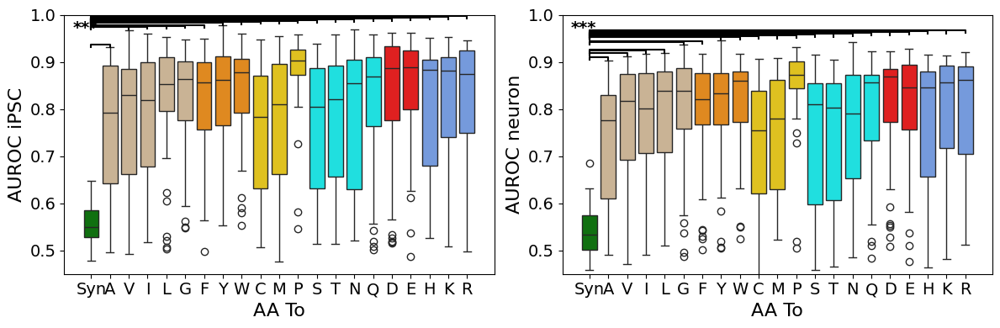

In [55]:
# Plot AUC as a function of aa to
df_toplot = df_profiles_withROCAUC.query('Variant_Class in ["Synonymous","Single Missense"]').copy()
df_toplot['AA To'] = \
    df_toplot\
        .apply(lambda row: 'Syn' if row['Variant_Class']=='Synonymous' else row['Variant'][-1],axis=1)
fig, axs = plt.subplots(figsize=(12,4),ncols=2)
boxplot_with_significance(
    df=df_toplot,
    x_col='AA To',
    y_col='AUC ROC iPSC',
    hue_col='AA To',  # same as x_col
    order=['Syn']+aa_type,
    alpha=0.001,    # Show significance if p < 0.001
    pairs=[("Syn",t) for t in aa_type],
    palette=palette_aato,
    offset=0.002,
    ax=axs[0],
    anno_sample_sizes=False
    
)
axs[0].set_ylim(0.45, 1)

boxplot_with_significance(
    df=df_toplot,
    x_col='AA To',
    y_col='AUC ROC neuron',
    hue_col='AA To',  # same as x_col
    order=['Syn']+aa_type,
    alpha=0.001,    # Show significance if p < 0.001
    pairs=[("Syn",t) for t in aa_type],
    palette=palette_aato,
    offset=0.002,
    ax=axs[1],
    anno_sample_sizes=False,
)
axs[1].set_ylim(0.45, 1)

# Labels
axs[0].set_ylabel("AUROC iPSC", fontsize=16)
axs[0].set_xlabel("AA To", fontsize=16)
axs[1].set_ylabel("AUROC neuron", fontsize=16)
axs[1].set_xlabel("AA To", fontsize=16)

# Font size
axs[0].tick_params(axis='both',labelsize=14)
axs[1].tick_params(axis='both',labelsize=14)

plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/auc_roc.aato.011525.pdf', dpi=600)


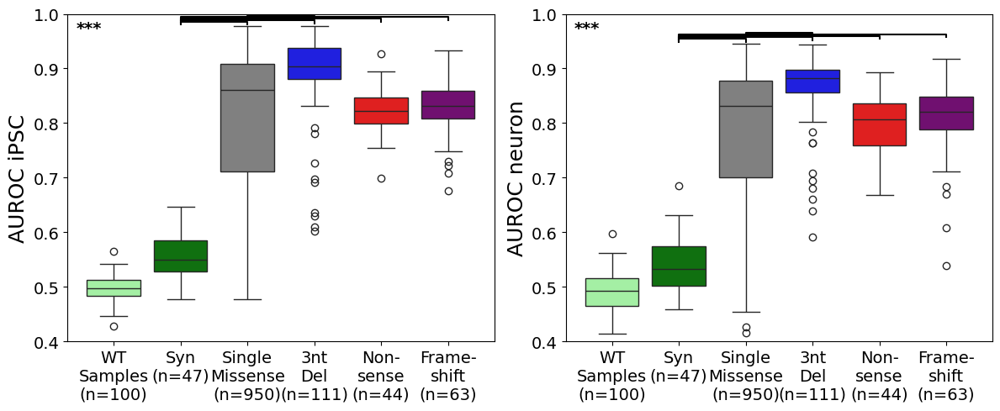

In [57]:
# Plot AUC as a function of class
df_toplot = df_profiles_withROCAUC.copy()
df_toplot['Variant Type'] = \
    df_toplot['Variant_Class'].map(lambda x: variant_type_name_forplotting[x])
# add on wt sample controls
roc_auc_pten_ipsc_controls['Variant Type'] = wt_controls_name
df_toplot_pluscontrols_iPSC = \
    pd.concat([df_toplot[['Variant','AUC ROC iPSC','Variant Type']], roc_auc_pten_ipsc_controls]).reset_index()
roc_auc_pten_neuron_controls['Variant Type'] = wt_controls_name
df_toplot_pluscontrols_neuron = \
    pd.concat([df_toplot[['Variant','AUC ROC neuron','Variant Type']], roc_auc_pten_neuron_controls]).reset_index()

col_order = [wt_controls_name, 'Syn','Single\nMissense','3nt\nDel','Non-\nsense','Frame-\nshift']
fig, axs = plt.subplots(figsize=(12,5),ncols=2)
boxplot_with_significance(
    df=df_toplot_pluscontrols_iPSC,
    x_col='Variant Type',
    y_col='AUC ROC iPSC',
    hue_col='Variant Type',  # same as x_col
    order=col_order,
    palette=variant_type_palette_forplotting,
    alpha=0.001,    # Show significance if p < 0.001
    pairs=[("Syn",s) for s in col_order[1:] if s!='Syn']+\
            [("Single\nMissense",s) for s in col_order[1:] if s not in ["Syn","Single\nMissense"]],
    offset=0.005,
    ax=axs[0],
    anno_sample_sizes=True
)
axs[0].set_ylim(0.4, 1)

boxplot_with_significance(
    df=df_toplot_pluscontrols_neuron,
    x_col='Variant Type',
    y_col='AUC ROC neuron',
    hue_col='Variant Type',  # same as x_col
    order=col_order,
    palette=variant_type_palette_forplotting,
    alpha=0.001,    # Show significance if p < 0.001
    pairs=[("Syn",s) for s in col_order[1:] if s!='Syn']+\
            [("Single\nMissense",s) for s in col_order[1:] if s not in ["Syn","Single\nMissense"]],
    offset=0.005,
    ax=axs[1],
    anno_sample_sizes=True
)
axs[1].set_ylim(0.4, 1)

# Labels
axs[0].set_ylabel("AUROC iPSC", fontsize=18)
axs[0].set_xlabel("", fontsize=16)
axs[1].set_ylabel("AUROC neuron", fontsize=18)
axs[1].set_xlabel("", fontsize=16)

# Font size
axs[0].tick_params(axis='both',labelsize=14)
axs[1].tick_params(axis='both',labelsize=14)

plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/auc_roc.variant_class.011525.pdf', dpi=600)


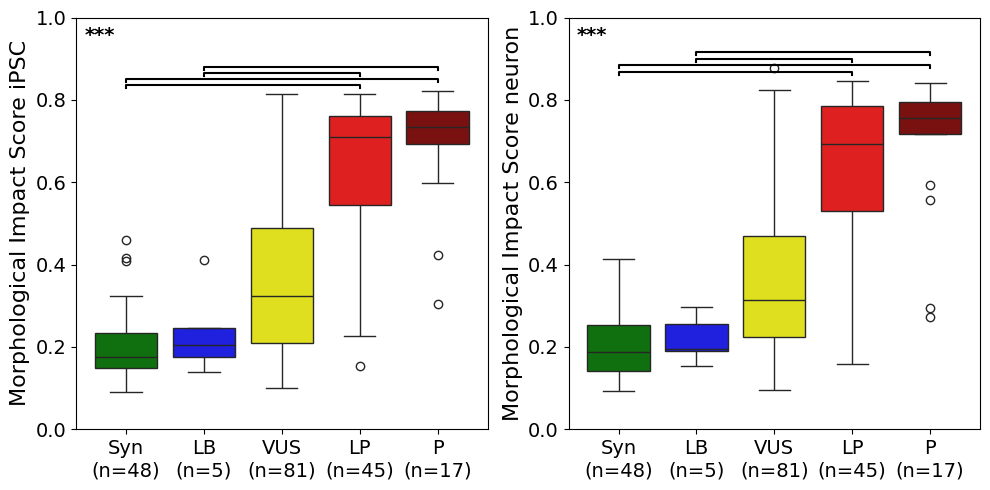

In [58]:
# Look at PTEN variants in ClinVar
df_toplot = pd.merge(df_profiles_merged, 
                     clinvar_variants_annotated_PTENT3_splicefilt\
                         [['Variant','Clinvar label']],
                     on='Variant', 
                     how='inner')
df_toplot2 = pd.concat([
                        df_toplot,
                        df_profiles_merged.query('Variant_Class == "Synonymous"').assign(**{'Clinvar label':'Syn'})
                       ])
df_toplot2 = \
    df_toplot2.rename(columns={'Clinvar label':'ClinVAR Label'})

fig, axs = plt.subplots(figsize=(10,5),ncols=2)
boxplot_with_significance(
    df=df_toplot2,
    x_col='ClinVAR Label',
    y_col='Morphological Impact Score iPSC',
    hue_col='ClinVAR Label',  # same as x_col
    order=['Syn','LB','VUS','LP','P'],
    palette={'Syn':'green','VUS':'yellow','LP':'red','P':'darkred','LB':'blue'},
    alpha=0.001,    # Show significance if p < 0.001
    pairs=[("Syn","LP"),
           ("Syn","P"),
           ("LB","LP"),
           ("LB","P")],
    offset=0.02,
    ax=axs[0]
)
axs[0].set_ylim(0, 1)

boxplot_with_significance(
    df=df_toplot2,
    x_col='ClinVAR Label',
    y_col='Morphological Impact Score neuron',
    hue_col='ClinVAR Label',  # same as x_col
    order=['Syn','LB','VUS','LP','P'],
    palette={'Syn':'green','VUS':'yellow','LP':'red','P':'darkred','LB':'blue'},
    alpha=0.001,    # Show significance if p < 0.001
    pairs=[("Syn","LP"),
           ("Syn","P"),
           ("LB","LP"),
           ("LB","P")],
    offset=0.02,
    ax=axs[1]
)

axs[1].set_ylim(0, 1)

# Labels
axs[0].set_ylabel("Morphological Impact Score iPSC", fontsize=16)
axs[1].set_ylabel("Morphological Impact Score neuron", fontsize=16)

# Font size
axs[0].tick_params(axis='both',labelsize=14)
axs[1].tick_params(axis='both',labelsize=14)
axs[0].set_xlabel("")
axs[1].set_xlabel("")

plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/morphological_impact.clinvar.011525.pdf', dpi=600)


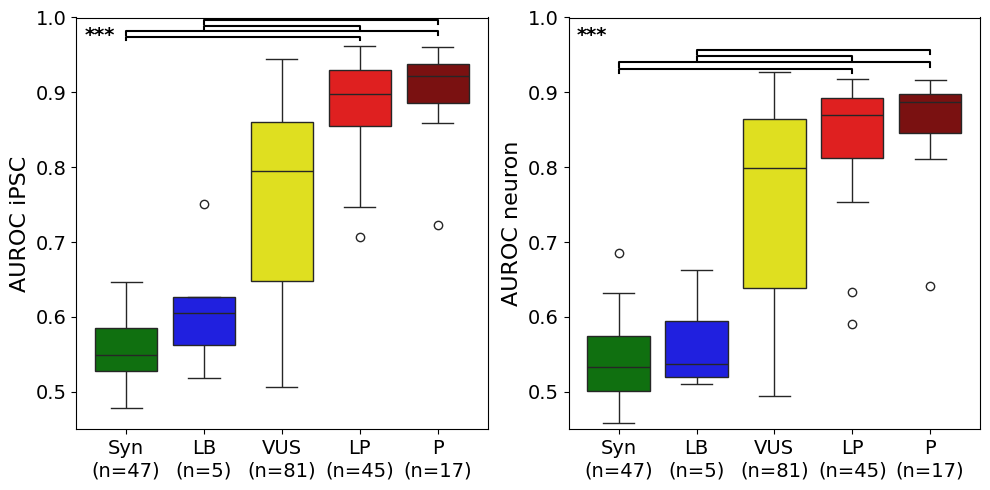

In [59]:
# Look at PTEN variants in ClinVar
df_toplot = pd.merge(df_profiles_merged, 
                     clinvar_variants_annotated_PTENT3_splicefilt\
                         [['Variant','Clinvar label']],
                     on='Variant', 
                     how='inner')
df_toplot2 = pd.concat([
                        df_toplot,
                        df_profiles_merged.query('Variant_Class == "Synonymous"').assign(**{'Clinvar label':'Syn'})
                       ])
df_toplot2 = \
    df_toplot2.rename(columns={'Clinvar label':'ClinVAR Label'})
df_toplot2 = \
    df_toplot2.merge(roc_auc_pten_ipsc,on='Variant',how='inner').merge(roc_auc_pten_neuron,on='Variant',how='inner')

fig, axs = plt.subplots(figsize=(10,5),ncols=2)
boxplot_with_significance(
    df=df_toplot2,
    x_col='ClinVAR Label',
    y_col='AUC ROC iPSC',
    hue_col='ClinVAR Label',  # same as x_col
    order=['Syn','LB','VUS','LP','P'],
    palette={'Syn':'green','VUS':'yellow','LP':'red','P':'darkred','LB':'blue'},
    alpha=0.001,    # Show significance if p < 0.001
    pairs=[("Syn","LP"),
           ("Syn","P"),
           ("LB","LP"),
           ("LB","P")],
    offset=0.015,
    ax=axs[0]
)
axs[0].set_ylim(0.45, 1)

boxplot_with_significance(
    df=df_toplot2,
    x_col='ClinVAR Label',
    y_col='AUC ROC neuron',
    hue_col='ClinVAR Label',  # same as x_col
    order=['Syn','LB','VUS','LP','P'],
    palette={'Syn':'green','VUS':'yellow','LP':'red','P':'darkred','LB':'blue'},
    alpha=0.001,    # Show significance if p < 0.001
    pairs=[("Syn","LP"),
           ("Syn","P"),
           ("LB","LP"),
           ("LB","P")],
    offset=0.015,
    ax=axs[1]
)

axs[1].set_ylim(0.45, 1)

# Labels
axs[0].set_ylabel("AUROC iPSC", fontsize=16)
axs[1].set_ylabel("AUROC neuron", fontsize=16)
axs[0].set_xlabel("")
axs[1].set_xlabel("")

# Font size
axs[0].tick_params(axis='both',labelsize=14)
axs[1].tick_params(axis='both',labelsize=14)

plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/auc_roc.clinvar.011525.pdf', dpi=600)


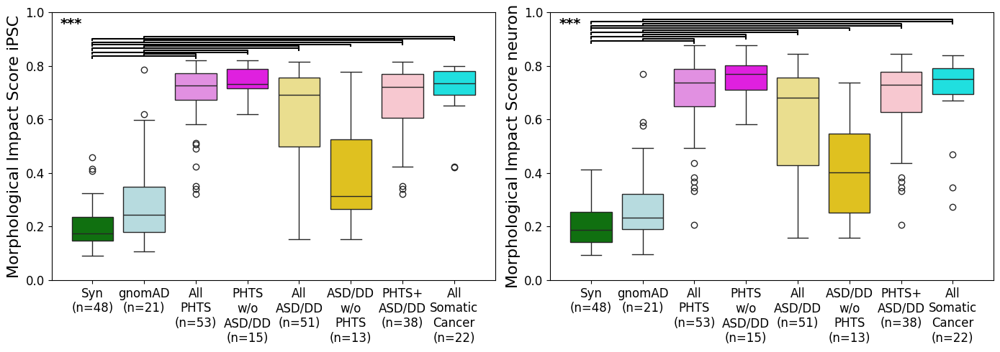

In [60]:
# A) helper to convert three-letter → one-letter (e.g. "Tyr88Phe" → "Y88F")
aa_map = {
    'Ala':'A','Arg':'R','Asn':'N','Asp':'D','Cys':'C',
    'Glu':'E','Gln':'Q','Gly':'G','His':'H','Ile':'I',
    'Leu':'L','Lys':'K','Met':'M','Phe':'F','Pro':'P',
    'Ser':'S','Thr':'T','Trp':'W','Tyr':'Y','Val':'V'
}
def to_short(hgvs):
    m = re.match(r'^p\.?([A-Za-z]{3})(\d+)([A-Za-z]{3})$', hgvs)
    if not m:
        return None
    return f"{aa_map[m.group(1)]}{m.group(2)}{aa_map[m.group(3)]}"

def assign_category_all_disease(row, diseases=['PHTS','ASD/DD','Somatic\nCancer']):
    if row['Variant_Class'] == 'Synonymous':
        return 'Syn'
    elif row['HasDisease'] is True:
        if row['Disease'] in diseases:
            return f"All\n{row['Disease']}"
        else:
            return row['Disease']
    else:
        return None

def assign_category_only_disease(row, diseases=['PHTS','ASD/DD']):
    if row['Variant_Class'] == 'Synonymous':
        return 'Syn'
    if row['num_diseases'] == 1 and row['HasDisease'] is True:
        disease_not = [d for d in diseases if d != row['Disease']][0]
        return f"{row['Disease']}\nw/o\n{disease_not}"

def assign_category_both_disease(row, diseases=['PHTS','ASD/DD']):
    if row['Variant_Class'] == 'Synonymous':
        return 'Syn'
    if row['num_diseases'] == 2 and row['HasDisease'] is True:
        return f"{diseases[0]}+\n{diseases[1]}"
    return None

# --- 1a) gnomAD controls (short form already in your df) ★---
gnomad_set = set(gnomad_PTEN_filt_df['Variant'])

# --- 1b) COSMIC positives (convert to 'Y88F' style) ★---
cosmic_set = cosmic_variants_pten_missense_t3_splicefilt.query('Count >= @somatic_cancer_count_filter')['Variant']
cosmic_set = set(cosmic_set.dropna())

# --- 2) Merge morphology → phenotype fractions (same as before) ---
df_AM_anno = (
    df_profiles_merged
      .merge(pten_variantbyphenotype_AM_splicefilt, on='Variant', how='left')
      .merge(roc_auc_pten_ipsc,   on='Variant', how='left')
      .merge(roc_auc_pten_neuron, on='Variant', how='left')
)

# ★ add gnomAD & COSMIC flags
df_AM_anno['gnomAD']  = df_AM_anno['Variant'].isin(gnomad_set)
df_AM_anno['Somatic\nCancer']  = df_AM_anno['Variant'].isin(cosmic_set)

# --- 2b) threshold your phenos as before ---
phenos    = ['PHTS','ASD/DD']
threshold = 0.01
for p in phenos:
    df_AM_anno[p] = df_AM_anno[p] >= threshold

# --- 3) count diseases (gnomAD/COSMIC not included) ----
df_AM_anno['num_diseases'] = df_AM_anno[phenos].sum(axis=1)

# --- 4) melt **including** gnomAD & COSMIC ★ ---
df_melt = df_AM_anno.melt(
    id_vars=['Variant',
             'Morphological Impact Score iPSC',
             'Morphological Impact Score neuron',
             'AUC ROC iPSC',
             'AUC ROC neuron',
             'Variant_Class',
             'num_diseases'],
    value_vars=phenos + ['gnomAD','Somatic\nCancer'],
    var_name='Disease',
    value_name='HasDisease'
)

# --- 5) assign categories exactly as before (COSMIC comes through in the “all” set) ---
df_melt['Category'] = df_melt.apply(assign_category_all_disease, axis=1)
df_melt2 = df_melt[~df_melt['Category'].isin(["Syn","gnomAD","All\nSomatic\nCancer"])].query('num_diseases == 1').copy()
df_melt2['Category'] = df_melt2.apply(assign_category_only_disease, axis=1)
df_melt5 = df_melt[~df_melt['Category'].isin(["Syn","gnomAD","All\nSomatic\nCancer"])].query('num_diseases == 2').copy()
df_melt5['Category'] = df_melt5.apply(assign_category_both_disease, axis=1)

# pull back just the gnomAD/COSMIC rows if you need them separately
df_melt7 = df_melt[df_melt['Category'].isin(["gnomAD","All\nSomatic\nCancer"])]

# drop Nones
df_melt  = df_melt.dropna(subset=['Category'])
df_melt2 = df_melt2.dropna(subset=['Category'])
df_melt5 = df_melt5.dropna(subset=['Category'])

# --- 6) combine and dedupe ★---
df_melt3 = pd.concat([df_melt, df_melt2, df_melt5], ignore_index=True)
df_melt3 = df_melt3.drop_duplicates(subset=['Variant','Category'])
df_melt6 = pd.concat([df_melt7, df_melt2, df_melt5], ignore_index=True)
df_melt6 = df_melt6.drop_duplicates(subset=['Variant','Category'])

# --- 7) rename & set order & palette ★---
df_melt3['Category'] = df_melt3['Category'].replace({'Synonymous':'Syn'})

category_order = [
    'Syn',      # 1) synonyms
    'gnomAD',   # 2) controls from gnomAD
    'All\nPHTS',     # 3) disease categories
    'PHTS\nw/o\nASD/DD',
    'All\nASD/DD',
    'ASD/DD\nw/o\nPHTS',
    'PHTS+\nASD/DD',
    'All\nSomatic\nCancer',   # 4) your cancer variants
]

category_palette = \
    {
     'Syn':'green',
     'ASD/DD\nw/o\nPHTS':'gold',
     'All\nASD/DD':'#F9E980',
     'PHTS\nw/o\nASD/DD':'magenta',
     'All\nPHTS':'violet',
     'PHTS+\nASD/DD':'pink',
     'All\nSomatic\nCancer':'cyan',
     'Somatic\nCancer only':'darkcyan',
     'gnomAD':'powderblue'
    }

# --- 8) filter tiny bins if you want  ---
min_count = 5
valid = df_melt3['Category'].value_counts().loc[lambda s: s>=min_count].index
category_order = [c for c in category_order if c in valid]

# --- 9) rebuild your pairwise tests ★---
pairs_totest = []
for base in category_order:
    if base!='Syn':
        pairs_totest.append(('Syn', base))
    if base!='gnomAD':
        pairs_totest.append(('gnomAD', base))
    # compare COSMIC to diseases:
    if base not in ['Syn','gnomAD','Somatic\nCancer']:
        pairs_totest.append(('Somatic\nCancer', base))

# --- 10) plot as before ---
fig, axs = plt.subplots(figsize=(14,5), ncols=2)

boxplot_with_significance(
    df=df_melt3,
    x_col='Category',
    y_col='Morphological Impact Score iPSC',
    hue_col='Category',
    order=category_order,
    palette=category_palette,
    alpha=0.001,
    pairs=pairs_totest,
    offset=0.01,
    ax=axs[0]
)
axs[0].set_ylim(0,1)
axs[0].set_xlabel("", fontsize=16)
axs[0].set_ylabel("Morphological Impact Score iPSC", fontsize=16)
axs[0].tick_params(labelsize=12)

boxplot_with_significance(
    df=df_melt3,
    x_col='Category',
    y_col='Morphological Impact Score neuron',
    hue_col='Category',
    order=category_order,
    palette=category_palette,
    alpha=0.001,
    pairs=pairs_totest,
    offset=0.01,
    ax=axs[1]
)
axs[1].set_ylim(0,1)
axs[1].set_xlabel("", fontsize=16)
axs[1].set_ylabel("Morphological Impact Score neuron", fontsize=16)
axs[1].tick_params(labelsize=12)

plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/morphological_impact.with_gnomad_COSMIC.pdf', dpi=600)


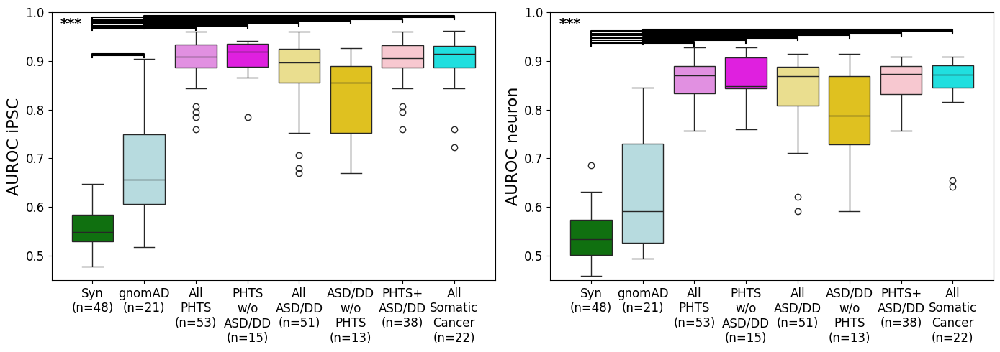

In [61]:
# Plot AUC ROC 
fig, axs = plt.subplots(figsize=(14,5), ncols=2)

boxplot_with_significance(
    df=df_melt3,
    x_col='Category',
    y_col='AUC ROC iPSC',
    hue_col='Category',
    order=category_order,
    palette=category_palette,
    alpha=0.001,
    pairs=pairs_totest,
    offset=0.005,
    ax=axs[0]
)
axs[0].set_ylim(0.45,1)
axs[0].set_xlabel("", fontsize=16)
axs[0].set_ylabel("AUROC iPSC", fontsize=16)
axs[0].tick_params(labelsize=12)

boxplot_with_significance(
    df=df_melt3,
    x_col='Category',
    y_col='AUC ROC neuron',
    hue_col='Category',
    order=category_order,
    palette=category_palette,
    alpha=0.001,
    pairs=pairs_totest,
    offset=0.005,
    ax=axs[1]
)
axs[1].set_ylim(0.45,1)
axs[1].set_xlabel("", fontsize=16)
axs[1].set_ylabel("AUROC neuron", fontsize=16)
axs[1].tick_params(labelsize=12)

plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/auc_roc.with_gnomad_COSMIC.052725.pdf', dpi=600)


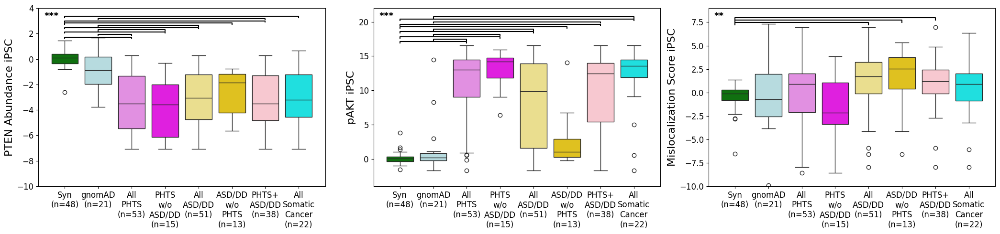

In [62]:
# How do variants compare on features?
df_melt4 = \
    df_melt3\
        .merge(addtl_features_df,
               on='Variant')

# Plot
fig, axs = plt.subplots(figsize=(21,5),ncols=3)
boxplot_with_significance(
    df=df_melt4,
    x_col='Category',
    y_col='Intensity_MeanIntensity_CH1_iPSC',
    hue_col='Category',  # same as x_col
    order=category_order,
    palette=category_palette,
    alpha=0.001,    # Show significance if p < 0.001
    pairs=pairs_totest,
    offset=0.02,
    ax=axs[0]
)
axs[0].set_ylim(-10, 4)
axs[0].set_ylabel('PTEN Abundance iPSC', fontsize=16)

boxplot_with_significance(
    df=df_melt4,
    x_col='Category',
    y_col='Intensity_MeanIntensity_CH3_Corrected_iPSC',
    hue_col='Category',  # same as x_col
    order=category_order,
    palette=category_palette,
    alpha=0.001,    # Show significance if p < 0.001
    pairs=pairs_totest,
    offset=0.02,
    ax=axs[1]
)
axs[1].set_ylim(-4, 22)
axs[1].set_ylabel('pAKT iPSC', fontsize=16)

boxplot_with_significance(
    df=df_melt4,
    x_col='Category',
    y_col='Correlation_Correlation_CH0_CH1_iPSC_residuals',
    hue_col='Category',  # same as x_col
    order=category_order,
    palette=category_palette,
    alpha=0.01,    # Show significance if p < 0.001,
    pairs=pairs_totest,
    shared_label='**',
    offset=0.01,
    ax=axs[2]
)
axs[2].set_ylim(-10,9)
axs[2].set_ylabel('Mislocalization Score iPSC', fontsize=16)

# Labels
axs[0].set_xlabel("", fontsize=16)
axs[1].set_xlabel("", fontsize=16)
axs[2].set_xlabel("", fontsize=16)

# Font size
axs[0].tick_params(axis='both',labelsize=12)
axs[1].tick_params(axis='both',labelsize=12)
axs[2].tick_params(axis='both',labelsize=12)

plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/landmarkfeatures.iPSC.disease.051325.pdf', dpi=600)


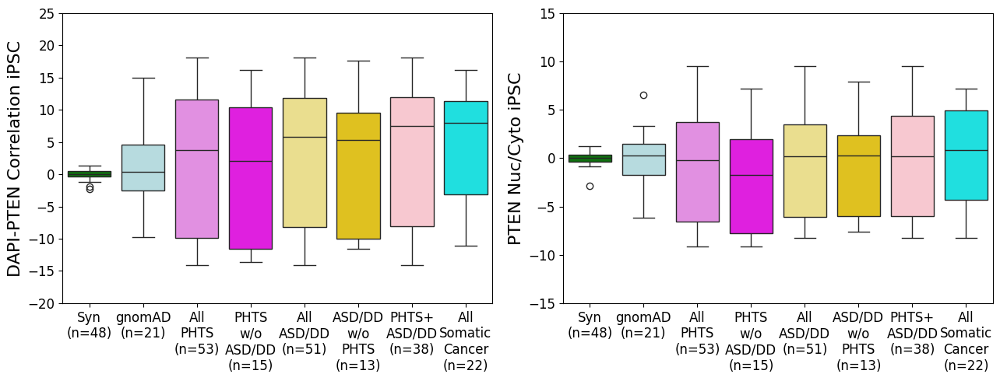

In [63]:
# How do variants compare on features?
# Plot
fig, axs = plt.subplots(figsize=(13,5),ncols=2)
boxplot_with_significance(
    df=df_melt4,
    x_col='Category',
    y_col='Correlation_Correlation_CH0_CH1_iPSC',
    hue_col='Category',  # same as x_col
    order=category_order,
    palette=category_palette,
    alpha=0.01,    # Show significance if p < 0.001,
    shared_label="**",
    offset=0.01,
    ax=axs[0]
)
axs[0].set_ylim(-20, 25)
axs[0].set_ylabel('DAPI-PTEN Correlation iPSC', fontsize=16)

boxplot_with_significance(
    df=df_melt4,
    x_col='Category',
    y_col='Nuc/Cyto_Intensity_CH1_iPSC',
    hue_col='Category',  # same as x_col
    order=category_order,
    palette=category_palette,
    alpha=0.01,    # Show significance if p < 0.001,
    shared_label="**",
    offset=0.01,
    ax=axs[1]
)
axs[1].set_ylim(-15, 15)
axs[1].set_ylabel('PTEN Nuc/Cyto iPSC', fontsize=16)

# Labels
axs[0].set_xlabel("", fontsize=16)
axs[1].set_xlabel("", fontsize=16)

# Font size
axs[0].tick_params(axis='both',labelsize=12)
axs[1].tick_params(axis='both',labelsize=12)

plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/landmarkfeatures2.iPSC.disease.051325.pdf', dpi=600)


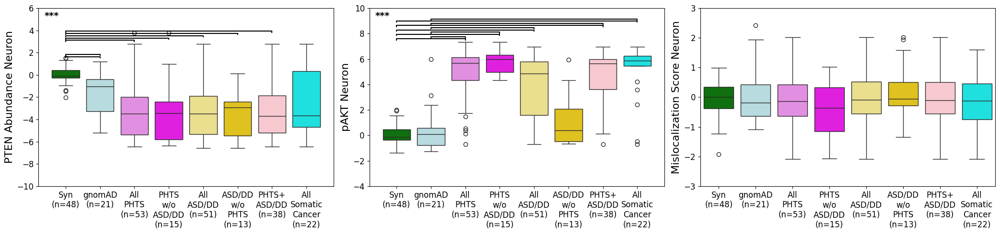

In [64]:
# How do variants compare on features?
df_melt4 = \
    df_melt3\
        .merge(addtl_features_df[['Variant',
                                  'Intensity_MeanIntensity_CH1_neuron',
                                  'Intensity_MeanIntensity_CH3_Corrected_neuron',
                                  'Correlation_Correlation_CH0_CH1_neuron',
                                  'Correlation_Correlation_CH0_CH1_neuron_residuals']],
               on='Variant')

# Plot
fig, axs = plt.subplots(figsize=(21,5),ncols=3)
boxplot_with_significance(
    df=df_melt4,
    x_col='Category',
    y_col='Intensity_MeanIntensity_CH1_neuron',
    hue_col='Category',  # same as x_col
    order=category_order,
    palette=category_palette,
    alpha=0.001,    # Show significance if p < 0.001
    pairs=pairs_totest,
    offset=0.02,
    ax=axs[0]
)
axs[0].set_ylim(-10, 6)
axs[0].set_ylabel('PTEN Abundance Neuron', fontsize=16)
umap_coords
boxplot_with_significance(
    df=df_melt4,
    x_col='Category',
    y_col='Intensity_MeanIntensity_CH3_Corrected_neuron',
    hue_col='Category',  # same as x_col
    order=category_order,
    palette=category_palette,
    alpha=0.001,    # Show significance if p < 0.001
    pairs=pairs_totest,
    offset=0.02,
    ax=axs[1]
)
axs[1].set_ylim(-4, 10)
axs[1].set_ylabel('pAKT Neuron', fontsize=16)

boxplot_with_significance(
    df=df_melt4,
    x_col='Category',
    y_col='Correlation_Correlation_CH0_CH1_neuron_residuals',
    hue_col='Category',  # same as x_col
    order=category_order,
    palette=category_palette,
    alpha=0.01,    # Show significance if p < 0.01,
    shared_label='**',
    pairs=pairs_totest,
    offset=0.02,
    ax=axs[2]
)
axs[2].set_ylim(-3, 3)
axs[2].set_ylabel('Mislocalization Score Neuron', fontsize=16)

# Labels
axs[0].set_xlabel("", fontsize=16)
axs[1].set_xlabel("", fontsize=16)
axs[2].set_xlabel("", fontsize=16)

# Font size
axs[0].tick_params(axis='both',labelsize=12)
axs[1].tick_params(axis='both',labelsize=12)
axs[2].tick_params(axis='both',labelsize=12)

plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/landmarkfeatures.neuron.disease.051325.pdf', dpi=600)


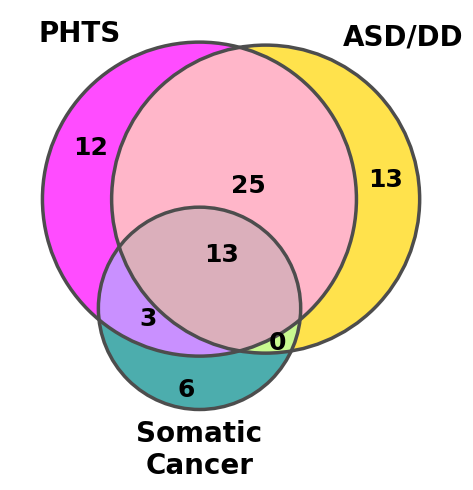

In [65]:
# Make venn diagrams for annotated variants

# ─────────────────────────────────────────────────────────────────────────────
# 1) Get annotated variants
# ─────────────────────────────────────────────────────────────────────────────
df = df_AM_anno[['Variant','PHTS','ASD/DD','Somatic\nCancer']]
mask_phts   = df["PHTS"]
mask_asddd  = df["ASD/DD"]
mask_som    = df["Somatic\nCancer"]

# ─────────────────────────────────────────────────────────────────────────────
# 2) Get subsets
# ─────────────────────────────────────────────────────────────────────────────
only_phts      = int((mask_phts & ~mask_asddd & ~mask_som).sum())
only_asddd     = int((~mask_phts & mask_asddd & ~mask_som).sum())
only_som       = int((~mask_phts & ~mask_asddd & mask_som).sum())
phts_and_asddd = int((mask_phts & mask_asddd & ~mask_som).sum())
phts_and_som   = int((mask_phts & ~mask_asddd & mask_som).sum())
asddd_and_som  = int((~mask_phts & mask_asddd & mask_som).sum())
all_three      = int((mask_phts & mask_asddd & mask_som).sum())

# ─────────────────────────────────────────────────────────────────────────────
# 3) Set up figure size and colors
# ─────────────────────────────────────────────────────────────────────────────
plt.figure(figsize=(5,5))  # larger figure so text doesn’t overlap

# Define custom colors (RGB tuples or named colors) with alpha transparency:
color_phts   = mcolors.hex2color(category_palette['PHTS\nw/o\nASD/DD'])
color_asddd  = mcolors.hex2color(category_palette['ASD/DD\nw/o\nPHTS'])
color_som    = mcolors.hex2color(category_palette['Somatic\nCancer only'])

# ─────────────────────────────────────────────────────────────────────────────
# 4) Draw the Venn diagram itself
# ─────────────────────────────────────────────────────────────────────────────
venn = venn3(
    subsets=(
        only_phts,      # 100
        only_asddd,     # 010
        phts_and_asddd, # 110
        only_som,       # 001
        phts_and_som,   # 101
        asddd_and_som,  # 011
        all_three       # 111
    ),
    set_labels=("PHTS", "ASD/DD", "Somatic\nCancer"),
    set_colors=(color_phts[:3], color_asddd[:3], color_som[:3]),  # drop alpha here
    alpha=0.7
)

# ─────────────────────────────────────────────────────────────────────────────
# 5) Customize the subset labels (counts) and set‐label fonts
# ─────────────────────────────────────────────────────────────────────────────
# Example: increase font size for subset text
for subset_label in ("100", "010", "110", "001", "101", "011", "111"):
    txt = venn.get_label_by_id(subset_label)
    if txt:
        txt.set_fontsize(18)
        txt.set_fontweight("bold")
        # Optional: shift certain regions manually if they overlap
        # For instance, to move the “110” label slightly downwards:
        if subset_label == "110":
            txt.set_y(txt.get_position()[1] - 0.04)

# Tweak the three “set labels” (the ones outside each circle)
for idx, set_label in enumerate(("100", "010", "001")):
    lbl = venn.set_labels[idx]
    lbl.set_fontsize(20)
    lbl.set_fontweight("bold")

# ─────────────────────────────────────────────────────────────────────────────
# 6) Draw circle outlines thicker and with semi‐transparent edge color
# ─────────────────────────────────────────────────────────────────────────────
circles = venn3_circles(
    subsets=(only_phts, only_asddd, phts_and_asddd, only_som, phts_and_som, asddd_and_som, all_three),
    linestyle="solid",
    linewidth=2.0,
    color=(0.4, 0.4, 0.4, 0.9),  # dark gray circles
)
for c in circles:
    c.set_edgecolor((0.3, 0.3, 0.3, 0.9))
    c.set_linewidth(2.5)

# ─────────────────────────────────────────────────────────────────────────────
# 7) (Optional) If you’d also like percentages, compute total and overwrite text
# ─────────────────────────────────────────────────────────────────────────────
show_percentages = False
if show_percentages:
    total_variants = len(df)
    # For each of the 7 regions, replace the label text:
    mapping = {
        "100": only_phts,
        "010": only_asddd,
        "110": phts_and_asddd,
        "001": only_som,
        "101": phts_and_som,
        "011": asddd_and_som,
        "111": all_three,
    }
    for key, raw_count in mapping.items():
        txt_obj = venn.get_label_by_id(key)
        if txt_obj:
            pct = raw_count / total_variants * 100
            txt_obj.set_text(f"{raw_count}\n({pct:.1f}%)")

# ─────────────────────────────────────────────────────────────────────────────
# 8) Final layout tweaks and show
# ─────────────────────────────────────────────────────────────────────────────
plt.tight_layout()
plt.savefig('./consensus_plots/PTENT3.AMannotated.pdf')
plt.show()


In [66]:
# Plot UMAP

# Plot grey Single Missense points first (in the back) with lower alpha,
# synonymous and frameshift points larger, and P/LP variants on top

# Split the data into grey points and other points
subset_grey = df_profiles_merged
variant_anno = pd.merge(subset_grey, 
                        df_melt6\
                            [['Variant','Category']],
                        on='Variant', 
                        how='inner')
category_palette_umap = category_palette.copy()
category_palette_umap['All\nSomatic\nCancer']='darkcyan'

# Create the figure and axis
fig, axs = plt.subplots(figsize=(8,4), ncols=2)

# Plot all variants in grey
sns.scatterplot(data=subset_grey, 
                x='UMAP1 iPSC', 
                y='UMAP2 iPSC', 
                hue='Variant_Class',
                alpha=1,
                palette={'Synonymous':'darkgreen',
                         'Single Missense':'lightgrey',
                         'Frameshift':'lightgrey', 
                         '3nt Deletion':'lightgrey', 
                         'Nonsense':'lightgrey', 
                         'Other':'lightgrey'},
                s=25,
                ax=axs[0],
                legend=False)

# Plot anno variants
sns.scatterplot(data=variant_anno,
                x='UMAP1 iPSC',
                y='UMAP2 iPSC', 
                hue='Category',
                palette=category_palette_umap,
                color='black',
                s=200,
                marker="^",
                ax=axs[0],
                legend=True)


# Plot all variants in grey
sns.scatterplot(data=subset_grey, 
                x='UMAP1 neuron', 
                y='UMAP2 neuron', 
                hue='Variant_Class',
                alpha=1,
                palette={'Synonymous':'darkgreen',
                         'Single Missense':'lightgrey',
                         'Frameshift':'lightgrey', 
                         '3nt Deletion':'lightgrey', 
                         'Nonsense':'lightgrey', 
                         'Other':'lightgrey'},
                s=25,
                ax=axs[1],
                legend=False)

# Plot anno variants
sns.scatterplot(data=variant_anno,
                x='UMAP1 neuron',
                y='UMAP2 neuron', 
                hue='Category',
                palette=category_palette_umap,
                s=200,
                marker="^",
                ax=axs[1],
                legend=False)

# **second handle for ClinVar P/LP**
gnomad             = mlines.Line2D([], [], color=category_palette['gnomAD'], marker='^', linestyle='',
                        markersize=10, label='gnomAD only')
PHTSonly           = mlines.Line2D([], [], color=category_palette['PHTS\nw/o\nASD/DD'], marker='^', linestyle='',
                        markersize=10, label='PHTS w/o ASD/DD')
ASDonly            = mlines.Line2D([], [], color=category_palette['ASD/DD\nw/o\nPHTS'], marker='^', linestyle='',
                        markersize=10, label='ASD/DD w/o PHTS')
PHTSASD            = mlines.Line2D([], [], color=category_palette['PHTS+\nASD/DD'], marker='^', linestyle='',
                        markersize=10, label='PHTS+ASD')
somaticcanceronly  = mlines.Line2D([], [], color=category_palette['Somatic\nCancer only'], marker='^', linestyle='',
                        markersize=10, label='Somatic\nCancer only')

# **second legend: ClinVar**
axs[0].legend(handles=[gnomad,PHTSonly,ASDonly,PHTSASD,somaticcanceronly],
              loc='lower left',
              fontsize=9)

# Remove x-axis and y-axis tick labels and ticks
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[1].set_xticks([])
axs[1].set_yticks([])

# Label axes
axs[0].set_xlabel('UMAP 1 iPSC', fontsize=16)
axs[0].set_ylabel('UMAP 2 iPSC', fontsize=16)
axs[1].set_xlabel('UMAP 1 neuron', fontsize=16)
axs[1].set_ylabel('UMAP 2 neuron', fontsize=16)

plt.tight_layout()

# Save the figure
fig.savefig('./consensus_plots/PTENT3.UMAP.AMvariants.053025.pdf', dpi=600)
plt.close()


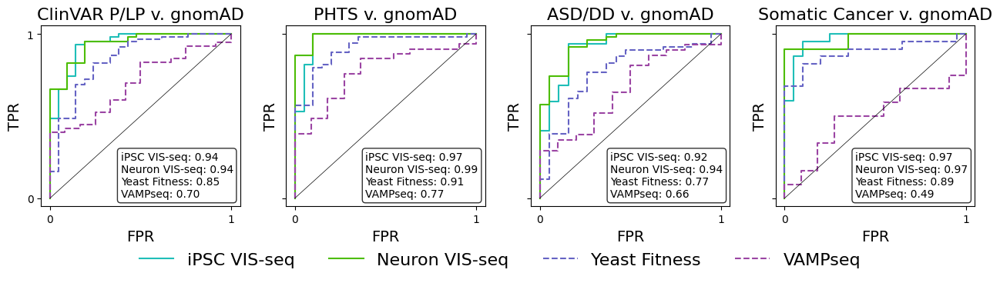

In [67]:
# Plot ROC curves for our data vs prior scans
# 1) Read in / assume you already have these:
#    abundance_HEK_data     # cols: ['variant','score_total']
#    activity_yeast_data    # cols: ['Variant (one letter)','Cum_score']
#    variant_anno           # cols: ['Variant','PHTS','ASD/DD','gnomAD','Somatic Cancer']
#    df_pca_iPSC            # cols: ['PC1'..'PC25','Variant',...]

# 1) define landmark features
landmark_features = [
    'Intensity_MeanIntensity_CH1',
    'Intensity_MeanIntensity_CH3_Corrected',
    'Correlation_Correlation_CH0_CH1'   
]

# 2) Rename and merge abundance & activity, leaving NaNs where missing
abundance_df = abundance_HEK_data.rename(
    columns={'variant':'Variant','score_total':'Abundance'}
)
activity_df = activity_yeast_data.rename(
    columns={'Variant (one letter)':'Variant','Cum_score':'Activity'}
)
prior_maps = pd.merge(
    abundance_df[['Variant','Abundance']],
    activity_df[['Variant','Activity']],
    on='Variant',
    how='outer'        # keep rows even if one score is missing
)

# 3) Merge annotations + PCA dims + these new features
variant_anno = \
    df_AM_anno[['Variant','PHTS','ASD/DD','Somatic\nCancer','gnomAD']]
df = (
    variant_anno
    .merge(df_profiles_merged[['Variant','Variant_Class','UMAP1 iPSC','UMAP2 iPSC','UMAP1 neuron','UMAP2 neuron']],
           on='Variant', how='inner')
    .merge(variant_medians_merged[['Variant']+\
               [l+'_iPSC' for l in landmark_features]+[l+'_neuron' for l in landmark_features]],
           on='Variant', how='inner')
    .merge(prior_maps, on='Variant', how='left')
    .merge(clinvar_variants_annotated_PTENT3_splicefilt[['Variant','Clinvar label']], 
           on='Variant', how='left')
    .merge(roc_auc_pten_ipsc,   on='Variant', how='inner')
    .merge(roc_auc_pten_neuron, on='Variant', how='inner')
)

# 4) Create ClinVar pos/neg indicators
df['ClinVar_pos'] = df['Clinvar label'].isin(['P','LP'])
df['ClinVar_neg'] = df['gnomAD'] | df['Clinvar label'].isin(['LB','B'])

# 5) Define features, and tasks
feat_dict = {
    'AUC ROC iPSC'   : 'iPSC VIS-seq',
    'AUC ROC neuron' : 'Neuron VIS-seq',
    'Activity'       : 'Yeast Fitness',
    'Abundance'      : 'VAMPseq',
}
tasks = [
    {'title':'ClinVAR P/LP',   'pos':'ClinVar_pos',     'neg':'ClinVar_neg'},
    {'title':'PHTS',           'pos':'PHTS',            'neg':'gnomAD'},
    {'title':'ASD/DD',         'pos':'ASD/DD',          'neg':'gnomAD'},
    {'title':'Somatic Cancer', 'pos':'Somatic\nCancer', 'neg':'gnomAD'},
]
feat_signs = {
    'AUC ROC iPSC':1,
    'AUC ROC neuron':1,
    'Activity':-1,
    'Abundance':-1,
}
linestyle_dict = {
    'AUC ROC iPSC':'-',
    'AUC ROC neuron':'-',
    'Activity':'--',
    'Abundance':'--',
}
assay_cp = {
    'iPSC VIS-seq'   : '#1fbeb8',
    'Neuron VIS-seq' : '#4dbd05',
    'Yeast Fitness'  : '#6563c4',
    'VAMPseq'        : '#9b45a3'
}

# 6) Plotting all panels
aucs_allassays = {}
fig, axes = plt.subplots(1, len(tasks), figsize=(3*len(tasks)+1, 3.75), squeeze=False, sharey=True)
for ax, task in zip(axes[0], tasks):
    pos, neg, title = task['pos'], task['neg'], task['title']
    base = df[df[pos] | df[neg]].copy()
    y    = base[pos].astype(int).values # breaking ties in favor of path

    # Single features
    aucs_s = {}
    aucs_f = {}
    for feat in feat_dict.keys():
        sf = base.dropna(subset=[feat])
        y_sf = sf[pos].astype(int)
        fpr_sf, tpr_sf, _ = roc_curve(y_sf, feat_signs[feat]*sf[[feat]])
        aucs_s[feat] = auc(fpr_sf, tpr_sf)
        aucs_f[feat_dict[feat]] = aucs_s[feat]
        ax.plot(fpr_sf, tpr_sf, linestyle=linestyle_dict[feat], label=feat_dict[feat], color=assay_cp[feat_dict[feat]])

    # Reference line and ticks
    ax.plot([0,1],[0,1],'k-', linewidth=0.5)
    ax.set_title(title + ' v. gnomAD', fontsize=16)
    ax.set_xlabel('FPR', fontsize=14)
    ax.set_ylabel('TPR', fontsize=14)
    ax.set_xticks([0,1])
    ax.set_yticks([0,1])

    # AUC annotation
    lines = [f"{feat_dict[f]}: {aucs_s[f]:.2f}" for f in feat_dict.keys()]
    ax.text(0.4, 0.05, "\n".join(lines),
            transform=ax.transAxes, fontsize=10,
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    # Save AUC
    aucs_allassays[task['title']] = aucs_f

# 7) Shared legend
handles, labels = [], []
for ax in axes.flat:
    h, l = ax.get_legend_handles_labels()
    for hh, ll in zip(h, l):
        if ll not in labels:
            labels.append(ll); handles.append(hh)
fig.legend(handles, labels, loc='lower center', ncol=len(labels), frameon=False, fontsize=16)

plt.tight_layout(rect=[0, 0.1, 1, 1])
plt.show()
fig.savefig('./consensus_plots/PTENT3.ROCcurves.includingAUCROC.AMvariants.052725.pdf', dpi=600)


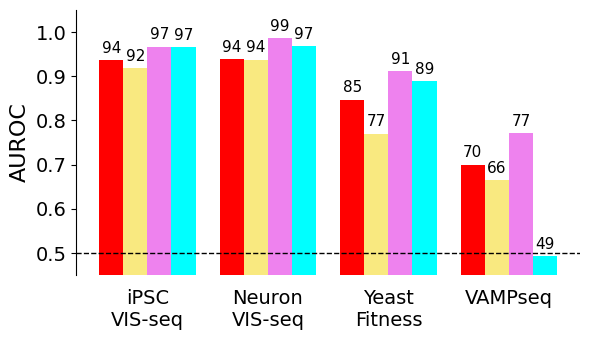

In [68]:
# Make bar chart showing AUC values
# 1) Convert to df
aucs_allassays_df = pd.DataFrame(aucs_allassays)
disease_palette = {
    'ClinVAR P/LP'  : 'red',
    'ASD/DD'        : category_palette['All\nASD/DD'],
    'PHTS'          : category_palette['All\nPHTS'],
    'Somatic Cancer': category_palette['All\nSomatic\nCancer']
}

# 2) Plot setup
bar_width = 0.2
x = np.arange(len(aucs_allassays_df.index))  # one x-position per assay

fig, ax = plt.subplots(figsize=(6,3.5))

# 3) Draw one bar per category, offset horizontally
for i, col in enumerate(disease_palette.keys()):
    ax.bar(
        x + i * bar_width, 
        aucs_allassays_df[col], 
        width=bar_width, 
        label=col,
        color=disease_palette[col]
    )

# 4) Annotate each bar with its AUC value
for i, col in enumerate(disease_palette.keys()):
    for j, val in enumerate(aucs_allassays_df[col]):
        ax.text(
            x[j] + i * bar_width,
            val + 0.01,             # small vertical offset
            f"{val*100:.0f}", 
            ha="center",
            va="bottom",
            fontsize=11
        )

# 5) Final formatting
# Center the x‐ticks under the grouped bars
ax.set_xticks(x + bar_width * (len(aucs_allassays_df.columns) - 1) / 2)
ax.spines[["top", "right", "bottom"]].set_visible(False)
ax.set_xticklabels([lbl.replace(" ", "\n") for lbl in aucs_allassays_df.index], fontsize=14)
ax.set_ylim(0.45, 1.05)  # leave a little headroom for labels
ax.set_yticklabels(labels=ax.get_yticklabels(), fontsize=14)
ax.tick_params(axis="x", size=0, pad=10)
ax.set_ylabel("AUROC", fontsize=16)
ax.axhline(y=0.5, xmin=0, xmax=1, linewidth=1, color='black', linestyle='--')

# 6) Plot
plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/PTENT3.1dpredictors.AMdiseaseclasses.060425.pdf')


In [69]:
# Load meta-analysis merged p-values
df_KSpvalues_iPSC = \
    pd.read_csv('./consensus_features/PTENT3.iPSC.merged_KSpvalues.011624.csv')
df_KSpvalues_iPSC.index = df_KSpvalues_iPSC['Variant']
df_KSpvalues_iPSC.drop(columns='Variant',inplace=True)
df_KSpvalues_neuron = \
    pd.read_csv('./consensus_features/PTENT3.neuron.merged_KSpvalues.011624.csv')
df_KSpvalues_neuron.index = df_KSpvalues_neuron['Variant']
df_KSpvalues_neuron.drop(columns='Variant',inplace=True)
df_KSpvalues_merged = \
    pd.read_csv('./consensus_features/PTENT3.total.merged_KSpvalues.011624.csv')
df_KSpvalues_merged.index = df_KSpvalues_merged['Variant']
df_KSpvalues_merged.drop(columns='Variant',inplace=True)


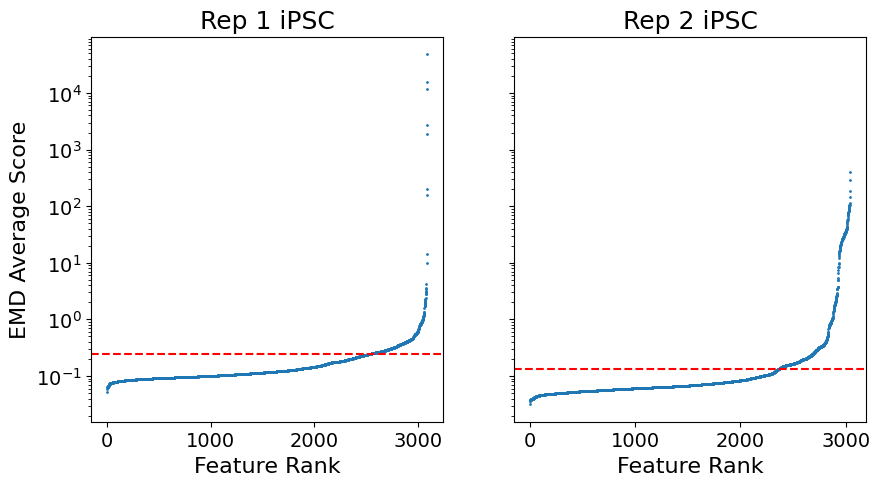

In [70]:
# Look at reproducibility plot of EMD - reps 1 and 2
# remove non-reproducible features
df_WTemd_rep2 = pd.read_csv('../PTEN_iPSC_T3_pycytominer_pipelinev2_122224/R2_KStest_bycell/results/PTENT3R2_WT_EMDreplicates.csv')
df_WTemd_rep2.drop(columns='Unnamed: 0',inplace=True)
df_WTemd_rep1 = pd.read_csv('../PTEN_iPSC_T3_pycytominer_pipelinev2_122224/R1_KStest_bycell/results/PTENT3R1_WT_EMDreplicates.csv')
df_WTemd_rep1.drop(columns='Unnamed: 0',inplace=True)

# Plot and filter by replicate separately
df_WTemd_rep1_avg = df_WTemd_rep1.mean(axis=0)
df_WTemd_rep1_avg_sorted = df_WTemd_rep1_avg.sort_values(ascending=True)
emd_score_WT_Q3_rep1 = np.percentile(df_WTemd_rep1_avg_sorted,75)
emd_score_WT_Q1_rep1 = np.percentile(df_WTemd_rep1_avg_sorted,25)
emd_score_WT_IQR_rep1 = emd_score_WT_Q3_rep1 - emd_score_WT_Q1_rep1
emd_score_WT_thresh_rep1 = 1.5*emd_score_WT_IQR_rep1 + emd_score_WT_Q1_rep1 # 1.5 x IQR plus Q1

df_WTemd_rep2_avg = df_WTemd_rep2.mean(axis=0)
df_WTemd_rep2_avg_sorted = df_WTemd_rep2_avg.sort_values(ascending=True)
emd_score_WT_Q3_rep2 = np.percentile(df_WTemd_rep2_avg_sorted,75)
emd_score_WT_Q1_rep2 = np.percentile(df_WTemd_rep2_avg_sorted,25)
emd_score_WT_IQR_rep2 = emd_score_WT_Q3_rep2 - emd_score_WT_Q1_rep2
emd_score_WT_thresh_rep2 = 1.5*emd_score_WT_IQR_rep2 + emd_score_WT_Q1_rep2 # 1.5 x IQR plus Q1

fig,axs=plt.subplots(ncols=2, figsize=(10,5), sharey=True)
axs[0].scatter(list(range(1,len(df_WTemd_rep1_avg_sorted.index)+1)),
            df_WTemd_rep1_avg_sorted,
            s=1)
axs[0].axhline(y=emd_score_WT_thresh_rep1, color='r', linestyle='--')
axs[1].scatter(list(range(1,len(df_WTemd_rep2_avg_sorted.index)+1)),
            df_WTemd_rep2_avg_sorted,
            s=1)
axs[1].axhline(y=emd_score_WT_thresh_rep2, color='r', linestyle='--')

axs[0].set_yscale('log')
axs[1].set_yscale('log')

axs[0].set_ylabel('EMD Average Score', fontsize=16)

axs[0].set_xlabel('Feature Rank', fontsize=16)
axs[1].set_xlabel('Feature Rank', fontsize=16)

axs[0].set_title('Rep 1 iPSC', fontsize=18)
axs[1].set_title('Rep 2 iPSC', fontsize=18)

axs[0].tick_params(axis='both',labelsize=14)
axs[1].tick_params(axis='both',labelsize=14)

plt.show()
fig.savefig('./consensus_plots/EMD_reproducibility.iPSC.byreplicate_011624.pdf', dpi=600)

features_reproducible_iPSC = \
    (df_WTemd_rep1_avg<=emd_score_WT_thresh_rep1) & (df_WTemd_rep2_avg<=emd_score_WT_thresh_rep2)
features_reproducible_iPSC = features_reproducible_iPSC.index[features_reproducible_iPSC]


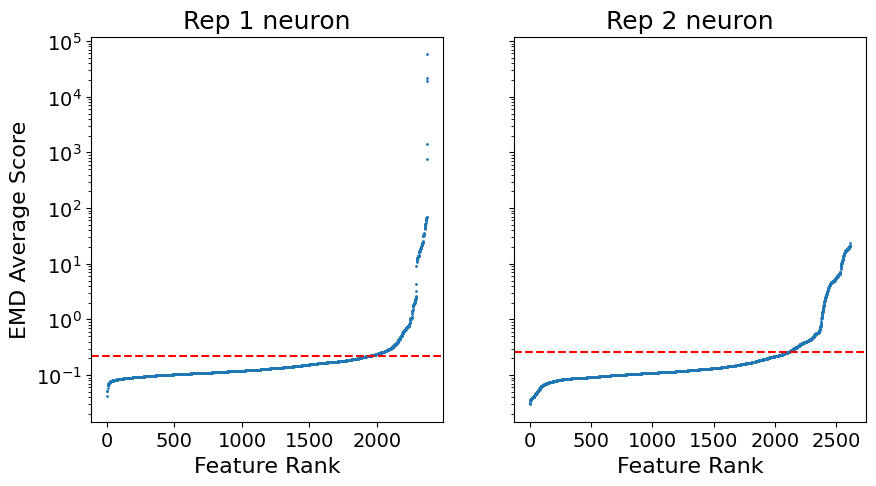

In [71]:
# Look at reproducibility plot of EMD - reps 1 and 2
# remove non-reproducible features
df_WTemd_rep2 = pd.read_csv('./R2_KStest_bycell/results/PTENT3R2_WT_EMDreplicates.csv')
df_WTemd_rep2.drop(columns='Unnamed: 0',inplace=True)
df_WTemd_rep1 = pd.read_csv('./R1_KStest_bycell/results/PTENT3R1_WT_EMDreplicates.csv')
df_WTemd_rep1.drop(columns='Unnamed: 0',inplace=True)

# Plot and filter by replicate separately
df_WTemd_rep1_avg = df_WTemd_rep1.mean(axis=0)
df_WTemd_rep1_avg_sorted = df_WTemd_rep1_avg.sort_values(ascending=True)
emd_score_WT_Q3_rep1 = np.percentile(df_WTemd_rep1_avg_sorted,75)
emd_score_WT_Q1_rep1 = np.percentile(df_WTemd_rep1_avg_sorted,25)
emd_score_WT_IQR_rep1 = emd_score_WT_Q3_rep1 - emd_score_WT_Q1_rep1
emd_score_WT_thresh_rep1 = 1.5*emd_score_WT_IQR_rep1 + emd_score_WT_Q1_rep1 # 1.5 x IQR plus Q1

df_WTemd_rep2_avg = df_WTemd_rep2.mean(axis=0)
df_WTemd_rep2_avg_sorted = df_WTemd_rep2_avg.sort_values(ascending=True)
emd_score_WT_Q3_rep2 = np.percentile(df_WTemd_rep2_avg_sorted,75)
emd_score_WT_Q1_rep2 = np.percentile(df_WTemd_rep2_avg_sorted,25)
emd_score_WT_IQR_rep2 = emd_score_WT_Q3_rep2 - emd_score_WT_Q1_rep2
emd_score_WT_thresh_rep2 = 1.5*emd_score_WT_IQR_rep2 + emd_score_WT_Q1_rep2 # 1.5 x IQR plus Q1

fig,axs=plt.subplots(ncols=2, figsize=(10,5), sharey=True)
axs[0].scatter(list(range(1,len(df_WTemd_rep1_avg_sorted.index)+1)),
            df_WTemd_rep1_avg_sorted,
            s=1)
axs[0].axhline(y=emd_score_WT_thresh_rep1, color='r', linestyle='--')
axs[1].scatter(list(range(1,len(df_WTemd_rep2_avg_sorted.index)+1)),
            df_WTemd_rep2_avg_sorted,
            s=1)
axs[1].axhline(y=emd_score_WT_thresh_rep2, color='r', linestyle='--')

axs[0].set_yscale('log')
axs[1].set_yscale('log')

axs[0].set_ylabel('EMD Average Score', fontsize=16)

axs[0].set_xlabel('Feature Rank', fontsize=16)
axs[1].set_xlabel('Feature Rank', fontsize=16)

axs[0].set_title('Rep 1 neuron', fontsize=18)
axs[1].set_title('Rep 2 neuron', fontsize=18)

axs[0].tick_params(axis='both',labelsize=14)
axs[1].tick_params(axis='both',labelsize=14)

plt.show()
fig.savefig('./consensus_plots/EMD_reproducibility.neuron.byreplicate_011624.pdf', dpi=600)

features_reproducible_neuron = \
    (df_WTemd_rep1_avg<=emd_score_WT_thresh_rep1) & (df_WTemd_rep2_avg<=emd_score_WT_thresh_rep2)
features_reproducible_neuron = features_reproducible_neuron.index[features_reproducible_neuron]


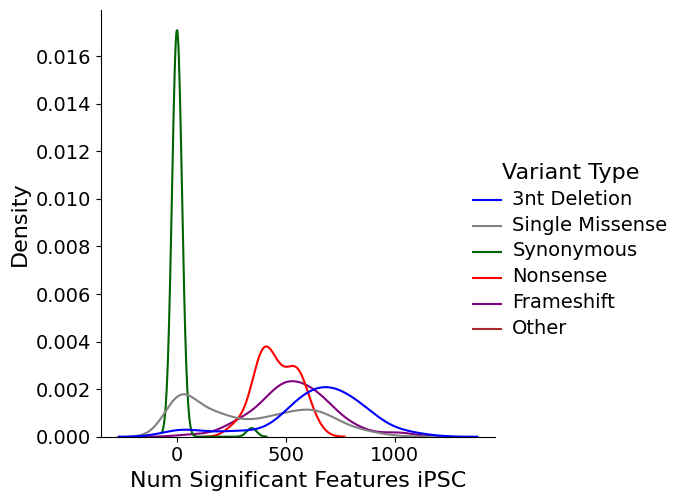

In [72]:
# Make plot of number of significant features using p-values computed on _CELLS_ aggregated data, using KS test
# Filter for reproducible features
df_KSpvalues_iPSC_filt = \
    df_KSpvalues_iPSC[features_reproducible_iPSC]

# Remove features which are significantly different in >90% of variants - often discrete features
upper_sig_thresh = 0.9
features_overly_sig_toremove = \
    ~((df_KSpvalues_iPSC_filt <= 0.01).sum() \
          > upper_sig_thresh*len(df_KSpvalues_iPSC_filt)).values
df_KSpvalues_iPSC_filt = \
    df_KSpvalues_iPSC_filt.loc[:, features_overly_sig_toremove]

# Set Bonferroni FDR at q<=10^-3
p_value_thresh = 0.001/(np.prod(df_KSpvalues_iPSC_filt.shape)) # BONFERRONI FDR

variant_bycell_numsigfeatures_iPSC = \
    (df_KSpvalues_iPSC_filt <= p_value_thresh).sum(axis=1).reset_index()
variant_bycell_numsigfeatures_iPSC = \
    variant_bycell_numsigfeatures_iPSC[variant_bycell_numsigfeatures_iPSC['Variant']!='sig_gene_count']
variant_bycell_numsigfeatures_iPSC.rename({0:'Num Significant Features'}, axis=1, inplace=True)
variant_bycell_numsigfeatures_iPSC['Variant_Class'] = \
    pd.Categorical(variant_bycell_numsigfeatures_iPSC['Variant'].astype(str).apply(variant_classification),
                   categories=mutation_types, ordered=True)

# Num Significant Figures Plot
variant_type_palette_toplot = variant_type_palette.copy()
variant_type_palette_toplot['WT']='black'
num_sig_features_plot = \
    sns.displot(data=variant_bycell_numsigfeatures_iPSC,
                x="Num Significant Features", 
                hue="Variant_Class",
                kind='kde',
                palette=variant_type_palette_toplot,
                legend=True,
                common_norm=False)
plt.xlabel('Num Significant Features iPSC', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.tick_params(axis='both',labelsize=14)

# Access the legend object from the FacetGrid
legend = num_sig_features_plot._legend

# Change the legend title font size
legend.set_title("Variant Type", prop={'size': 16})

# Change the legend labels font size
plt.setp(legend.get_texts(), fontsize=14)

num_sig_features_plot.savefig('./consensus_plots/PTENT3.iPSC.KStest_numsigfeatures_byvariantclass_011624.pdf', dpi=600)
plt.show()


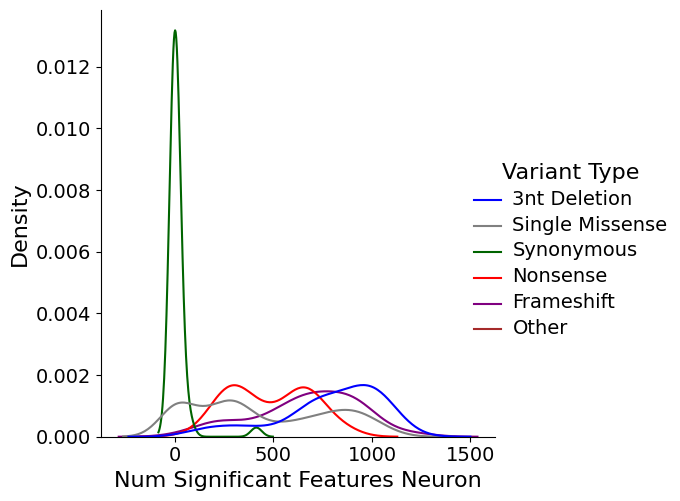

In [73]:
# Make plot of number of significant features using p-values computed on _CELLS_ aggregated data, using KS test
# Filter for reproducible features
df_KSpvalues_neuron_filt = \
    df_KSpvalues_neuron[features_reproducible_neuron]

# Remove features which are significantly different in >90% of variants - often discrete features
upper_sig_thresh = 0.9
features_overly_sig_toremove = \
    ~((df_KSpvalues_neuron_filt <= 0.01).sum() \
          > upper_sig_thresh*len(df_KSpvalues_neuron_filt)).values
df_KSpvalues_neuron_filt = \
    df_KSpvalues_neuron_filt.loc[:, features_overly_sig_toremove]

# Set Bonferroni FDR at q<=10^-3
p_value_thresh = 0.001/(np.prod(df_KSpvalues_neuron_filt.shape)) # BONFERRONI FDR

variant_bycell_numsigfeatures_neuron = \
    (df_KSpvalues_neuron_filt <= p_value_thresh).sum(axis=1).reset_index()
variant_bycell_numsigfeatures_neuron = \
    variant_bycell_numsigfeatures_neuron[variant_bycell_numsigfeatures_neuron['Variant']!='sig_gene_count']
variant_bycell_numsigfeatures_neuron.rename({0:'Num Significant Features'}, axis=1, inplace=True)
variant_bycell_numsigfeatures_neuron['Variant_Class'] = \
    pd.Categorical(variant_bycell_numsigfeatures_neuron['Variant'].astype(str).apply(variant_classification),
                   categories=mutation_types, ordered=True)

# Num Sig Features Plot
num_sig_features_plot = \
    sns.displot(data=variant_bycell_numsigfeatures_neuron,
                 x="Num Significant Features", 
                 hue="Variant_Class",
                 kind='kde',
                 palette=variant_type_palette_toplot,
                 legend=True,
                 common_norm=False)
plt.xlabel('Num Significant Features Neuron', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.tick_params(axis='both',labelsize=14)

# Access the legend object from the FacetGrid
legend = num_sig_features_plot._legend

# Change the legend title font size
legend.set_title("Variant Type", prop={'size': 16})

# Change the legend labels font size
plt.setp(legend.get_texts(), fontsize=14)

num_sig_features_plot.savefig('./consensus_plots/PTENT3.neuron.KStest_numsigfeatures_byvariantclass_011624.pdf', dpi=600)
plt.show()


In [74]:
# Get highly significant features
# iPSC
n_variants_thresh_highlysig = 25
eps=10**(-20)
variant_feature_logp_df = \
    -np.log10(df_KSpvalues_iPSC_filt+eps)
highly_sig_features_iPSC = \
    (df_KSpvalues_iPSC_filt <= p_value_thresh).sum(axis=0) >= n_variants_thresh_highlysig
highly_sig_features_iPSC = \
    highly_sig_features_iPSC[highly_sig_features_iPSC].index
variant_feature_logp_df_filtered = \
    variant_feature_logp_df.loc[:,highly_sig_features_iPSC]

# neuron
n_variants_thresh_highlysig = 25
eps=10**(-20)
variant_feature_logp_df = \
    -np.log10(df_KSpvalues_neuron_filt+eps)
highly_sig_features_neuron = \
    (df_KSpvalues_neuron_filt <= p_value_thresh).sum(axis=0) >= n_variants_thresh_highlysig
highly_sig_features_neuron = \
    highly_sig_features_neuron[highly_sig_features_neuron].index
variant_feature_logp_df_filtered = \
    variant_feature_logp_df.loc[:,highly_sig_features_neuron]


In [75]:
# Look at hit features
# Function to classify features from various compartments
# Define autopct function to hide labels below 1%
def autopct_hide_small(pct):
    return f'{pct:.1f}%' if pct >= 3 else ''

# Classify the features with dyes
channel_to_dye_dict_iPSC = {
    'CH0': 'DAPI',
    'CH1': 'GFP-PTEN',
    'CH2': 'Phalloidin',
    'CH3': 'pAKT',
    'CH4': 'ConA'
}
channel_to_dye_dict_neuron = {
    'CH0': 'DAPI',
    'CH1': 'GFP-PTEN',
    'CH2': 'MAP2',
    'CH3': 'pAKT',
    'CH4': 'ConA'
}
channel_order_ipsc   = ['DAPI', 'GFP-PTEN', 'Phalloidin', 'pAKT', 'ConA', 'None', 'Multiple']
channel_order_neuron = ['DAPI', 'GFP-PTEN', 'MAP2',       'pAKT', 'ConA', 'None', 'Multiple']

# Set palettes
channel_palette_ipsc = {
    'DAPI': 'darkblue',
    'GFP-PTEN': 'green',
    'None': 'grey',
    'Phalloidin': 'orange',
    'pAKT': 'red',
    'ConA': 'darkred',
    'Multiple': 'purple',
}
channel_palette_neuron = {
    'DAPI': 'darkblue',
    'GFP-PTEN': 'green',
    'None': 'grey',
    'MAP2': 'orange',
    'pAKT': 'red',
    'ConA': 'darkred',
    'Multiple': 'purple',
}
compartment_palette = {
    'Whole Cell': 'olivedrab',
    'Cytoplasm': 'peru',
    'Nuclei': 'blue',
}
compartment_order = ['Nuclei', 'Cytoplasm', 'Whole Cell']  

# iPSC
classified_features = \
    classify_features_with_dye(highly_sig_features_iPSC, 
                               channel_to_dye=channel_to_dye_dict_iPSC)
highly_sig_feature_df_ipsc = pd.DataFrame(classified_features)
highly_sig_feature_df_ipsc['Imaging Channel'] = \
    highly_sig_feature_df_ipsc['associated_dye'].map(lambda x: 'Multiple' if ',' in x else 'None' if x=='' else x)

# Count the occurrences of each compartment
channel_counts_ipsc = highly_sig_feature_df_ipsc['Imaging Channel'].value_counts()

# Classify the features with dyes
classified_features = \
    classify_compartment(highly_sig_features_iPSC)
highly_sig_feature_df_ipsc['Compartment'] = classified_features

# Count the occurrences of each compartment
compartment_counts_ipsc = highly_sig_feature_df_ipsc['Compartment'].value_counts()

# Neuron
classified_features = \
    classify_features_with_dye(highly_sig_features_neuron, 
                               channel_to_dye=channel_to_dye_dict_neuron)
highly_sig_feature_df_neuron = pd.DataFrame(classified_features)
highly_sig_feature_df_neuron['Imaging Channel'] = \
    highly_sig_feature_df_neuron['associated_dye'].map(lambda x: 'Multiple' if ',' in x else 'None' if x=='' else x)

# Count the occurrences of each compartment
channel_counts_neuron = highly_sig_feature_df_neuron['Imaging Channel'].value_counts()

# Classify the features with dyes
classified_features = \
    classify_compartment(highly_sig_features_neuron)
highly_sig_feature_df_neuron['Compartment'] = classified_features

# Count the occurrences of each compartment
compartment_counts_neuron = highly_sig_feature_df_neuron['Compartment'].value_counts()


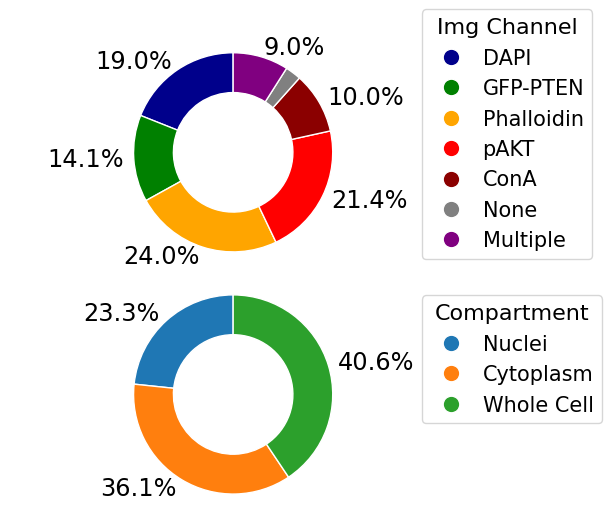

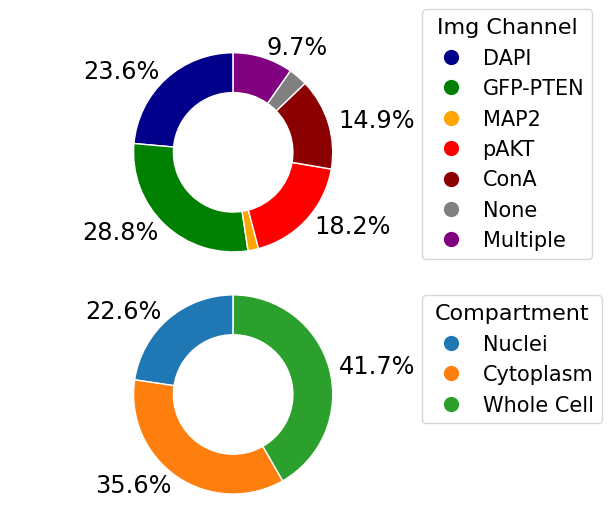

In [76]:
# Plot donuts
for cl, channel_counts, compartment_counts, channel_palette, channel_order\
    in zip(['iPSC','neuron'],
           [channel_counts_ipsc,     channel_counts_neuron],
           [compartment_counts_ipsc, compartment_counts_neuron],
           [channel_palette_ipsc,    channel_palette_neuron],
           [channel_order_ipsc,      channel_order_neuron]):

    # Make lists
    vals1 = channel_counts.reindex(channel_order).fillna(0)
    vals2 = compartment_counts.reindex(compartment_order).fillna(0)
    
    # compute labels
    pcts1 = vals1.values / vals1.sum() * 100
    labels1 = [f'{p:.1f}%' if p >= 5 else '' for p in pcts1]
    pcts2 = vals2.values / vals2.sum() * 100
    labels2 = [f'{p:.1f}%' if p >= 5 else '' for p in pcts2]
    
    # shared styling
    fig, axs = plt.subplots(2, 1, figsize=(6,5), constrained_layout=True)
    wedge_props = {'width': 0.4, 'edgecolor': 'white'}
    
    # --- Top donut: Imaging Channel ---
    colors1 = [channel_palette[k] for k in vals1.index]
    wedges1, texts1 = axs[0].pie(
        vals1,
        labels=labels1,
        labeldistance=1.1,
        startangle=90,
        wedgeprops=wedge_props,
        textprops=dict(color='black', fontsize='xx-large'),
        colors=colors1
    )
    axs[0].axis('equal')
    # build dot‐style proxies
    dot_handles1 = [
        mlines.Line2D([0], [0],
               marker='o',
               color='w',                # no connecting line
               markerfacecolor=col,
               markersize=12,
               label=lab)
        for lab, col in zip(vals1.index, colors1)
    ]
    axs[0].legend(
        handles=dot_handles1,
        title='Img Channel',
        loc='upper left',
        bbox_to_anchor=(0.9,1.2),
        fontsize=15,
        title_fontsize=16,
        handletextpad=0.5,   # space between dot and text
    )
    # --- Bottom donut: Compartment ---
    # choose or define your own color palette here:
    colors2 = plt.cm.tab10.colors[:len(vals2)]
    wedges2, texts2 = axs[1].pie(
        vals2,
        labels=labels2,
        labeldistance=1.1,
        startangle=90,
        wedgeprops=wedge_props,
        textprops=dict(color='black', fontsize='xx-large'),
        colors=colors2
    )
    axs[1].axis('equal')
    dot_handles2 = [
        mlines.Line2D([0], [0],
               marker='o',
               color='w',
               markerfacecolor=col,
               markersize=12,
               label=lab)
        for lab, col in zip(vals2.index, colors2)
    ]
    axs[1].legend(
        handles=dot_handles2,
        title='Compartment',
        loc='upper left',
        bbox_to_anchor=(0.9,1),
        fontsize=15,
        title_fontsize=16,
        handletextpad=0.5,
    )
    
    plt.show()
    fig.savefig(f'./consensus_plots/PTENT3.{cl}.donutchart.KSbonferronicorrected.hitfeatures.052925.pdf')


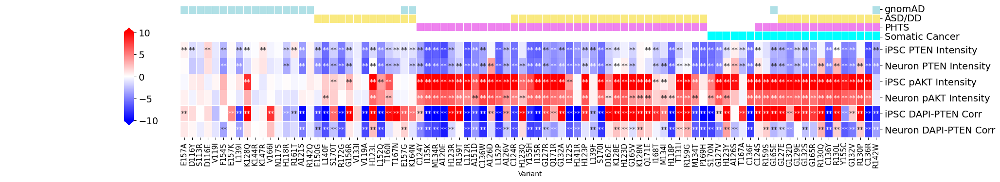

In [77]:
# Make heatmap of clinical variants by landmark feature effects
# 1) start from your annotation table
df_AM_anno_clean = df_AM_anno.dropna(subset=['Variant']).copy()
df_AM_anno_clean = df_AM_anno_clean.rename(columns={'Somatic\nCancer':'Somatic Cancer'})

# 2) remove rows where ALL four flags are False
flags = ['PHTS','ASD/DD','gnomAD','Somatic Cancer']
mask_any = df_AM_anno_clean[flags].any(axis=1)
df_AM_anno_clean = df_AM_anno_clean.loc[mask_any, :]
df_AM_anno_clean['sort_val']=\
    df_AM_anno_clean\
        .apply(lambda row: row['gnomAD']+2*row['ASD/DD']+4*row['PHTS']+8*row['Somatic Cancer'],axis=1)
df_AM_anno_clean = \
    df_AM_anno_clean.sort_values(by='sort_val', ascending=True)

# 3) final variant list (in the order they remain)
variants = df_AM_anno_clean['Variant'].tolist()

# 4) landmark features
landmark_features = \
    ['Intensity_MeanIntensity_CH1',
     'Intensity_MeanIntensity_CH3_Corrected',
     'Correlation_Correlation_CH0_CH1']
landmark_features = \
    sum([[l+'_iPSC',l+'_neuron'] for l in landmark_features],[])
feature_rename = \
    {'Intensity_MeanIntensity_CH1_iPSC':'iPSC PTEN Intensity',
     'Intensity_MeanIntensity_CH1_neuron':'Neuron PTEN Intensity',
     'Intensity_MeanIntensity_CH3_Corrected_iPSC':'iPSC pAKT Intensity',
     'Intensity_MeanIntensity_CH3_Corrected_neuron':'Neuron pAKT Intensity',
     'Correlation_Correlation_CH0_CH1_iPSC':'iPSC DAPI-PTEN Corr',
     'Correlation_Correlation_CH0_CH1_neuron':'Neuron DAPI-PTEN Corr'}

# 5) subset & rename your heatmap data
heat_df = (
    variant_medians_merged
      .set_index('Variant')
      .loc[variants, landmark_features]
      .rename(columns=feature_rename)
)

# 6) build the significance mask
p_value_thresh_tot = 10**(-2)/(np.prod(df_KSpvalues_merged.shape))
mask_df = (
    df_KSpvalues_merged
      .loc[variants, landmark_features]
      .le(p_value_thresh_tot)
      .rename(columns=feature_rename)
)

# 7) prepare the 4-row color stripe
disease_list = ['gnomAD','ASD/DD','PHTS','Somatic Cancer']

col_colors = [
    df_AM_anno_clean.set_index('Variant')[d]
       .reindex(variants)
       .map(lambda b: category_palette['All\n'+d.replace(' ','\n')] if d != 'gnomAD' and b\
                          else category_palette[d] if d == 'gnomAD' and b\
                          else 'white')
    for d in disease_list
]

# 8) draw the clustermap
g = sns.clustermap(
    heat_df.T,
    cmap='bwr',
    annot=mask_df.replace({True:'**', False:''}).T,
    annot_kws={'fontsize':10,'ha':'center','va':'center'},
    row_cluster=False, col_cluster=False,
    yticklabels=True, xticklabels=True,
    col_colors=col_colors,
    fmt='', linewidths=.5,
    vmin=-10, vmax=10, center=0,
    cbar_kws={'extend':'both','shrink':2,'pad':0.001},
    cbar_pos=(0.13, .3, 0.01, 0.5),
    figsize=(20,4)
)

# 9) tweak
#set the facecolor of the plot to grey where NaNs are present
# Get the heatmap axis
ax = g.ax_heatmap

# Set the facecolor for NaNs
ax.patch.set_facecolor('grey')

# remove dendrogram
g.ax_col_dendrogram.set_visible(False)

# After creating the cluster map `g`
pos = g.ax_col_colors.get_position()

# Set ticks
# Set ticks on the right side
g.ax_col_colors.yaxis.set_ticks_position('right')
g.ax_col_colors.yaxis.set_label_position('right')

# Hide the x-axis and spines if not needed
g.ax_col_colors.xaxis.set_visible(False)
g.ax_col_colors.spines["top"].set_visible(False)
g.ax_col_colors.spines["bottom"].set_visible(False)
g.ax_col_colors.spines["left"].set_visible(False)
g.ax_col_colors.spines["right"].set_visible(False)
g.ax_col_colors.set_yticks(
    [0.4+1.1*x for x in range(len(disease_list)
                               #+1
                            )
    ]
)
g.ax_col_colors.set_yticklabels(
    disease_list 
    #+ ["Num Sig Features"]
    , 
    rotation=0, ha='left', va='center',
    fontsize=14
)

# Fontsize for colorbar
g.ax_cbar.tick_params(labelsize=14)

# Make it 2 times taller and move it 0.01 units upwards
new_y0 = pos.y0 + 0.01     # shift upwards
new_height = pos.height * 2
g.ax_col_colors.set_position([pos.x0, new_y0, pos.width, new_height])

# Rotate the ytick labels if needed and set font size
plt.setp(ax.yaxis.get_majorticklabels(), rotation=0, fontsize=14)
plt.setp(ax.xaxis.get_majorticklabels(), rotation=90, fontsize=10.5)
plt.show()
g.savefig('./consensus_plots/PTENT3.combinedvariantheatmap.pvalue_disease_annotated.011625.pdf', dpi=600)


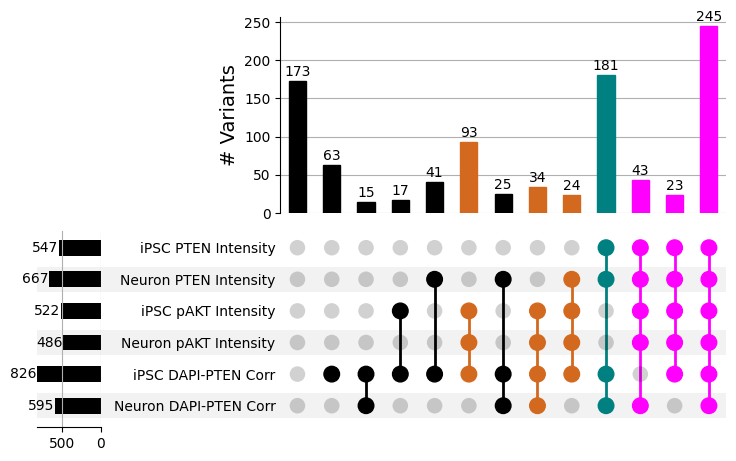

In [78]:
# Make a variant venn diagram for: abundance/activity/DAPI-PTEN correlation
# Get sets of significant variants that pass z-thresh and p-thresh
syn_z_cutoff = 2.5
def find_significant_variants(df_z, df_p, features, p_thresh, z_thresh):
    # Because df_p is indexed by Variant, we can reindex or simply locate:
    # Make sure df_z rows align to df_p index
    df_p_filt = df_p.loc[df_z["Variant"]]
    
    sets_dict = {}
    for f in features:
        # Condition: p < p_thresh and |median z| > z_thresh
        pass_mask = (
            (df_p_filt[f].values <= p_thresh) &
            (df_z[f].abs().values >= z_thresh)
        )
        # Collect the variants that pass
        passing_variants = df_p_filt[pass_mask].index
        sets_dict[f] = set(passing_variants)

    # get all missense set
    all_missense_set = set(df_z["Variant"])
    
    return sets_dict,all_missense_set
    
def sets_to_multiindex_series(all_variants, sets_dict, feature_ordering):
    """
    Convert a dictionary of sets {feature: set_of_variants} 
    plus a set of all variants into a multi-index Series for UpSetPlot.
    
    - all_variants: iterable of all Single Missense variants
    - sets_dict: {feature_name: set_of_variants_that_pass_that_feature}

    Returns:
    - A pd.Series with a multi-level boolean index (one level per feature),
      and values = count of how many variants fall into each True/False combination.
    """
    features = feature_ordering
    all_variants = sorted(all_variants)

    # 1) Build a boolean DataFrame
    df_bool = pd.DataFrame(False, index=all_variants, columns=features)
    for feat, varset in sets_dict.items():
        df_bool.loc[df_bool.index.intersection(varset), feat] = True

    # 2) Group by all columns to get counts of each combination
    #    This yields a multi-index (one level per column),
    #    with the aggregated values = how many rows (variants) in that combination.
    df_count = df_bool.groupby(features).size()

    return df_count

# set feature dataframes
landmark_features = \
    ['Intensity_MeanIntensity_CH1',
     'Intensity_MeanIntensity_CH3_Corrected',
     'Correlation_Correlation_CH0_CH1']
landmark_features = \
    sum([[l+'_iPSC',l+'_neuron'] for l in landmark_features],[])
feature_rename = \
    {'Intensity_MeanIntensity_CH1_iPSC':'iPSC PTEN Intensity',
     'Intensity_MeanIntensity_CH1_neuron':'Neuron PTEN Intensity',
     'Intensity_MeanIntensity_CH3_Corrected_iPSC':'iPSC pAKT Intensity',
     'Intensity_MeanIntensity_CH3_Corrected_neuron':'Neuron pAKT Intensity',
     'Correlation_Correlation_CH0_CH1_iPSC':'iPSC DAPI-PTEN Corr',
     'Correlation_Correlation_CH0_CH1_neuron':'Neuron DAPI-PTEN Corr'}

df_z_toplot = \
    variant_medians_merged[['Variant','Variant_Class'] + landmark_features]\
        .query('Variant_Class in ["Single Missense","3nt Deletion"]')\
        .query('Variant in @df_KSpvalues_merged.index')\
        .copy()
df_p_toplot = \
    df_KSpvalues_merged[landmark_features].copy()

# Rename columns
df_z_toplot.rename(columns=feature_rename, inplace=True)
df_p_toplot.rename(columns=feature_rename, inplace=True)

# Find significant variants
sig_sets,all_missense_set = \
    find_significant_variants(df_z_toplot, 
                              df_p_toplot, 
                              [feature_rename[f] for f in landmark_features], 
                              p_value_thresh_tot, 
                              syn_z_cutoff)

# Convert to Multi-Index set
df_count = sets_to_multiindex_series(all_missense_set, 
                                     sig_sets,
                                     feature_ordering=[feature_rename[f] for f in landmark_features])

# Pass that series to UpSet
pd.options.mode.copy_on_write = False # needed to fix upset plot, otherwise bug
upset_obj = UpSet(df_count,
                  sort_by='degree',
                  sort_categories_by='-input',
                  show_counts=True,
                  min_subset_size=15)
upset_obj.style_subsets(
    present=['iPSC PTEN Intensity','Neuron PTEN Intensity'], 
    facecolor="teal"
)
upset_obj.style_subsets(
    present=['iPSC pAKT Intensity','Neuron pAKT Intensity'], 
    facecolor="chocolate"
)
upset_obj.style_subsets(
    present=['iPSC PTEN Intensity','Neuron PTEN Intensity',
             'iPSC pAKT Intensity','Neuron pAKT Intensity'], 
    facecolor="fuchsia"
)

upset_obj.plot()
pd.options.mode.copy_on_write = True

plt.ylabel('# Variants', fontsize=14)
plt.savefig('./consensus_plots/PTENT3.upsetplot.iPSneuron.landmarkfeatures.011825.pdf')
plt.show()


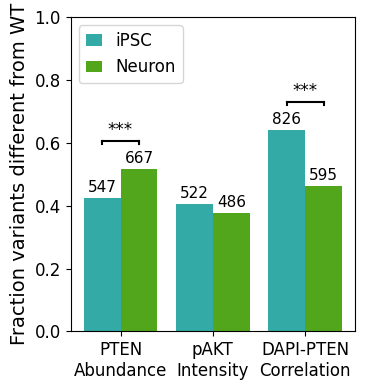

In [81]:
# Also plot fraction of variants with mislocalization 
# Now build a small list of dicts, one row per (category, celltype).
# ────────────────────────────────────────────────────────────────────────────────
# 1) Define the three features and the two cell types
# ────────────────────────────────────────────────────────────────────────────────

cell_types = ['iPSC', 'Neuron']
features   = ['PTEN Intensity', 'pAKT Intensity', 'DAPI-PTEN Corr']

# ────────────────────────────────────────────────────────────────────────────────
# 2) Build a small list of (Feature, CellType, CountSig, CountNon, Fraction) rows.
#    We use `len(variant_medians_merged)` as the denominator for each cell‐type.
# ────────────────────────────────────────────────────────────────────────────────

rows = []
total_variants = len(variant_medians_merged)
for feat in features:
    for cl in cell_types:
        key = f"{cl} {feat}"
        sig_count = len(sig_sets.get(key, set()))
        non_count = total_variants - sig_count
        fraction  = sig_count / total_variants if total_variants > 0 else 0.0

        rows.append({
            'Feature':  feat,
            'CellType': cl,
            'SigCount': sig_count,
            'NonCount': non_count,
            'Fraction': fraction
        })
plot_df = pd.DataFrame(rows)

# (Optional) If you want your bars in a specific feature‐order:
desired_order = ['PTEN Intensity', 'pAKT Intensity', 'DAPI-PTEN Corr']
plot_df['Feature'] = pd.Categorical(plot_df['Feature'],
                                    categories=desired_order,
                                    ordered=True)

# ────────────────────────────────────────────────────────────────────────────────
# 3) Draw a grouped bar‐plot of “fraction significant” (iPSC vs. Neuron)
# ────────────────────────────────────────────────────────────────────────────────

fig, ax = plt.subplots(figsize=(3.75,4))
sns.barplot(
    data=plot_df,
    x='Feature',
    y='Fraction',
    hue='CellType',
    palette={'iPSC': '#1fbeb8', 'Neuron': '#4dbd05'},
    ax=ax
)
plt.ylim(0, 1.0)
plt.ylabel('Fraction variants different from WT', fontsize=14)
plt.xticks(ticks=[0,1,2], 
           labels=['PTEN\nAbundance','pAKT\nIntensity','DAPI-PTEN\nCorrelation'],
           fontsize=12)
plt.xlabel('')
plt.yticks(fontsize=12)
plt.legend(loc='upper left', fontsize=12, handlelength=1)

# ────────────────────────────────────────────────────────────────────────────────
# 4) For each feature, run a 2×2 chi‐square test comparing 
#    [ significant vs. non‐significant ] in iPSC vs. Neuron
# ────────────────────────────────────────────────────────────────────────────────

chi2_results = []
for feat in features:
    sig_i = plot_df.query("Feature == @feat and CellType == 'iPSC'")['SigCount'].iloc[0]
    non_i = plot_df.query("Feature == @feat and CellType == 'iPSC'")['NonCount'].iloc[0]
    sig_n = plot_df.query("Feature == @feat and CellType == 'Neuron'")['SigCount'].iloc[0]
    non_n = plot_df.query("Feature == @feat and CellType == 'Neuron'")['NonCount'].iloc[0]

    contingency = [[sig_i, non_i],
                   [sig_n, non_n]]
    chi2, p, dof, expected = chi2_contingency(contingency)
    chi2_results.append({
        'Feature':   feat,
        'Chi2 Stat': chi2,
        'pval':      p,
        'dof':       dof
    })

    j = features.index(feat)  # integer index of this feature on the x-axis
    # Get the Fraction & SigCount for iPSC and Neuron:
    row_i = plot_df.query("Feature == @feat and CellType == 'iPSC'").iloc[0]
    row_n = plot_df.query("Feature == @feat and CellType == 'Neuron'").iloc[0]

    # x-coordinates of the two bars:
    x_iPSC   = j - (bar_width / 2)
    x_neuron = j + (bar_width / 2)

    # y‐coordinates (heights) of those bars:
    y_iPSC   = row_i['Fraction']
    y_neuron = row_n['Fraction']
    
    # Place text = SigCount above each bar:
    text_offset = 0.01
    ax.text(x_iPSC,
            y_iPSC + text_offset,
            str(row_i['SigCount']),
            ha='center',
            va='bottom',
            fontsize=11)

    ax.text(x_neuron,
            y_neuron + text_offset,
            str(row_n['SigCount']),
            ha='center',
            va='bottom',
            fontsize=11)

chi2_df = pd.DataFrame(chi2_results).set_index('Feature')

# ────────────────────────────────────────────────────────────────────────────────
# 5) For each Feature, if p < α, draw exactly one bracket connecting the iPSC bar
#    to the Neuron bar. This code assumes Seaborn has given each bar‐group a total
#    width of 0.8, split evenly between the two hue‐levels (so each bar is 0.4 wide).
# ────────────────────────────────────────────────────────────────────────────────

alpha      = 0.001
bar_width  = 0.4  # 0.8 total group width ÷ 2 hues
offset     = 0.08 # vertical offset so bracket sits above the taller bar
bracket_th = 0.01  # height of the little vertical ticks
linewidth  = 1.5

# 5a) Map each Feature → its integer x‐location (0, 1, 2, …)
feat_to_x = {feat: idx for idx, feat in enumerate(features)}

# 5b) Pre‐compute the taller “Fraction” per Feature (so we know how high to place bracket)
height_max = plot_df.groupby('Feature')['Fraction'].max()

# 5c) Loop over features, draw bracket if pval < alpha
for feat in features:
    pval = chi2_df.loc[feat, 'pval']
    if pval < alpha:
        i = feat_to_x[feat]

        # x‐centers of the two bars (iPSC vs Neuron)
        x_iPSC   = i - (bar_width / 2)
        x_neuron = i + (bar_width / 2)

        # find the top of the taller bar
        h = height_max.loc[feat]
        y_base = h + offset
        y_top  = y_base + bracket_th

        # Draw vertical ticks
        ax.plot([x_iPSC,   x_iPSC],   [y_base, y_top], color='black', lw=linewidth)
        ax.plot([x_neuron, x_neuron], [y_base, y_top], color='black', lw=linewidth)
        # Draw horizontal line connecting them
        ax.plot([x_iPSC, x_neuron],   [y_top, y_top], color='black', lw=linewidth)

        # Optionally: draw a “*” or the numeric p‐value
        ax.text(
            (x_iPSC + x_neuron) / 2,
            y_top + (bracket_th * 0.5),
            '***',           # or f"p={pval:.3f}"
            ha='center',
            va='bottom',
            fontsize=12
        )

plt.tight_layout()
plt.show()
fig.savefig('./consensus_plots/PTENT3.iPSvsneuron.landmarkfeatures.060525.pdf')


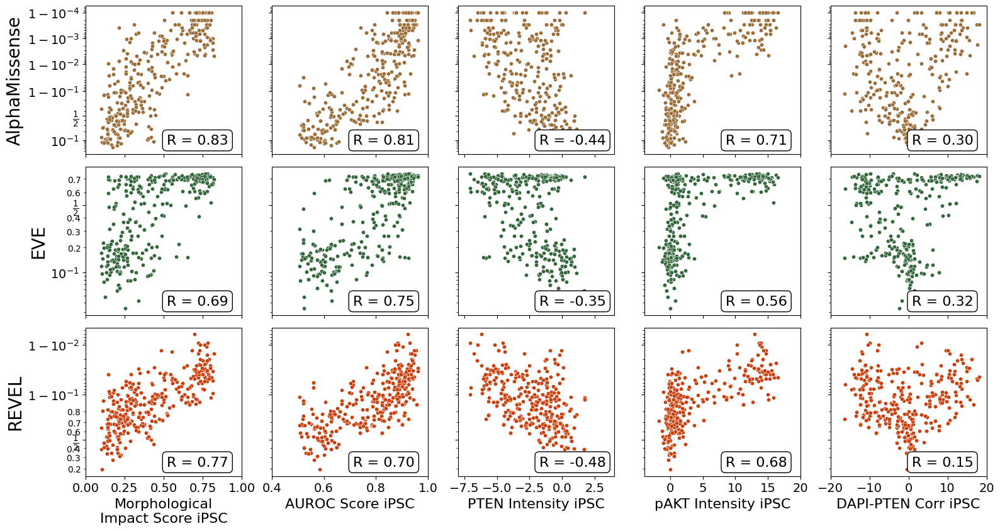

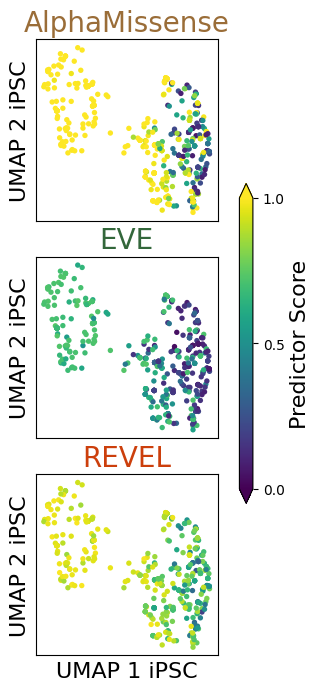

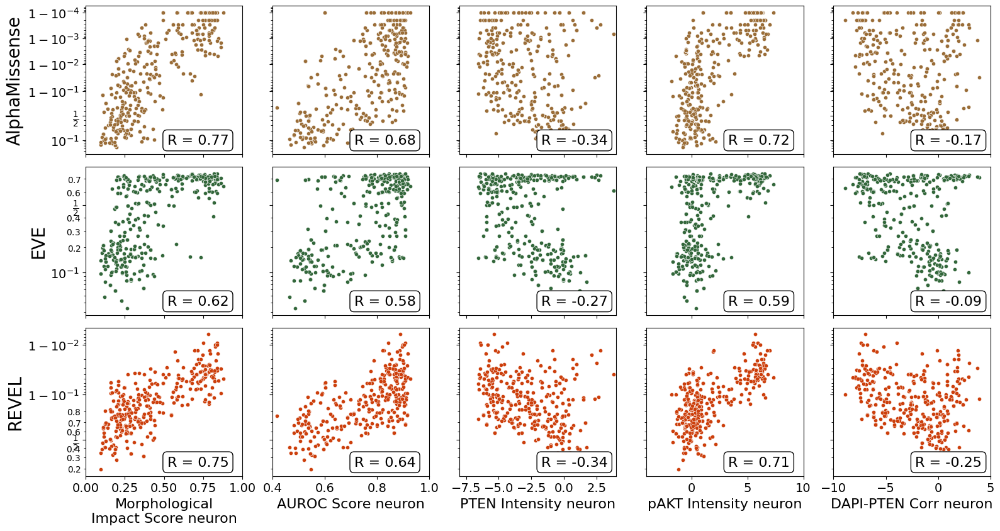

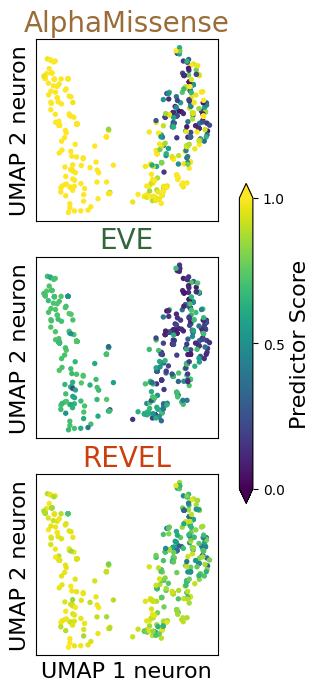

In [82]:
# Analyze VEP correlation with scores, features, UMAP
# Get merged VEP scores
spliceAI_filtered_variants['am_pathogenicity'] =\
    spliceAI_filtered_variants['am_pathogenicity'].clip(-0.0001,1-0.0001)
pten_VEP_merged = \
    pd.merge(
        pd.merge(
            spliceAI_filtered_variants\
                .rename(columns={'protein_variant':'Variant',
                                 'am_pathogenicity':'AlphaMissense'}),
            pten_variants_EVE.rename(columns={'EVE_scores_ASM':'EVE'}),
            on='Variant',
            how='inner'
        ),
        pten_variants_REVEL,
        on='Variant',
        how='inner'
    )\
    .merge(roc_auc_pten_ipsc,   on='Variant', how='left')\
    .merge(roc_auc_pten_neuron, on='Variant', how='left')

# Plot VEP scores against MIS, landmark features
landmark_features = \
    ['Intensity_MeanIntensity_CH1',
     'Intensity_MeanIntensity_CH3_Corrected',
     'Correlation_Correlation_CH0_CH1']
landmark_features_iPSC = \
    [l+'_iPSC' for l in landmark_features]
landmark_features_neuron = \
    [l+'_neuron' for l in landmark_features]
features = {}
features['iPSC']   = ['Morphological Impact Score iPSC',   'AUC ROC iPSC']   + landmark_features_iPSC
features['neuron'] = ['Morphological Impact Score neuron', 'AUC ROC neuron'] + landmark_features_neuron
df_toplot = \
    df_profiles_merged\
        .merge(pten_VEP_merged,on='Variant',how='inner')\
        [['Variant','EVE','REVEL','AlphaMissense',
          'UMAP1 iPSC','UMAP2 iPSC',
          'UMAP1 neuron','UMAP2 neuron',
          'Morphological Impact Score iPSC','Morphological Impact Score neuron',
          'AUC ROC iPSC', 'AUC ROC neuron']]\
        .merge(variant_medians_merged,on='Variant',how='inner')
lim_features = {
    'Morphological Impact Score iPSC':[0,1],
    'Morphological Impact Score neuron':[0,1],
    'AUC ROC iPSC':[0.4,1],
    'AUC ROC neuron':[0.4,1],
    'Intensity_MeanIntensity_CH1_iPSC':[-8,4],
    'Intensity_MeanIntensity_CH1_neuron':[-8,4],
    'Intensity_MeanIntensity_CH3_Corrected_iPSC':[-4,20],
    'Intensity_MeanIntensity_CH3_Corrected_neuron':[-4,10],
    'Correlation_Correlation_CH0_CH1_iPSC':[-20,20],
    'Correlation_Correlation_CH0_CH1_neuron':[-10,5]
}
name_features = {
    'Morphological Impact Score iPSC':'Morphological\nImpact Score iPSC',
    'Morphological Impact Score neuron':'Morphological\nImpact Score neuron',
    'AUC ROC iPSC':'AUROC Score iPSC',
    'AUC ROC neuron':'AUROC Score neuron',
    'Intensity_MeanIntensity_CH1_iPSC':'PTEN Intensity iPSC',
    'Intensity_MeanIntensity_CH1_neuron':'PTEN Intensity neuron',
    'Intensity_MeanIntensity_CH3_Corrected_iPSC':'pAKT Intensity iPSC',
    'Intensity_MeanIntensity_CH3_Corrected_neuron':'pAKT Intensity neuron',
    'Correlation_Correlation_CH0_CH1_iPSC':'DAPI-PTEN Corr iPSC',
    'Correlation_Correlation_CH0_CH1_neuron':'DAPI-PTEN Corr neuron'
}
predictors = ['AlphaMissense', 'EVE', 'REVEL']
colors = {
    'AlphaMissense': '#9A6D38',
    'EVE':           '#33673B',
    'REVEL':         '#CC3F0C'
}

# 3) fill in each cell
for k, cl in enumerate(['iPSC','neuron']):
    fig, axs = plt.subplots(
        nrows=len(predictors),
        ncols=len(features[cl]),
        figsize=(3* len(features[cl]) + 1, 3 * len(predictors)),
        sharex='col',
        sharey='row'
    )
    for i, pred in enumerate(predictors):
        for j, feat in enumerate(features[cl]):
            ax = axs[i, j]
            sns.scatterplot(
                data=df_toplot,
                x=feat, y=pred,
                ax=ax,
                color=colors[pred],
                s=20,
                legend=False
            )
            # compute & annotate Pearson r
            sub = df_toplot[[feat, pred]].dropna()
            r, _ = ss.pearsonr(sub[feat], logit(sub[pred]-0.00001))
            ax.text(
                0.52, 0.05,
                f"R = {r:.2f}",
                transform=ax.transAxes,
                fontsize=16,
                va='bottom',
                bbox=dict(
                    boxstyle="round,pad=0.3",  # rounded box with a little padding
                    facecolor="white",         # fill color
                    edgecolor="black",         # box edge color
                    linewidth=1                # edge line width
                )
            )
            ax.set_xlim(lim_features[feat])
            # logistic scale for the VEP scores
            ax.set_yscale("logit")
            # only bottom row gets x-labels
            if i == len(predictors) - 1:
                ax.set_xlabel(name_features[feat], fontsize=16)
                ax.tick_params(labelsize=14)
            else:
                ax.set_xlabel("")  # hide intermediate x-labels
            # only first column gets y-labels
            if j == 0:
                ax.set_ylabel(pred, fontsize=20)
                ax.tick_params(labelsize=14)
            else:
                ax.set_ylabel("")
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    fig.savefig(f"./consensus_plots/PTENT3.{cl}.VEPbylandmarkfeatures.052025.pdf", dpi=300)

    #Plot VEP scores on UMAP
    cmap = plt.cm.viridis
    norm = mcolors.Normalize(vmin=0, vmax=1, clip=True)
    
    # set up 3-panel UMAP
    fig, axs = plt.subplots(figsize=(2.7, 8), nrows=3, sharex=True, sharey=False)
    for ax, pred in zip(axs, ['AlphaMissense','EVE','REVEL']):
        sc = ax.scatter(
            df_toplot['UMAP1 '+cl],
            df_toplot['UMAP2 '+cl],
            c = df_toplot[pred],
            cmap = cmap,
            norm = norm,
            s = 15,
            edgecolors='none'
        )
        ax.set_title(pred, fontsize=20, color=colors[pred])
        ax.set_ylabel('UMAP 2 '+cl, fontsize=16)
        ax.set_xticks([]); ax.set_yticks([])
    
    # make room on the right for the colorbar
    axs[-1].set_xlabel('UMAP 1 '+cl, fontsize=16)
    fig.subplots_adjust(right=0.8)
    
    # add a single colorbar outside the 3 plots
    cbar_ax = fig.add_axes([0.88, 0.3, 0.05, 0.4])  # [left, bottom, width, height]
    cbar = fig.colorbar(sc, cax=cbar_ax, extend='both')
    cbar.set_label('Predictor Score', fontsize=16)
    cbar.set_ticks([0, 0.5, 1])
    
    plt.show()
    fig.savefig(f"./consensus_plots/PTENT3.{cl}.VEPonUMAP.052025.pdf", dpi=300, bbox_inches='tight')
